<h1 style="color:#ffc0cb;font-size:70px;font-family:Georgia;text-align:center;"><strong>Book Recommender System: EDA</strong></h1>

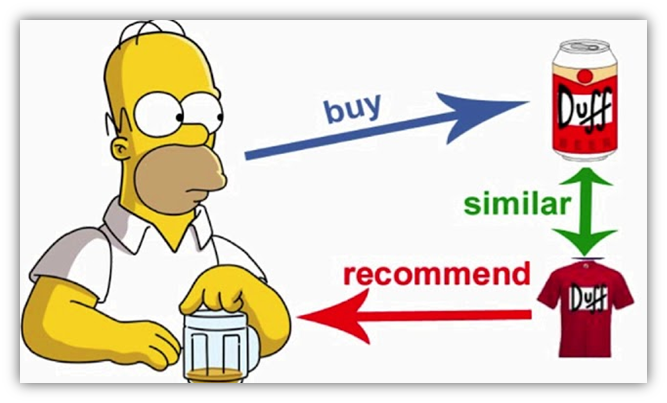

<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 📜 Table of Content</strong></h1>

### 1. [Data Preparation](#1)

1.1 [Introduction](#1.1)

1.2 [Target question for insights](#1.2)

1.3 [Importing Necessary Libraries and datasets](#1.3)

1.4 [Data Retrieving](#1.4)

1.5 [Data Information](#1.5)

<br>

### 2. [Data Cleaning](#2)

2.1 [About This Dataset](#2.1)

2.2 [Data Processing](#2.2)

> - 2.2.1 [Drop duplicate](#2.2.1) 
> - 2.2.2 [Rename columns](#2.2.2)
> - 2.2.3 [Drop columns](#2.2.3)
> - 2.2.4 [Drop the values 0 in Rating dataframe](#2.2.4)

2.3 [Check missing values](#2.3)

> - 2.3.1 [Detect missing values](#2.3.1)
> - 2.3.2 [Impute missing values](#2.3.2)
> - 2.3.3 [Delete missing values](#2.3.3)

2.4 [Upper Case the content](#2.4)

2.5 [Extra-whitespaces](#2.5)

2.6 [Split the location column](#2.6)

2.7 [Check the content](#2.7)

2.8 [Change data type](#2.8)

2.9 [Descriptive statistics for Central Tendency](#2.9)

2.10 [Age Range](#2.10)

2.11 [Merge column](#2.11)
> - 2.11.1 [Merge book and rating](#2.11.1)
> - 2.11.2 [Merge user and rating](#2.11.2)
> - 2.11.3 [Merge user_with_rating and book_with_rating](#2.11.3)

2.12 [Save the Intermediate data](#2.12)

<br>

### 3. [Data Exploration (EDA)](#3)

3.1 [Distribution of Rating](#3.1)

3.2 [How old are the users?](#3.2)

3.3 [The 10 country having the highest amount of users](#3.3)

3.4 [When did these books were published](#3.4)

3.5 [Average rating and number of ratings of the most popular books](#3.5)

3.6 [Average rating and number of ratings of the most popular authors](#3.6)

<br>

<a id="1"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> ✍️ 1. Data Preparation</strong></h1>

<a id="1.1"></a>
# ️🎯 1.1 Introduction
****

<p style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black"> 
    Thank to the growth of not only technology but also networking, the e-commercial activities has become more common so does ebook platform. Therefore, the recommender system works effectively in the ebook platform particularly, and the internet in general. There are two main algorithms for the recommender system using machine learning which are Content-based and Collaborative Filtering, nevertheless, their most considerable disadvantages are not capable of generating. Since then, I will also make recommendation base on the popularity of the books.
</p>

## 📣 What will you get after this notebook?

<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li> A Basic Recommender System using Content-based Collaborative Filtering and Popularity </li>
    <li> Factors influence on the recommendation </li>
</ul>

<a id="1.2"></a>
# ️🎯 1.2 Target question for insights
****
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Which <span style="color:#122ecc;">Book-Title </span> get the highest rating get Sepsis?</li>
</ul>

<a id="1.3"></a>
# ✴️ 1.3 Importing Necessary Libraries and datasets
****

In [1]:
# Install a conda package in the current Jupyter kernel
import sys
!{sys.executable} -m pip -q install missingno
!{sys.executable} -m pip -q install squarify
!{sys.executable} -m pip -q install geopandas


# work with data in tabular representation
from datetime import time
import pandas as pd
# round the data in the correlation matrix
import numpy as np
import os


# Modules for data visualization
import seaborn as sns
# overwrite the style of all the matplotlib graphs
sns.set()
import matplotlib.pyplot as plt


pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

# Ensure that our plots are shown and embedded within the Jupyter notebook itself. Without this command, sometimes plots may show up in pop-up windows
%matplotlib inline



# ignore DeprecationWarning Error Messages
import warnings
warnings.filterwarnings('ignore')


import EDAfunctions as f #This one is for functions in python
from dataprep.clean import validate_country #This one is for splitting


In [2]:
# check the version of the packages
print("Numpy version: ", np.__version__)
print("Pandas version: ",pd.__version__)
! python --version

Numpy version:  1.22.3
Pandas version:  1.3.4
Python 3.9.7


<a id="1.4"></a>
# 📲 1.4 Data Retrieving
***
In order to load data properly, the data in csv file have to be examined carefully. First of all, all the categories are seperated by the "," and strip the extra-whitespaces at the begin by setting "skipinitialspace = True".

> **User Dataset**

In [3]:
## Importing the datasets
user = pd.read_csv("Data/Book-Users.csv", delimiter=';', skipinitialspace = True, encoding='cp1252')

user.columns = user.columns.str.replace(' ', '') #strip the extra-whitespaces out

print("The shape of the ORGINAL data is (row, column):", str(user.shape))

# drop Unnamed, it is just a number given to identify each house
user.head(3)

The shape of the ORGINAL data is (row, column): (278858, 3)


,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN


> **Book Dataset**

In [4]:
## Importing the datasets
book = pd.read_csv("Data/Book_List.csv", delimiter=';', skipinitialspace = True, encoding='cp1252', on_bad_lines='skip')

book.columns = book.columns.str.replace(' ', '') #strip the extra-whitespaces out

print("The shape of the ORGINAL data is (row, column):", str(book.shape))

# drop Unnamed, it is just a number given to identify each house
book.head(3)

The shape of the ORGINAL data is (row, column): (271360, 8)


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...


> **Rating Dataset**

In [5]:
## Importing the datasets
rating = pd.read_csv("Data/Book_Ratings.csv", delimiter=';', skipinitialspace = True, encoding='cp1252', on_bad_lines='skip')

rating.columns = rating.columns.str.replace(' ', '') #strip the extra-whitespaces out

print("The shape of the ORGINAL data is (row, column):", str(rating.shape))

# drop Unnamed, it is just a number given to identify each house
rating.head(3)

The shape of the ORGINAL data is (row, column): (1149780, 3)


,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0


<a id="1.5"></a>
# 🔈 1.5 Data Information
****
Let's take a look in three dataset.
> **Sample Book Dataset**

In [6]:
print ("The shape of the Book data is (row, column):"+ str(book.shape))
print (book.info())

The shape of the Book data is (row, column):(271360, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB
None


### ------------> OBSERVATION
***
From this, the information that I gained from the train dataset are the total paitent record is 271360 with some of the missing values

> **Sample User Dataset**

In [7]:
print ("The shape of the User data is (row, column):"+ str(user.shape))
print (user.info())

The shape of the User data is (row, column):(278858, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB
None


### ------------> OBSERVATION
***
From this, the information that I gained from the train dataset are the total paitent record is 271360 with some of the missing values

> **Sample Rating Dataset**

In [8]:
print ("The shape of the Rating data is (row, column):"+ str(rating.shape))
print (rating.info())

The shape of the Rating data is (row, column):(1149780, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB
None


### ------------> OBSERVATION
***
From this, the information that I gained from the train dataset are the total paitent record is 599 with no missing and it has 11 columns.

<a id="2"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 🧹 2. Data Cleaning</strong></h1>

<a id="2.1"></a>
# 🦄 2.1 About This Dataset
***

<p style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">There are 3 dataset: </p>

<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>User dataset (train.csv)</li>
    <li>Rating dataset (test.csv)</li>
    <li>Book dataset (test.csv)</li>
</ul>

<p style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">Now let's go through the features and describe a little: </p>

***
**Categorical:** 
            
- **Ordinal**(just like nominal datatype but can be ordered or ranked)
   > - **Age** (User age) : this could be numerical and ordinal since it can be ordered
   > - **Book-Rating** (Book Rating) : this could be numerical and ordinal since it can be ordered
   
- **Norminal**(just like nominal datatype but can be ordered or ranked)
   > - **Book-Title** (Book Title)
   > - **Book-Author** (Book Title)
   > - **Publisher** (Publisher)
   > - **Image-URL-S** (Image-URL-S)
   > - **Image-URL-M** (Image-URL-M)
   > - **Image-URL-L** (Image-URL-L)
   > - **User-ID** (Image-URL-L)
   > - **Location** (Location)

   
***
**Numeric:**
- **Discrete**
  >  - **Book-Rating** (Book Rating)
  >  - **Year-Of-Publication** (Book Rating)

<a id="2.2"></a>
# ✂️ 2.2 Data Processing
***

<a id="2.2.1"></a>
## ❌ 2.2.1 Drop duplicate
****

> **Sample User Dataset**

In [9]:
print ("The shape of the data set before dropping duplicated:"+ str(user.shape))

user = user.drop_duplicates()

print ("The shape of the data set after dropping duplicated:"+ str(user.shape))

The shape of the data set before dropping duplicated:(278858, 3)
The shape of the data set after dropping duplicated:(278858, 3)


> **Sample Rating Dataset**

In [10]:
print ("The shape of the data set before dropping duplicated:"+ str(rating.shape))

rating = rating.drop_duplicates()

print ("The shape of the data set after dropping duplicated:"+ str(rating.shape))

The shape of the data set before dropping duplicated:(1149780, 3)
The shape of the data set after dropping duplicated:(1149780, 3)


> **Sample Book Dataset**

In [11]:
print ("The shape of the data set before dropping duplicated:"+ str(book.shape))

book = book.drop_duplicates()

print ("The shape of the data set after dropping duplicated:"+ str(book.shape))

The shape of the data set before dropping duplicated:(271360, 8)
The shape of the data set after dropping duplicated:(271360, 8)


<a id="2.2.2"></a>
## 📌 2.2.2 Rename columns
***

> **Sample user Dataset**

In [12]:
user.rename(columns={"User-ID": "User_ID"}, inplace=True)

> **Sample rating Dataset**

In [13]:
rating.rename(columns={"User-ID": "User_ID", "Book-Rating":"Book_Rating"}, inplace=True)

> **Sample book Dataset**

In [14]:
book.rename(columns={"Book-Title": "Book_Title", "Book-Author": "Book_Author",
                     "Year-Of-Publication":"Publication_year", "Image-URL-S":"Image_URL",
                     "Image-URL-M":"Image_URL_M", "Image-URL-L":"Image_URL_L",
                    }, inplace=True)

<a id="2.2.3"></a>
## 📌 2.2.3 Drop columns
***
I do not want to store all images size for all book, so that I just want to keep the `Image_URL_S` column

In [15]:
book = book.drop(columns=['Image_URL_M', 'Image_URL_L'])

<a id="2.2.4"></a>
## 📌 2.2.4 Drop the values `0` in Rating dataframe
***


In [16]:
rslt_df = rating[(rating['Book_Rating'] == 0)]
print(len(rslt_df)/len(rating) * 100)

62.28226269373272


### ------------> OBSERVATION
***
Most of the users gave 0 rating point. In the machine learning, when the user do not rate the book, that means the rate values is null. Nevertheless, the machine classifies it as 0 same with the users who gave 0 value. Hence the rating 0 values is recognised as the "implicit" rating which represents an interactive activities that either are positive or negative of the users for a specific item. 

In [17]:
rating.drop(rating[(rating["Book_Rating"] == 0)].index, inplace = True)

<a id="2.3"></a>
# 👀 2.3 Check missing values 
***

<a id="2.3.1"></a>
## 🔎 2.3.1 Detect missing values 
****

> **Sample user Dataset**

Missing values in the user dataframe in descending: 
       Total  Percent
Age  110762    39.72


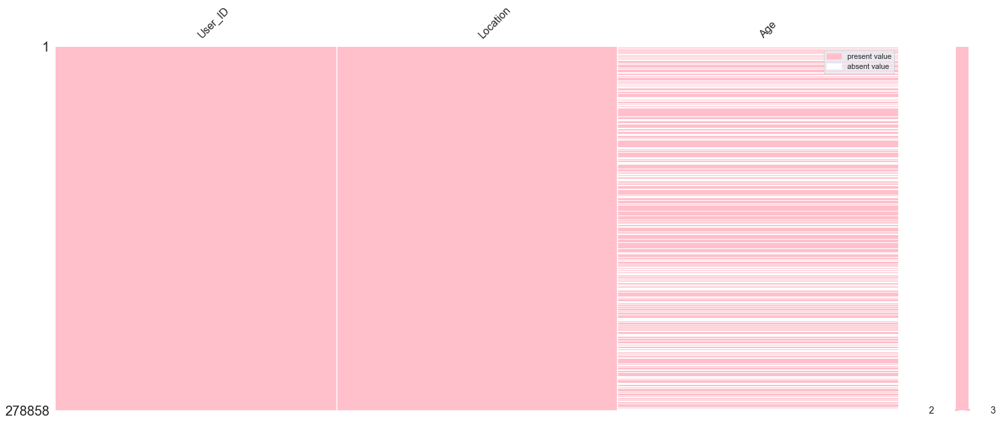

In [18]:
f.draw_missing_plot(user)

### ------------> OBSERVATION
***
The amount of missing values of Age column is considerable, I still want to fill them, since I still want to use both of collaborating filtering and content based.

> **Sample rating Dataset**

Missing values in the user dataframe in descending: 
 Empty DataFrame
Columns: [Total, Percent]
Index: []


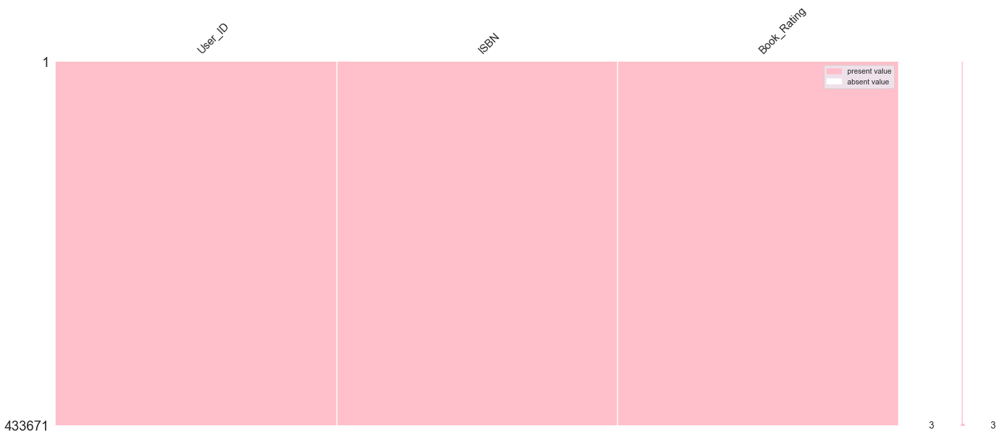

In [19]:
f.draw_missing_plot(rating)

### ------------> OBSERVATION
***
There are no missing values.

> **Sample book Dataset**

Missing values in the user dataframe in descending: 
              Total  Percent
Publisher        2      NaN
Book_Author      1      NaN


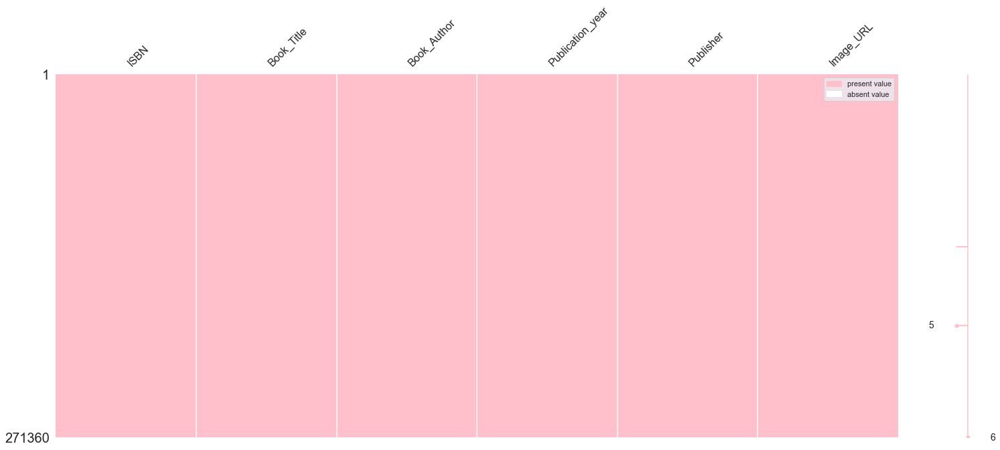

In [20]:
f.draw_missing_plot(book)

### ------------> OBSERVATION
***
There are just 3 three null values I do not want to try to fill them, I will delete them instead since they cannot effect the dataset.

<a id="2.3.2"></a>
## 🔎 2.3.2 Impute missing values 
****

> **Sample user Dataset**

In [21]:
user['Age'].fillna(int(user['Age'].mean()), inplace=True)

<a id="2.3.3"></a>
## 🔎 2.3.3 Delete missing values 
****

In [22]:
book = book.dropna(axis = 0, how ='any')

<a id="2.4"></a>
# 💭 2.4 Upper Case the content
****

> **Sample Book Dataset**

In [23]:
# # Cast all values inside the dataframe (except the columns' name) into upper case.
book = book.applymap(lambda s: s.upper() if type(s) == str else s)
book.head(3)

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
0,0195153448,CLASSICAL MYTHOLOGY,MARK P. O. MORFORD,2002,OXFORD UNIVERSITY PRESS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0195153448.0...
1,0002005018,CLARA CALLAN,RICHARD BRUCE WRIGHT,2001,HARPERFLAMINGO CANADA,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0002005018.0...
2,0060973129,DECISION IN NORMANDY,CARLO D'ESTE,1991,HARPERPERENNIAL,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0060973129.0...


> **Sample User Dataset**

In [24]:
# # Cast all values inside the dataframe (except the columns' name) into upper case.
user = user.applymap(lambda s: s.upper() if type(s) == str else s)
user.head(3)

,User_ID,Location,Age
0,1,"NYC, NEW YORK, USA",34.0
1,2,"STOCKTON, CALIFORNIA, USA",18.0
2,3,"MOSCOW, YUKON TERRITORY, RUSSIA",34.0


> **Sample Rating Dataset**

In [25]:
# # Cast all values inside the dataframe (except the columns' name) into upper case.
rating = rating.applymap(lambda s: s.upper() if type(s) == str else s)
rating.head(3)

,User_ID,ISBN,Book_Rating
1,276726,0155061224,5
3,276729,052165615X,3
4,276729,0521795028,6


<a id="2.5"></a>
# 💭 2.5 Extra-whitespaces
****

In [26]:
# remove all the extra whitespace
f.whitespace_remover(user)
f.whitespace_remover(rating)

<a id="2.6"></a>
# 💭 2.6 Split the location column
****

In [27]:
# #Expand columns:
user_location_expanded = user.Location.str.split(',', 2, expand=True)
user_location_expanded.columns = ['City', 'State', 'Country']
user = user.join(user_location_expanded)
#Drop column Location:
user.drop(columns=['Location', 'City', 'State'], inplace=True)
user = user.dropna(axis = 0, how ='any')

user.head()

,User_ID,Age,Country
0,1,34.0,USA
1,2,18.0,USA
2,3,34.0,RUSSIA
3,4,17.0,PORTUGAL
4,5,34.0,UNITED KINGDOM


## Recheck

In [28]:
f.check_content(user, 'Country')

 USA
 CANADA
 UNITED KINGDOM
 GERMANY
 SPAIN
 AUSTRALIA
 ITALY

 FRANCE
 PORTUGAL
 NEW ZEALAND
 NETHERLANDS
 SWITZERLAND
 BRAZIL
 CHINA
 SWEDEN
 INDIA
 AUSTRIA
 MALAYSIA
 ARGENTINA
 SINGAPORE
 FINLAND
 BELGIUM
 MEXICO
 DENMARK
 IRELAND
 PHILIPPINES
 TURKEY
 POLAND
 PAKISTAN
 GREECE
 IRAN
 ROMANIA
 CHILE
 ISRAEL
 SOUTH AFRICA
 INDONESIA
 NORWAY
 JAPAN
 CROATIA
 SOUTH KOREA
 SLOVAKIA
 NIGERIA
 CZECH REPUBLIC
 RUSSIA
 YUGOSLAVIA
 HONG KONG
 TAIWAN
 COSTA RICA
 ENGLAND, UNITED KINGDOM
 SLOVENIA
 PERU
 VIETNAM
 VENEZUELA
 EGYPT
 BULGARIA
 COLOMBIA
 SPAIN"
 LUXEMBOURG
 HUNGARY
 THAILAND
 GHANA
 PORTUGAL"
 SAUDI ARABIA
 ESPAÑA
 UNITED ARAB EMIRATES
 CALIFORNIA, USA
 BOSNIA AND HERZEGOVINA
 SRI LANKA
 DENMARK"
 ICELAND
 SWEDEN"
 PARAGUAY
 GUATEMALA
 BANGLADESH
 ANDORRA
 LITHUANIA
 UKRAINE
 LATVIA
 BOLIVIA
 BAHAMAS
 NEW YORK, USA
 TEXAS, USA
 JAMAICA
 ECUADOR
 BRITISH COLUMBIA, CANADA
 LEBANON
 PANAMA
 CUBA
 KUWAIT
 LA FRANCE
 MOROCCO
 MALTA
 FRANCE"
 SCOTLAND
 TRINIDAD AND TOBAGO
 ALBANIA
 L`I

### ------------> OBSERVATION
***
There are some of the error in the `Country` columns. I realise this column is the name of the columns so I want to use the library `dataprep` and use `validate_country()` function to check the country name.

In [29]:
error_country = user['Country'][~validate_country(user['Country'])]

print("The percent that countries have error: " +str(len(error_country)/ len(user) * 100))

The percent that countries have error: 2.8007286915110305


### ------------> OBSERVATION
***
Since the percentage is small so I want to drop them.

In [30]:
user.loc[user['Country'].isin(error_country), 'Country'] = 'NA'
user.loc[user['Country'].str.contains('USA'), 'Country'] = 'AMERICA'
user.drop(user[user['Country'].isin(['NA'])].index, inplace = True)

## Strip some of the extra whitespaces in `Country`

In [31]:
empty_string_country = user[user.Country == ''].Country.count()
nan_country = user.Country.isnull().sum()
print(f'There are {empty_string_country} entries with empty strings, and {nan_country} NaN entries in the Country field')
user.drop(user[user['Country'].isin([''])].index, inplace = True)

There are 0 entries with empty strings, and 0 NaN entries in the Country field


<a id="2.7"></a>
# ️🎧 2.7 Check the content:
****

> **Sample Book Dataset**

In [32]:
f.check_content(book, 'Book_Title')

SELECTED POEMS
LITTLE WOMEN
WUTHERING HEIGHTS
THE SECRET GARDEN
DRACULA
THE NIGHT BEFORE CHRISTMAS
ADVENTURES OF HUCKLEBERRY FINN
JANE EYRE
PRIDE AND PREJUDICE
GREAT EXPECTATIONS
NEMESIS
BLACK BEAUTY
MASQUERADE
FRANKENSTEIN
BELOVED
EMMA
LEGACY
THE GIFT
THE WIND IN THE WILLOWS
THE WEDDING
JOURNEY
MACBETH
THE PROMISE
SACRIFICE
THE SECRET
SENSE AND SENSIBILITY
PSYCHOLOGY
PARADISE
ROBINSON CRUSOE
ILLUSIONS
FAHRENHEIT 451
DREAMCATCHER
HEIDI
KING LEAR
HANNIBAL
DINOSAURS
THE HOBBIT
PHONICS FUN: READING PROGRAM, PACK 4 (CLIFFORD THE BIG RED DOG)
FLESH AND BLOOD
BEST FRIENDS
CARRIE
CINDERELLA
MIRAGE
SISTERS
THE TWO TOWERS (THE LORD OF THE RINGS, PART 2)
WHEN THE WIND BLOWS
THE EDGE
EYE OF THE BEHOLDER
MADAME BOVARY
THE RETURN OF THE KING (THE LORD OF THE RINGS, PART 3)
HOMECOMING
ASHES TO ASHES
REMEMBER ME
MATILDA
SECRETS
THE PRINCE
ANNE OF GREEN GABLES
UNNATURAL CAUSES
PETER PAN
TREASURE ISLAND
SLEEPING BEAUTY
ON THE ROAD
FINDERS KEEPERS
WHISPERS
COLLECTED POEMS
LOVE
THE VELVETEEN RABBIT
MOBY 

THE ANDROMEDA STRAIN
THIS CALDER SKY
BLOOD MOON
UNDER FIRE
THE GLASS LAKE
BROTHERS IN ARMS
HORSE HEAVEN
TEMPTING FATE
KISS AND TELL
THE HORSE WHISPERER
THAT CAMDEN SUMMER
WILD
HAPPY TO BE HERE
CLOUDS OF WITNESS
COMANCHE MOON
SHEPHERD
ROALD DAHL'S REVOLTING RHYMES
GATHER TOGETHER IN MY NAME
THE SIMPLE TRUTH
EVERYTHING TO GAIN
LOVE MEDICINE
MISTAKEN IDENTITY
GETTING ORGANIZED
THE RED BADGE OF COURAGE
BRIDAL BARGAINS: SECRETS TO THROWING A FANTASTIC WEDDING ON A REALISTIC BUDGET (BRIDAL BARGAINS: SECRETS TO THROWING A FANTASTIC WEDDING ON A REALISTIC BUDGET)
TIGANA
CARIBBEAN
ALL THE PRESIDENT'S MEN
A SONG FOR ARBONNE
LOVE ME WITH FURY
ENCHANTMENT
FINDING MOON
THIEF OF SOULS
STARFARERS
ON WRITING
BAUDOLINO
SMOKESCREEN
CRIMINAL INTENT
OBSESSIONS
THE GOOD APPRENTICE
A CARIBBEAN MYSTERY
WHITE SHARK
THE BEAST
BLACK SAND
THINK AND GROW RICH
THIRST
SEARCH THE SHADOWS
PRIVATEERS
ABSOLUTE ZERO
KINDRED SPIRITS
THE BARTERED BRIDE
DEMOCRACY
DEEP LIE
ALL I WANT FOR CHRISTMAS
BLUE LIGHT
SHADY LADY
WATE

GOOD OMENS: THE NICE AND ACCURATE PROPHECIES OF AGNES NUTTER, WITCH
ALL OR NOTHING
SEEING VOICES: A JOURNEY INTO THE WORLD OF THE DEAF
VANCOUVER
PRINCIPLES OF ACCOUNTING
THE BLIND ASSASSIN
MADE IN AMERICA
THE WISHSONG OF SHANNARA
DOUBLE DEUCE
AROUND THE WORLD IN 80 DAYS
SAVANNAH BLUES
MEDUSA
TRAVESTIES
THE 25TH HOUR
DER REGENMACHER.
FINAL BLACKOUT
TIME BOMB
THE SUNNE IN SPLENDOUR
WHO PUT THAT HAIR IN MY TOOTHBRUSH?
COLD MOUNTAIN
TURTLE DIARY
READINGS FOR WRITERS
11 HARROWHOUSE
THE ANNOTATED ALICE: ALICE'S ADVENTURES IN WONDERLAND AND THROUGH THE LOOKING GLASS
THE HEART OF A WOMAN
MAIN
IN COLD BLOOD
LIZZIE
EL CASTILLO
FACES
THE ENCYCLOPEDIA OF SERIAL KILLERS
TOXIC PARENTS: OVERCOMING THEIR HURTFUL LEGACY AND RECLAIMING YOUR LIFE
HUMAN RESOURCE MANAGEMENT
THE LAST PRINCESS
SPANDAU PHOENIX
STILETTO
UPGRADING &AMP; FIXING PCS FOR DUMMIES
THE THROWBACK
COCKTAILS FOR THREE
NOCTURNE
IN NAME ONLY
PRESIDENTIAL ANECDOTES
EL PROFETA
ATTABOY, SAM!
SON DE MAR
GLAMORAMA
THE SEXUAL LIFE OF CATHERINE 

THE PROTOCOL
SIRENS
DOUBLE FUDGE
SHILOH SEASON
THE BEST CHRISTMAS PAGEANT EVER
MIDNIGHT BRIDE
WILD AT HEART
STREETS OF LAREDO
DAVE BARRY TURNS 40
ONCE UPON A DREAM
THE MILLIONAIRE NEXT DOOR: THE SURPRISING SECRETS OF AMERICA'S WEALTHY
CARETAKERS
VAMPIRE JUNCTION
FOUNDATION TRILOGY
SHELTER FROM THE STORM
SEASONS
WHAT MY SISTER REMEMBERED
FAMILY MATTERS
A SECRET FRIEND
FINDING YOUR ROOTS
THE CARETAKER
THE COMPLETE BOOK OF BREASTFEEDING
CARS
WOMEN WHO LOVE TOO MUCH
UP THE DOWN STAIRCASE
INDISCRETIONS
FAMILY AFFAIR
TALES VULGAR UNICORN
BLIND SIDE
LEGACY OF LIES
SCOUNDREL
BOY-CRAZY STACEY (BABY-SITTERS CLUB, 8)
SECRETS (GLENBROOKE)
RECKLESS HEART
FROM THIS DAY
MORNING, NOON AND NIGHT
THE RESORT
THE MOTE IN GOD'S EYE
84 CHARING CROSS ROAD
ENDLESS LOVE
LAST WISH
LOVE STORIES
INTERSTELLAR PIG
LITTLE RED RIDING HOOD
GOD OF TAROT
MOUTHING THE WORDS
THIS HEART OF MINE
CREATIVE VISUALIZATION
OUR GAME
ALL TOMORROW'S PARTIES
EMERALD ENCHANTMENT
THE EXPLODING SUNS: THE SECRETS OF THE SUPERNOVAS
ANOTH

CHARLOTTE BRONTE: A PASSIONATE LIFE
ENCYCLOPEDIA BROWN BOY DETECTIVE (ENCYCLOPEDIA BROWN (PAPERBACK))
CANDIDE (PENGUIN POPULAR CLASSICS)
THE WORM IN THE APPLE : HOW THE TEACHER UNIONS ARE DESTROYING AMERICAN EDUCATION
SPACE PATROL
THE KIDNAPPING OF COURTNEY VAN ALLEN AND WHAT'S-HER-NAME
THE LAST DISCO IN OUTER MONGOLIA
THE GENIE IN THE BOTTLE: 64 ALL NEW COMMENTARIES ON THE FASCINATING CHEMISTRY OF EVERYDAY LIFE
COOKING SCHOOL MURDERS
EL SENOR DE LAS MOSCAS
SECRETS OF THE BABY WHISPERER: HOW TO CALM, CONNECT, AND COMMUNICATE WITH YOUR BABY
TRUE LIES
ALMOST FIFTEEN
PLATEFORME
WILD PITCH
QUILTER'S COMPLETE GUIDE
CHARLOTTE BRONTÃ©
THE BRIDGE AT ANDAU
LORETTA LYNN: COAL MINER'S DAUGHTER
CHICAGO'S BEST-KEPT SECRETS
STEPS IN TIME
NEW HOPE FOR THE DEAD
IGGIE'S HOUSE
THE MASTER PUPPETEER
GREAT-LOOKING 2 X 4 FURNITURE
INVENTING MEMORY: A NOVEL OF MOTHERS AND DAUGHTERS
A SONG FOR THE ASKING
HAND OF PROPHECY
ALDO ICE CREAM
SECRETS OF THE FLESH: A LIFE OF COLETTE
MAYBE (MAYBE NOT): SECOND THOUGHTS

THE CREEK
CUMBRES BORRASCOSAS
TOM SULLIVAN'S ADVENTURES IN DARKNESS
RED SORGHUM: A NOVEL OF CHINA
SONGS IN ORDINARY TIME
THE BLACK ICE
HOW TO WRITE BETTER BOOK REPORTS (STUDENT SURVIVAL POWER)
PREGNANCY, BIRTH AND FAMILY PLANNING
A TIME-TRAVEL CHRISTMAS
WINGED MAGIC
SCHÃ?Â¶NHAUSER ALLEE.
FROM REVERENCE TO RAPE: THE TREATMENT OF WOMEN IN THE MOVIES
SCHOOL FOR THE BLIND
INTIMATE MATTERS: A HISTORY OF SEXUALITY IN AMERICA
AFTERIMAGE
THE EASTER STORY
POISON
SOMETHING BORROWED, SOMETHING BLACK: A PETER MACKLIN NOVEL
FEATHER CROWNS
BLOOMING: A SMALL-TOWN GIRLHOOD
PASSION: PHOTOGRAPHY FROM THE MOVIE THE PASSION OF THE CHRIST
PROMISE OF GOLD
THE FALL OF BERLIN 1945
58 MINUTES
DIE JURY
THE GEMINI CONTENDERS
NIGHTFLYERS
THE BOY OF THE THREE-YEAR NAP
WHITE WIDOW
HELEN AND DESIRE
NEANDERTHALS AT WORK: HOW PEOPLE AND POLITICS CAN DRIVE YOU CRAZY...AND WHAT YOU CAN DO ABOUT THEM
BAREFOOT IN THE PARK
THE MAGICAL WORLDS OF HARRY POTTER: A TREASURY OF MYTHS, LEGENDS, AND FASCINATING FACTS
LOVERBOY
BROA

NO HEROES, NO VILLAINS: THE STORY OF A MURDER TRIAL
THE TOWER AT STONY WOOD
NEW ENGLAND
DIMENSIONS: A CASEBOOK OF ALIEN CONTACT
STAR FLIGHT
AMPHIGOREY TOO
WASHINGTON GOES TO WAR
THE COSMIC CODE: QUANTUM PHYSICS AS THE LANGUAGE OF NATURE
10000 DREAMS INTERPRETED
PRINCE OF DARKNESS
HOME AT LAST
DARK JOURNEY
STILL GLIDES THE STREAM
THE BLUE DEEP
MANGROVE SQUEEZE
THE HORSE YOU CAME IN ON
MY DARLING MELISSA
THE FIFTH ELEPHANT: A NOVEL OF DISCWORLD
GOLDEN RENDEZVOUS
VIOLATION
THE BESTSELLER
TURN HOMEWARD, HANNALEE
DRAGONS OF WINTER NIGHT (DRAGONLANCE: DRAGONLANCE CHRONICLES)
DEAD AND GONE
WATCHMEN
ACT OF LOVE
EVERYDAY ENLIGHTENMENT : THE TWELVE GATEWAYS TO PERSONAL GROWTH
A KIND OF GRACE : THE AUTOBIOGRAPHY OF THE WORLD'S GREATEST FEMALE ATHLETE
WHERE THE RAINBOW ENDS
AND I ALONE SURVIVED
FOOTBALL
NISA: THE LIFE AND WORDS OF A !KUNG WOMAN
SUFFER THE LITTLE CHILDREN
THE ADVERSARY: A TRUE STORY OF MONSTROUS DECEPTION
TENDING ROSES
THE SLIPPER
THE BOOK OF THE NAVAJO
AIR FERRETS ALOFT
HOW I SPEN

ZOMBIFICATION: STORIES FROM NATIONAL PUBLIC RADIO
SKY THE LIMIT
MY NAME IS CHELLIS
THE U.S. ARMED FORCES SURVIVAL MANUAL
BAIT AND SWITCH
WHORES OF LOST ATLANTIS: A NOVEL
MEMORY BOOK
CHARMED AND DANGEROUS
CYPRESS POINT
THE WREATH BOOK
PREACHER'S GIRL: THE LIFE AND CRIMES OF BLANCHE TAYLOR MOORE
WINONA'S WEB
FLUTE PLAYER
NEARER THAN THE SKY: A NOVEL
THE SHORT PROSE READER
THE BLUE BOTTLE CLUB
THIRTEEN MILES FROM SUNCREST
FAR FROM SHORE
SAVING ST. GERM
TOO MANY COOKS
SENSE AND SENSIBILITY (OXFORD WORLD'S CLASSICS)
DELICIOUSLY LOW
SELF ESTEEM
JUST AS I AM: THE AUTOBIOGRAPHY OF BILLY GRAHAM
GESUNDHEIT!: BRINGING GOOD HEALTH TO YOU, THE MEDICAL SYSTEM, AND SOCIETY THROUGH PHYSICIAN SERVICE, COMPLEMENTARY THERAPIES, HUMOR, AND JOY
THE EROTIC EDGE: EROTICA FOR COUPLES
THUNDER POINT
FIRE IN THE BELLY: ON BEING A MAN
BEING DEAD
THE VANISHED CHILD
DRIVING UNDER THE AFFLUENCE
LEANING, LEANING OVER WATER: A NOVEL IN TEN STORIES
NOSTRADAMUS AND HIS PROPHECIES
NOSTRADAMUS: THE MAN WHO SAW THROUGH TIM

NIXON: A LIFE
HARLOT'S MOON
STRESS
LOVE ME NOT
DEATH MASK
GOLDENEYE
THE SIGN OF FOUR
NIGHT WINDS
SESAME STREET UNPAVED: SCRIPTS, STORIES, SECRETS, AND SONGS
STRATEGIES FOR SUCCESSFUL WRITING: A RHETORIC, READER, AND HANDBOOK
THE RUSSIAN REVOLUTION
THE GLORIOUS CAUSE
SLOWING DOWN TO THE SPEED OF LIFE: HOW TO CREATE A MORE PEACEFUL, SIMPLER LIFE FROM THE INSIDE OUT
REINVENTING YOURSELF WITH THE DUCHESS OF YORK : INSPIRING STORIES AND STRATEGIES FOR CHANGING YOUR WEIGHT AND YOUR LIFE
THE AYN RAND LEXICON: OBJECTIVISM FROM A TO Z
A GLOSSARY OF LITERARY TERMS
DEATH IN STILL WATERS: A CHESAPEAKE BAY MYSTERY
THE MIND'S I: FANTASIES AND REFLECTIONS ON SELF AND SOUL
THE GOLDEN ROAD
LA TEMPÃ?ÂªTE
A BEAR CALLED PADDINGTON
THE GIRL FROM BAREFOOT HOUSE
UNE PRIÃ?Â¨RE POUR OWEN
A VIRTUOUS WOMAN
MULTIPLE CHOICE
THE DEVIL'S REDHEAD
L'ATTRAPE-COEURS
THE BABYSITTER
SOLDAT D'ARETÃ?Âª
TIMESHADOW RIDER
BROKEN DISHES (FOWLER, EARLENE)
MUTANT
THE PROCEDURE
SECOND BOOK OF SWORDS
LES RACINES DU MAL
STAINLESS
ST

NOT MY FATHER'S WAR
SERVICE WITH A SMILE
TEST PATTERN
THE MARRIAGE LESSON
LEWIS CARROLL
ONE NIGHT
MOURNING GLORY
A DANCE THROUGH TIME (TIME PASSAGES ROMANCE)
THE GREATEST LOVER IN ALL ENGLAND
SPELLFALL
THE GODMOTHER'S WEB
TRISTESSE ROYALE. DAS POPKULTURELLE QUINTETT.
BLACK SHEEP
EMBRACING THE BELOVED: RELATIONSHIP AS A PATH OF AWAKENING
THE PUNISHER
THE SNOW GEESE: A STORY OF HOME
NOTES FROM AN EVEN SMALLER ISLAND
LA CHIMERA
BEFORE THE CRADLE FALLS
ALLES TÃ?Â¶CHTER AUS GUTER FAMILIE. ROMAN.
THE AGE OF MISSING INFORMATION
LOOK HOMEWARD ANGEL
SON OF HOLMES
COLLECTED SHORT STORIES
THE BOOK LOVER'S GUIDE TO THE INTERNET
FOREIGNER: A NOVEL OF FIRST CONTACT (DAW BOOK COLLECTORS)
THE DOLL HOSPITAL
MATLOCK PAPER
PROMISE ME TODAY
FASTEN YOUR SEAT BELTS: THE PASSIONATE LIFE OF BETTE DAVIS
A RAGE AGAINST HEAVEN
THE LONG LOST
LETTRE D'UNE AMOUREUSE MORTE
JUDGMENT DAY
DEAD BEAT
STRAIGHT A'S NEVER MADE ANYBODY RICH: LESSONS IN PERSONAL ACHIEVEMENT
MURDER ON ROUTE 66
ANNE FRANK: BEYOND THE DIARY : A 

DANCE TO THE PIPER
WHERE MIRACLES HAPPEN: TRUE STORIES OF HEAVENLY ENCOUNTERS
HUNGRY AS THE SEA
THE NEW WORLD ORDER
CRAZY PAVING
THE WHISPER OF THE RIVER
THE ADMIRAL'S BABY
GODSPEED
POESIES (WORLD CLASSICS)
THE PIPER'S TUNE
SUGAR CANE
PUMPING IRONY: WORKING OUT THE ANGST OF A LIFETIME
DESERT QUEEN: THE EXTRAORDINARY LIFE OF GERTRUDE BELL : ADVENTURER, ADVISOR TO KINGS, ALLY OF LAWRENCE OF ARABIA
DON'T THINK TWICE
HOW TO SHOOT AN AMATEUR NATURALIST
THE TITANIC, END OF A DREAM
SPIRIT OF SURVIVAL
SEE YOU LATER ALLIGATOR
QUEST
\BLACKADDER\""
ECSTASY
MANTISSA
DIXIE CITY JAM
CUENTOS COMPLETOS
CHILDHOOD RISING: THE ASTROLOGY OF YOUR MOTHER, YOUR FATHER, AND YOU
JUST IMAGINE
TALES OUT OF SCHOOL
THE LAST VAMPIRE : A NOVEL
FLIGHT OF THE DRAGON KYN
THE NEW JESSICA (SWEET VALLEY HIGH, NO 32)
THE UNDERSEA PEOPLE : THE EVE BUNTING COLLECTION
TALES OF TROY AND GREECE
HEARTTHROB
FOR FEAR OF THE NIGHT
ROEMER: MAN AGAINST THE MOB
FORFEIT
WHERE SHADOWS GO
ROMEO AND JULIET (FOLGER SHAKESPEARE LIBRARY)
ZU 

DEADLY HARVEST
NOTES FROM THE COUNTRY CLUB
VISIONS OF CODY
PERSIAN BRIDES
THE BLOOD OF THE LAMB
SMILE AND SAY MURDER (NANCY DREW FILES (PAPERBACK))
THAT'S FUNNY, YOU DON'T LOOK BUDDHIST: ON BEING A FAITHFUL JEW AND A PASSIONATE BUDDHIST
ENDURANCE: AN EPIC OF POLAR ADVENTURE
WOMEN AT WAR
BEOWULF
WITH YOU AND WITHOUT YOU
STARTIDE RISING (UPLIFT TRILOGY)
DESTINYS DAUGHTER
WOMEN WHO TRY TOO HARD: BREAKING THE PLEASER HABITS
HIGHLAND HEARTS (ZEBRA HISTORICAL ROMANCE)
TONIGHT OR NEVER (LEGENDARY LOVERS)
APPOINTED TO DIE
A DEAD MAN OUT OF MIND
UNE FEMME
FACES AT THE BOTTOM OF THE WELL: THE PERMANENCE OF RACISM
KISS THE MOON
MEMOIRS OF A DUTIFUL DAUGHTER
CAMELOT CAPER
ROCK 'N' ROLL BABES FROM OUTER SPACE
FOR THE CHILDREN'S SAKE (CHILD-LIFE BOOK)
PLOWING THE DARK
HALIDE'S GIFT
GLORY GAME
BEN HUR
NIGHT OF THE MAGICIAN
MY STROKE OF LUCK
BIRTHDAY
THE PAINTER
ALL WE KNOW OF HEAVEN
LAST RIGHTS: A NOVEL
DIE LENNOX- FALLE.
EMERALD ECSTASY
ELEGANCE
THE LAST PARTY: STUDIO 54, DISCO, AND THE CULTURE OF T

FEAST OF ALL SAINTS
COLLATERAL DAMAGE
ILSE WITCH (THE VOYAGE OF THE JERLE SHANNARA, BOOK 1)
THE HAWK AND THE DOVE
FATHERHOOD
THE TIPPING POINT: HOW LITTLE THINGS CAN MAKE A BIG DIFFERENCE
LONDON EMBASSY
THE GANGSTER OF LOVE
THE MAN IN THE WOODS
THE MISBEGOTTEN SON: A SERIAL KILLER AND HIS VICTIMS : THE TRUE STORY OF ARTHUR J. SHAWCROSS
PHOTOGRAPHY AND THE ART OF SEEING
CYCLOP. ROMAN.
WOLF AND IRON
MAID OF THE MIST
THE BOOK OF SPELLS
GLÃ?Â¼CKSSPIELER.
FADED COAT OF BLUE
MURDER AT THE MENDEL
SHADOWS OF GLORY
THE PROBABLE FUTURE
NO ONE TO TRUST
STONE ANGEL
HUNTING SEASON
THE MONK
WILD ANGEL
BAG OF BONES
THE ANGEL OF GALILEA
SEVEN ARROWS
CASTLE
SUNSET EMBRACE
THE PLACE OF DEAD ROADS
MATTER OF HONOUR
EAST OF THE MOUNTAINS
ACCUSTOMED TO THE DARK
CLIMBING MOUNT IMPROBABLE
SNOW LEOPARD
A PASSAGE TO INDIA
BEL AMI
ELIZABETH: THE STRUGGLE FOR THE THRONE
SAVAGE RUN
TEMPLE OF THE WINDS (SWORD OF TRUTH, BOOK 4)
HEART OF DARKNESS (BROADVIEW LITERARY TEXTS)
LOVE BEYOND REASON
GOJIRO
BALLS: A NOVEL
FIF

MERRICK (VAMPIRE CHRONICLES)
HOW TO TALK TO ANYONE, ANYTIME, ANYWHERE: THE SECRETS OF GOOD COMMUNICATION
GRIFT SENSE (TONY VALENTINE NOVELS)
DONA FLOR AND HER TWO HUSBANDS
GESTALT THERAPY
FOR CAUSE AND COMRADES: WHY MEN FOUGHT IN THE CIVIL WAR
POBBY AND DINGAN
SKYLARK
ARMAGEDDON SUMMER
GONE BAMBOO
HAMMER
ANGELA'S ASHES
ANGRY WOMEN
\SURELY YOU'RE JOKING, MR. FEYNMAN!\": ADVENTURES OF A CURIOUS CHARACTER"
LA ODISEA
JACOB THE BAKER: GENTLE WISDOM FOR A COMPLICATED WORLD
THE DARK HIGHLANDER
THE DANTE CLUB : A NOVEL
SUNSET IN ST. TROPEZ
THE SHADOW OF THE WINTER PALACE: RUSSIA'S DRIFT TO REVOLUTION, 1825-1917
THE SECOND WORLD WAR
WOMAN, THOU ART LOOSED: HEALING THE WOUNDS OF THE PAST
DER GESCHICHTENMACHER.
THE BRINK
THUNDER HEIGHTS
DIE TOTENWÃ?Â¤SCHERIN.
DIE LÃ?Â¶WIN VON AQUITANIEN. ROMAN.
TALENT
THE LOST BOY: A FOSTER CHILD'S SEARCH FOR THE LOVE OF A FAMILY
EIGHTY MILLION EYES
HURRICANE BAY
JOB: A COMEDY OF JUSTICE
QUEEN OF SORCERY (BELGARIAD (PAPERBACK))
DIE FÃ?Â¼NFTE FRAU.
DIE ASCHE MEINE

SUNSHINE FROM THE LATTER-DAY SAINT CHILD'S SOUL
BEANS: SEVENTY-NINE RECIPES FOR BEANS, LENTILS, PEAS, PEANUTS, AND OTHER LEGUMES
THE PARADOX OF MASS POLITICS: KNOWLEDGE AND OPINION IN THE AMERICAN ELECTORATE
CONSIDERATIONS ON THE CAUSES OF THE GREATNESS OF THE ROMANS AND THEIR DECLINE
WRITING FICTION: A GUIDE TO NARRATIVE CRAFT (5TH EDITION)
AMÃ¨RICA, AMÃ¨RICA: VIATGE PER CALIFÃ²RNIA I EL FAR-WEST (NARRATIVA)
JOY OF PHOTOGRAPHY: A GUIDE TO THE TOOLS &AMP; TECHNIQUES OF BETTER PHOTOGRAPHY
INSTANT MOMMY (BUNDLES OF JOY, DAUGHTERS OF TEXAS) (SILHOUETTE ROMANCE NO 1139)
FOOTBALL FOR DUMMIES, SECOND EDITION
THE LUNCH-BOX CHRONICLES: NOTES FROM THE PARENTING UNDERGROUND
THE COLLEGE COOKBOOK: AN ALTERNATIVE TO THE MEAL PLAN
ROBERT CREWS
LT: LIVING ON THE EDGE
THE FACE OF APOLLO (BOOK OF THE GODS, VOLUME 1)
JOHN HEDGECOE'S DARKROOM TECHNIQUES
YOU CAN BE THE STAINLESS STEEL RAT
MAKING MONEY ON THE INTERNET
COUNTRY SUCH AS THIS
GEORGIA O'KEEFFE: A LIFE
THE MEMORY OF RUNNING
PHOTOGRAPHY: A CONCIS

DEIN KÃ?Â¶RPER EIN GRAB.
500 CHAT-UP LINES
DON JUAN TENORIO: TRAIDOR, CONFESO Y MARTIR
HACKS
INSIDE THE ANIMAL MIND
DARK INTENT
AMMON AND THE KING (STEPPINGSTONE)
BEYOND CLIP ART: SUNDAY SAMPLER II : FINDING PEACE
THE HISTORY OF OUR WORLD BEYOND THE WAVE: A FANTASY
CADDY FOR LIFE : THE BRUCE EDWARDS STORY
ENOS PRAYS (STEPPINGSTONE)
THE BROKEN BOW (STEPPINGSTONE)
LEAD OR GET OFF THE POT! : THE SEVEN SECRETS OF A SELF-MADE LEADER
CAPTAIN MORONI'S TITLE OF LIBERTY (STEPPINGSTONE)
NEPHI AND LEHI IN PRISON (STEPPINGSTONE)
CONSTITUTIONAL LAW AND POLITICS
THE COMPLETE BLENDER COOKBOOK
JESUS VISITS THE NEPHITES (STEPPINGSTONE)
JESUS IS BORN (STEPPINGSTONE)
HOUSE OF THE SEVEN GABLES (OXFORD POCKET CLASSICS)
LATIN AMERICAN POLITICS AND DEVELOPMENT
FINAL THERAPY
MAKING OF THE REPRESENTATIVE FOR PLANET 8
MORE CELTIC FAIRY TALES
THE BERENSTAIN BEAR SCOUTS AND THE RIPOFF QUEEN (BERENSTAIN BEAR SCOUTS)
PERIBANEZ Y EL COMENDADOR DE OCANA
DO YOU LIKE IT HERE? (LAUREL-LEAF LIBRARY OF AMERICAN LITERATURE

ANATOL. DRAMEN 1888 - 1891.
THE UNSEEN GUEST
TRUMPED!: THE INSIDE STORY OF THE REAL DONALD TRUMP-HIS CUNNING RISE AND SPECTACULAR FALL
CORE VISUAL BASIC 5 (CORE SERIES)
TAKING RISKS (KIDS &AMP; KISSES)
VON DER FREUNDLICHKEIT DER MENSCHEN
COPING WITH WORKPLACE CHANGE: DEALING WITH LOSS AND GRIEF (A FIFTY-MINUTE SERIES BOOK)
THE RING OF FIVE DRAGONS (THE PEARL, BOOK 1)
ISIS, FÃ?Â¼RSTIN DER NACHT.
THE VIRGIN DIRECTORY OF WORLD MUSIC
DR. BLOODMONEY (P. K. DICK)
SCARY STORIES OMNIBUS
TOO MANY BABIES (DESIRE, NO 543)
DISNEY PRINCESS: A READ-ALOUD STORYBOOK (READ-ALOUD STORYBOOK)
SEDUCTION OF GOODY TWO-SHOES (INTO THE HEARTLAND) (INTIMATE MOMENTS, 1089)
DIE LICHTUNG.
THE POWER OF POSITIVE PARENTING : A WONDERFUL WAY TO RAISE CHILDREN
UNCHARTED WATERS (FAMILY SECRETS)
ESSEN SIE DOCH, WAS SIE WOLLEN. SELBSTBEWUÃ?Â?TSEIN STATT ERNÃ?Â¤HRUNGSKOMPLEXE.
EYE OF THE STORM (CROSSWINDS, NO 10)
SONNE, MOND UND LUFTBALLON
HAIKU. JAPANISCHE GEDICHTE.
EMANUEL LASKER: THE LIFE OF A CHESS MASTER
ALIEN MOONLIG

RIGHT DIRECTION (HOLLYWOOD DYSASTY) (HARLEQUIN TEMPTATION, 467)
THE VALACHI PAPERS
LA VENGANZA DE NOFRET
THE MERRY-GO-ROUND
THE EMPTY COCOON
SHE WHO LAUGHS, LASTS!
DIE FERNE HAUT: WIDER DIE BERÃ¼HRUNGSANGST
OWL OF THE DESERT
HOW TO SURVIVE ON $50,000 TO $150,000 A YEAR
MAYOR / EDWARD I. KOCH WITH WILLIAM RAUC
MURDER IN LITTLE ROCK
JAMAICA'S FIND
TESTIGO DE CARGO
THE BEST OF TREK, NO 4: FROM THE MAGAZINE FOR STAR TREK FANS
COGAN'S TRADE,
NURSES WHO KILL
SONG OF SILKIE
KLINGON FOR THE GALACTIC TRAVELER (STAR TREK: ALL)
THE STAR WARS COOKBOOK: WOOKIEE COOKIES AND OTHER GALACTIC RECIPES
TOUCHSTONES AND WELLSPRINGS: THE SURVIVOR'S GUIDE
ANOTHER SONG ABOUT THE KING
ICE!
THE PORTABLE GREEK HISTORIANS: THE ESSENCE OF HERODOTUS, THUCYDIDES, XENOPHON, POLYBIUS (VIKING PORTABLE LIBRARY (PAPER))
LOTTIE'S PRINCESS DRESS
AN AWFULLY BIG ADVENTURE
AS I HAVE LOVED YOU
IN THE PRESENCE OF ALIENS: A PERSONAL EXPERIENCE OF DUAL CONSCIOUSNESS
L.A. WOMAN
A VICTORIAN ROSE
SCHWIMMEN GEGEN BLOND
MCKAY'S MODERN 

FALCON'S PREY (HARLEQUIN PRESENTS, 471)
GARFIELD, BIGGER THAN LIFE
THE CROSSWORD OBSESSION: THE HISTORY AND LOVE OF THE WORLD'S MOST POPULAR PASTIME
VIDA: A NOVEL
CASTLES BURNING A CHILDS LIFE IN WAR
STOLEN THUNDER
CAGED TIGER (HARLEQUIN PRESENTS)
HOW TO AGGRAVATE A WOMAN EVERY TIME...&AMP; SEND HER SCREAMING OUT THE DOOR!: A BOOK FOR WOMEN AND THE MEN WHO ANNOY THEM
TO LOVE A STRANGER (KISMET)
FLAWED MARRIAG (HARLEQUIN PRESENTS)
COWBOYS DON'T QUIT (CODE OF THE WEST) (SILHOUETTE DESIRE, NO 944)
AUTOMNE-HIVER: ROMAN
AGATHA RAISIN AND THE TERRIBLE TOURIST (AN AGATHA RAISIN MYSTERY)
CHARLES RENNIE MACKINTOSH: GIFT BOOK (COLIN BAXTER GIFT BOOK SERIES)
THE MANAGER'S GUIDE TO INTERPERSONAL RELATIONS
EVERYDAY LIFE IN EARLY AMERICA
THE HAT OF MY MOTHER
MEDITATIONS METAPHYSIQUES
WESTERN MAN (SILHOUETTE ROMANCE, #231)
MY LESBIAN HUSBAND : LANDSCAPES OF A MARRIAGE
SOPHIE'S MASTERPIECE : A SPIDER'S TALE
THE CLAW OF THE CONCILIATOR (HIS THE BOOK OF THE NEW SUN, V. 2)
TRUSTING SARAH (HARLEQUIN HISTO

L'INFERNO: PROFONDO SUD, MALE OSCURO
LUCKY MAN, LUCKY WOMAN (NORTON PAPERBACK FICTION)
MERMAID'S SCAR (MERMAID SAGA)
MOTHERS: A NOVEL
MOSQUITOES: A NOVEL
INTIMATE KISSES: THE POETRY OF SEXUAL PLEASURE
MASQUES (BEAUTY AND THE BEAST, NO 2)
SEARCH FOR GRISSI
THE ANIME ART GALLERY : THE ART OF FUSHIGI YUGI (ANIME ART GALLERY)
MAGGIE ROWAN
MYSTERY ON THE MIDWAY (DALLAS O'NEIL MYSTERY SERIES)
POLLYANNA (WORDSWORTH CLASSICS)
ROMAN PEOPLE
MONTE SINAI
MIXED FEELINGS (GIRL TALK)
WINCHESTER VALLEY/GUNSMOKE GORGE (BUCKSKIN DOUBLE EDITION)
SON OF RUGBY JOKES
TOO LOUD, TOO BRIGHT, TOO FAST, TOO TIGHT:  WHAT TO DO IF YOU ARE SENSORY DEFENSIVE IN AN OVERSTIMULATING WORLD
CAN YOU COUNT?
THE BEST OF ANIMERICA : THE YEAR'S BEST ARTICLES, 2003 EDITION (THE BEST OF ANIMERICA)
CHRISTOPHER'S PARADE,
A GIFT TO MYSELF
THE KEY-LOCK MAN
ACCIDENTAL EMPIRES: HOW THE BOYS OF SILICON VALLEY MAKE THEIR MILLIONS, BATTLE FOREIGN COMPETITION, AND STILL CAN'T GET A DATE
A STAR FOR CHRISTMAS
LOVE IS STRONGER THAN DEATH
DR

UNE PARTIE DE CAMPAGNE
DESERT CAT (PARTNERS IN CRIME)
WHY ARE THE BRITISH BAD AT MANUFACTURING
SAY GOOD-BYE TO STRESS
DIRECT DESCENDANT
FORD BK MOD MANNRP
THE DIET ALTERNATIVE
THE ALCOHOLICS (VINTAGE CRIME/BLACK LIZARD)
SEA SIREN
FERRIS BEACH: A NOVEL
SULOINEN MYRKYNKEITTÃ¤JÃ¤: ROMAANI
BURNING BRIGHT: A PLAY IN STORY FORM (PENGUIN TWENTIETH CENTURY CLASSICS)
ANGELS DO HAVE WINGS (SEALED WITH A KISS) (HARLEQUIN ROMANCE, NO 3378)
LOVE'S BEAUTIFUL DREAM (JUNE MASTERS BACHER SERIES 3, VOL 2)
SONG IN A STRANGE LA (HARLEQUIN PRESENTS, NO 993)
SUSAN'S VIOLIN
LIFESAVER (KISMET)
THE 12TH PLANET (THE FIRST BOOK OF THE EARTH CHRONICLES)
MELT &AMP; POUR SOAPMAKING
AN ALTAR OF SOD
SUN-TZU: THE ART OF WARFARE : THE FIRST ENGLISH TRANSLATION INCORPORATING THE RECENTLY DISCOVERED YIN-CH'UEH-SHAN TEXTS (CLASSICS OF ANCIENT CHINA)
WORKS OF OSCAR WILDE
DEATH WALKER (ELLA CLAH)
QUICK COUNTRY CHRISTMAS QUILTS
THE ULTIMATE CROSS STITCH COMPANION: AN ENCYCLOPEDIA OF TECHNIQUES AND IDEAS WITH OVER 150 STEP-BY

ROSARIOS GESCHICHTE.
ZEIT DER ORANGEN.
MAN ENOUGH TO BE WOMAN
DREAMS: A WAY TO LISTEN TO GOD
HIS PRIVATE NURSE (SILHOUETTE SPECIAL EDITION, NO. 1482)
PURSUIT OF EXCELLENCE, THE
YOU MEAN SO MUCH TO ME
SWEET ABANDON
FODOR'S FAMILY ADVENTURES: MORE THAN 700 GREAT TRIPS FOR YOU AND YOUR KIDS OF ALL AGES (FODOR'S FAMILY ADVENTURES)
FORTUNE HUNTER (HARLEQUIN HISTORICAL, NO. 132)
THE CONCISE HISTORY OF IRELAND
MAKESHIFT MARRIAGE (HARLEQUIN ROMANCE)
WALT DISNEY : AN AMERICAN ORIGINAL
GIFT ASHER LEV-OPEN MKT
SWEET LIES,SATIN SIGHS (SILHOUETTE SPECIAL EDITION, NO. 648)
BUBBLE AND SQUEAK
STONE ANGELS
RAUKEN.
THE MONARCHY: AN ORAL BIOGRAPHY OF ELIZABETH II
SUDDEN STORM (EVANS NOVEL OF ROMANCE)
NIGHTS IN ARUBA
FERNANDO IST FUTSCH. PRIVATDETEKTIVIN BILLIE PINKERNELL. (AB 10 J.).
REAL-LIFE GHOST STORIES
TOYLAND
CODE OF DISHONOR (MACK BOLAN, NO 99)
LUST
DANCER FROM THE DANCE: A NOVEL (PLUME CONTEMPORARY FICTION)
GENERATION VICTORS
DANDELION, THE EXTRAORDINARY LIFE OF A MISFIT
VICAR OF WAKEFIELD: CLASS

WHEN I'M PRAISING GOD: DEVOTIONAL THOUGHTS ON WORSHIP FOR WOMEN
BABAJI MEETING WITH TRUTH
JACOB JINGLEHINDER (EARTH ANGELS)
MONSTER OF THE MONTH CLUB
101 WACKY FACTS ABOUT KIDS
COMPLETE BOOK OF JUICING:  YOUR DELICIOUS GUIDE TO YOUTHFUL VITALITY
BLACK HAWK: AN AUTOBIOGRAPHY (PRAIRIE STATE BOOKS)
CAST A SPELL
SMASHING LUMPKINS (POWERPUFF GIRLS CHAPTER BOOK, 10)
UNLOCKING SECRETS OF THE UNKNOWN WITH NATIONAL GEOGRAPHIC
VEGITARIAN: THE BEST - EVER RECIPE COLLECTION
FAMILIAR QUOTATIONS: A COLLECTION OF PASSAGES, PHRASES, AND PROVERBS TRACED TO THEIR SOURCES IN ANCIENT AND MODERN LITERATURE
CAFE PASQUAL'S COOKBOOK: SPIRITED RECIPES FROM SANTA FE
BELVA PLAIN: THREE COMPLETE NOVELS : BLESSINGS, WHISPERS, AND HOMECOMING
VALENTINE, TEXAS (HARLEQUIN ROMANCE, NO 3398)
SIGNATURE DISHES - WINE AND FOOD OF CALIFORNIA'S CENTRAL COAST WINERIES
THE LIFE AND ADVENTURES OF JOHN MUIR
THE NEW VEGETARIAN COOKBOOK
WYOMING WEDDING (HITCHED) (HARLEQUIN ROMANCE, NO 3428)
TEMPTATION (WHEELER LARGE PRINT BOOK SER

SPORTS HALL OF SHAME
FAT CITY
TRAVELING ON INTO THE LIGHT AND OTHER STORIES: AND OTHER STORIES
MAN WHO MET THE TRAIN: A CARL WILCOX MYSTERY
THE ART OF HUMAN-COMPUTER INTERFACE DESIGN
IN THE FOOTSTEPS OF ALEXANDER THE GREAT: A JOURNEY FROM GREECE TO ASIA
THE BOOK OF CHANGES: STORIES
GEFÃ?Â¼HL UND VERSTAND.
THE NIGHT THE HEADS CAME
RAPUNZEL'S DAUGHTERS : WHAT WOMEN'S HAIR TELLS US ABOUT WOMEN'S LIVES
SPEED TRIBES: CHILDREN OF THE JAPANESE BUBBLE
ARTHUR, FOR THE VERY FIRST TIME
P.S. WE'LL MISS YOU (FRIENDS 4-EVER, NO 1)
PINBALLS
THE ACTUAL (PENGUIN GREAT BOOKS OF THE 20TH CENTURY)
IT'S A WEIRD, WEIRD SCHOOL
BATTLE OF THE BUNHEADS (BAD NEWS BALLET, NO 2)
STRANGE BUT TRUE BASKETBALL STORIES (RANDOM HOUSE SPORTS LIBRARY)
THE SCALPEL AND THE BUTTERFLY:THE WAR BETWEEN ANIMAL RESEARCH AND ANIMAL PROTECTION
LES AMOURS BLESSÃ©ES: ROMAN
THE TRUTH ABOUT CASSANDRA (ZEBRA BALLAD ROMANCE)
THE LITTLE BOOK OF HAPPINESS
BAJA LEGENDS: THE HISTORIC CHARACTERS, EVENTS, AND LOCATIONS THAT PUT BAJA CALIFORNIA

A GRAVE FOR BOBBY: THE GREENLEASE SLAYING
ASPECTS OF ARISTOCRACY: GRANDEUR AND DECLINE IN MODERN BRITAIN (PENGUIN HISTORY)
THE NINTH MAN (COLLIER SPYMASTERS SERIES)
THE SHENANDOAH AFFAIR
WITH MY FACE TO THE ENEMY: PERSPECTIVES ON THE CIVIL WAR
HOT BLOOD: THE MONEY, THE BRACH HEIRESS, THE HORSE MURDERS (ST. MARTIN'S TRUE CRIME LIBRARY)
THERE/HOLLYWOOD
BLANCO SOBRE NEGRO
DEAR BILL, REMEMBER ME? AND OTHER STORIES
MISSION TO MARS
AN EYE ON ISRAEL
THE WINDOWS SHAREWARE 500/BOOK AND DISK SET
THE PHILOKALIA (THE COMPLETE TEXT, VOL 4)
THE WORLD ACCORDING TO WAVELETS: THE STORY OF A MATHEMATICAL TECHNIQUE IN THE MAKING
FORCE NINE
GOOD CONNECTIONS: A CENTURY OF SERVICE BY THE MEN &AMP; WOMEN OF SOUTHWESTERN BELL
TALES FROM SHAKESPEARE (BARRE)
THE HOLOCAUST: A HISTORY OF THE JEWS OF EUROPE DURING THE SECOND WORLD WAR
HUSBAND TO HOLD (LOVE INSPIRED, NO 136)
MUMMIES (TOTALLY WEIRD)
FAMOUS FLORIDA! UNDERGROUND GOURMET -- RESTAURANTS, RECIPES &AMP; REFLECTIONS
FIREFALL: HOW GOD HAS SHAPED HISTORY THR

CAMP GOOD DAYS JOKE BOOK A-Z
WHERE THE EVIL DWELLS
WRITERS INC: A STUDENT HANDBOOK FOR WRITING AND LEARNING
HEADACHES: 47 WAYS TO STOP THE PAIN (HEADACHES)
HAMLET (ARDEN EDITION OF THE WORKS OF WILLIAM SHAKESPEARE)
SOUP'S UNCLE
FROMMER'S PORTABLE PORTLAND (FROMMER)
METEOR!
DETECTIVE STORIES (STORY LIBRARY)
COLLINS GEM IRISH DICTIONARY (COLLINS GEM)
COOKIES (COOKING WITH BON APPETIT SERIES)
LET'S REVIEW: U.S. HISTORY AND GOVERNMENT (BARRON'S REVIEW COURSE SERIES)
COOKIN UP THE BLUES WITH TABASCO BRAND P
LOST BOYS : WHY OUR SONS TURN VIOLENT AND HOW WE CAN SAVE THEM
WISHBONE AND THE GLASS SLIPPER (WISHBONE'S TALES OF A PUP, NO. 1)
PRIVATE LIVES (TOM CLANCY'S NET FORCE; YOUNG ADULTS, NO. 9)
CAM JANSEN AND THE MYSTERY OF FLIGHT 54 (CAM JANSEN ADVENTURE)
CITY KIDS
NORTH AMERICAN TREES (EXCLUSIVE OF MEXICO AND TROPICAL UNITED STATES): A HANDBOOK DESIGNED FOR FIELD USE, WITH PLATES AND DISTRIBUTION MAPS
THE BEST AMERICAN SPORTS WRITING 2000
STIGMA : NOTES ON THE MANAGEMENT OF SPOILED IDENTITY

CHRISTIE MALRY'S OWN DOUBLE-ENTRY
QUITE SIMPLY A FLASH OF GENIUS: THE LIFE AND TIMES OF THE NORTHAMPTON TOWN LEGEND TOMMY FOWLER
THE EIFFEL TOWER
GOOD NEWS BIBLE: SUNRISE
BIG TROUBLE.
MARGARET THORNBY'S GUIDE TO THE TEA ROOMS OF BRITAIN
BROOKLYN: MY WORLD
POKEMON TALES : CHARAMANDER SEES A GHOST (POKEMON TALES)
BEST AMERICAN SHORT STORIES, 1986
THE GOOD WEB SITE GUIDE 2003
BLOOD AND HONOR/INSIDE THE SCARFO MOB--THE MAFIA'S MOST VIOLENT FAMILY
BUILDING WEB SITES WITH XML
A SON OF WAR
DIE DREI ? UND DIE GEFAHRLICHE ERBSCHAFT: DIE DREI ? UND DIE GEFAHRLICHE ERBSCHAFT
ANTIQUE GUNS: THE COLLECTOR'S GUIDE
THY BROTHERS WIFE
SAGESSE ANCIENNE, MONDE MODERNE
CULTIVATING INNER PEACE
LES LOIS DU CHAOS
LA SCIENCE ET L'HYPOTHÃ?Â¨SE
ET SI VOUS M'EXPLIQUIEZ LE BOUDDHISME ?
MAN WHO WOULD BE DADDY  (BUNDLES OF JOY/SPECIAL AUTHOR COVE) (SILHOUETTE ROMANCE, NO 1175)
L'ENTRAÃ?Â®NEMENT DE L'ESPRIT ET L'APPRENTISSAGE DE LA BIENVEILLANCE
QUMRAN
PORCUPINE RANCH (SILHOUETTE ROMANCES, NO 1221)
RECOLLECTIONS OF M

THE CRAFT OF THE JAPANESE SWORD
8 FAVORITE LITTLE CRITTER BOOKS JUST FOR YOU: JUST FOR YOU/JUST ME AND MY DAD/I WAS SO MAD/JUST GRANDMA AND ME/WHEN I GET BIGGER/JUST GO TO BED/ME T
TRUMPETER OF KRAKOW
LOVESONGS: THE LOVE POEMS OF BAROLONG SEBONI (FROM 1976 TO 1997)
MY ANXIETIES HAVE ANXIETIES: CARTOONS FROM YOU'RE YOU, CHARLIE BROWN AND YOU'VE HAD IT, CHARLIE BROWN (PEANUTS PARADE ; 18)
GOD'S TROMBONES: SEVEN NEGRO SERMONS IN VERSE (PENGUIN TWENTIETH-CENTURY CLASSICS)
BANG YOUR HEAD: THE RISE AND FALL OF HEAVY METAL
THE X-FILES : CONTAMINATION
THIS IS SAILING: A COMPLETE COURSE
B.C. BUT THERIOUSLY FOLKTH
REFLECTIONS: ESSAYS, APHORISMS, AUTOBIOGRAPHICAL WRITINGS
THE GIZA POWER PLANT : TECHNOLOGIES OF ANCIENT EGYPT
LORD OF THE DANCE (G.K. HALL LARGE PRINT BOOK SERIES)
THE FAILURE OF POLITICAL ISLAM
A MERRY DANCE AROUND THE WORLD: THE BEST OF ERIC NEWBY
MAD DOGS, ENGLISHMEN, AND THE ERRANT ANTHROPOLOGIST: FIELDWORK IN MALAYSIA
GRAVE SECRETS (DEADTIME STORIES , NO 8)
CAPITAL: A CRITIQUE OF

HOW COULD YOU DO IT, DIANE?
THE FATHERLAND FILES
THE CITY OF FADING LIGHT
NETHERGATE LOFTS HPB
SOLDIER OF ANOTHER FORTUNE (BOOK 3 OF THE DESTINY MAKERS)
BOYS LIKE HER: TRANSFICTIONS
ASSESSMENT OF ADDICTIVE BEHAVIORS
WORKSHOP SHORTCUTS: TIPS, TRICKS, JIGS &AMP; AIDS FOR WOODWORKERS
BEYOND THERAPY, BEYOND SCIENCE: A NEW MODEL FOR HEALING THE WHOLE PERSON
HOW TO ROCK CLIMB! (HOW TO ROCK CLIMB SERIES)
THE VIRGIN ISLANDS ALIVE GUIDE (ADVENTURE GUIDE TO THE VIRGIN ISLANDS)
BECAUSE I AM HUMAN
EXPECTANT BRIDE (THE GREEK TYCOONS) (HARLEQUIN PRESENTS 2091 : GREEK TYCOONS)
SLOW FEVER (FREEDOM VALLEY) (SILHOUTTE DESIRE, NO 1334)
CAROLYN WARRENDER'S BOOK OF STENCILLING
THE BACHELOR'S BED
THAT HOLIDAY FEELING (HARLEQUIN TEMPTATION, NO 73)
THE POCKET BARTENDER'S GUIDE
DAVID MEYER IS A MOTHER
HE WHO HESITATES (87TH PRECINCT SERIES)
AN INTIMATION OF THINGS DISTANT: THE COLLECTED FICTION OF NELLA LARSEN
OUTCOME MEASURES FOR CHILD WELFARE SERVICES: THEORY AND APPLICATIONS
DEATH AND DIGNITY: MAKING CHOICE

DISCOURSE ON COLONIALISM
BARTLEBY Y OTROS CUENTOS
THE PRESENCE OF THE PAST
HUMO (COLECCIÃ³N AUTORES ESPAÃ±OLES E HISPANOAMERICANOS)
WITZY'S BACKYARD EASTER HUNT (LITTLE SUZY'S ZOO)
BEYOND THE MOON : FROM THE AUTHOR OF THE HORN OF THE MOON COOKBOOK
TO LIVE WITH THE FAIRY FOLK: A GUIDE TO ATTRACT BENEVOLENT SPIRITS
ARTHUR'S LOOSE TOOTH (I CAN READ BOOK 2)
ARGEO HA MUERTO, SUPONGO (NOVELISTAS DEL DÃ­A)
SECOND NATURE (A-FORMAT)
LORD SAYER'S GHOST
ANTI-DUHRING
LAZARILLO DE TORMES: ANONIMO (LEER EN ESPANOL, LEVEL 3)
KEEP TALKING : COMMUNICATIVE FLUENCY ACTIVITIES FOR LANGUAGE TEACHING (CAMBRIDGE HANDBOOKS FOR LANGUAGE TEACHERS)
BY ANY MEANS NECESSARY
LEAVING HOME: SURVIVAL OF THE HIPPEST
THE DEVIL IN THE HILLS
QBQ! THE QUESTION BEHIND THE QUESTION
DREAM STORY (SUN AND MOON CLASSICS, 6)
CUANDO LAS HORAS VELOCES (MEMORIAS / CARLOS BARRAL)
AMERICAN EARL (SILHOUETTE DESIRE)
BUFFY THE VAMPIRE SLAYER : IMMORTAL (BUFFY THE VAMPIRE SLAYER)
THE BLACK PANTHERS SPEAK
THE OTHER SHORE
EL ARTE DE ECHAR LA

ANATOMY AND LIFE DRAWING
THE NAKED TRUTH: AN EXERCISE IN THERAPEUTIC STORYTELLING AND THE PRINCIPLES INVOLVED IN BECOMING FINALLY FREE
THE POCKET AUSTRALIAN WINE COMPANION
DRAWINGS OF REMBRANDT, VOL. 2
THE FAMILY DOCTOR (EMERGENCY!) (HARLEQUIN SUPERROMANCE, NO. 1051)
BETSY-TACY AND TIB
MEXICAN PET
HOOVER VS. THE KENNEDYS: THE SECOND CIVIL WAR
DUCHESS FOR A DAY
BUS FARE TO KENTUCKY: THE AUTOBIOGRAPHY OF SKEETER DAVIS
LA HISTORIA DEL MUNDO EN NUEVE GUITARRAS
ELUSIVE AS THE UNICORN (HARLEQUIN PRESENTS, 1258)
WHY DO CLOCKS RUN CLOCKWISE? AND OTHER IMPONDERABLES
RED PLAID SHIRT: STORIES
WELCOME TO HEAVENLY HEIGHTS
BALDUR'S GATE II: SHADOWS OF AMN (FORGOTTEN REALMS (PAPERBACK))
THE BLOOD ROAD: THE HO CHI MINH TRAIL AND THE VIETNAM WAR
SCHATTENKUSS.
A LITTLE SPANISH COOKBOOK
A LITTLE SAN FRANCISCO COOKBOOK
UNABRIDGED MARILYN : HER LIFE FR
RINGMASTER!
HEIRS TO LOVE
NORMAN ROCKWELL'S CHRISTMAS BOOK
THE SCENT OF STONE
DAUGHTERS OF BRITANNIA: THE LIVES AND TIMES OF DIPLOMATIC WIVES
JUDE THE OBSCU

HOW TO START A BUSINESS WEBSITE (THE 21ST CENTURY ENTREPRENEUR)
REFUGE: AN UNNATURAL HISTORY OF FAMILY AND PLACE
WAVE 4: NETWORK MARKETING IN THE 21ST CENTURY
THE ELVES' PROPHECY: THE BOOK OF BEING
JACK PUMPKINHEAD OF OZ (THE WONDERFUL OZ BOOKS, #23)
BEAGLE IN TROUBLE (SUPER SLEUTH II)
THE US ARMED FORCES NUCLEAR, BIOLOGICAL AND CHEMICAL SURVIVAL MANUAL
THE LETTUCE LEAF BIRTHDAY LETTER
ONE UP ON WALL STREET: HOW TO USE WHAT YOU ALREADY KNOW TO MAKE MONEY IN THE MARKET
VELVET BOND (HARLEQUIN HISTORICAL, NO 282)
ROSIE PLANTS A RADISH: A LIFT-THE-FLAP NATUR BOOK WITH REAL SEEDS (LIFT-THE-FLAP NATURE BOOKS WITH REAL SEEDS)
AN INSTANT GUIDE TO EDIBLE PLANTS
FRANKENSTEIN: THE ORIGINAL 1818 TEXT (BROADVIEW LITERARY TEXTS)
SOUR GRAPES (WORLDWIDE LIBRARY MYSTERIES)
LITTLE WIZ/STORIES / (FABULOUS FIVE : BOOK, NO 2)
MCSE NETWORKING ESSENTIALS FOR DUMMIES
MATT CALDWELL: TEXAS TYCOON (LONG, TALL TEXANS) (SILHOUETTE SPECIAL EDITION, 1297)
MICROSOFT EXCEL 2000: MOUS CHEAT SHEET (CHEAT SHEET)
BELOVED 

AFTER THE LIGHT: WHAT I DISCOVERED ON THE OTHER SIDE OF LIFE THAT CAN CHANGE YOUR WORLD
RUNNER'S HANDBOOK (A PENGUIN HANDBOOK)
MOINS QUE ZÃ?Â©RO
ALL RIGHT, OKAY, YOU WIN
PLAY BALL
THE LONG CLOSE CALL
MÃ?Â¶RDER IN MANHATTAN.
DOCTOR FRIGO
MOJAVE WELLS
TWILIGHT SECRETS: TWILIGHT SECRETS
ROMAN NIGHTS AND OTHER STORIES
TALES OF THE GRAND TOUR
L'AMANT DE LADY CHATTERLEY
EVIL ANGELS (CRY IN THE DARK MOVIE TITLE)
ALLIES &AMP; ALIENS
TALES OF THE WITCH WORLD 1
ANNA KARÃ?Â©NINE
DAS REGISTER.
UNEARTHED ARCANA (DUNGEONS &AMP; DRAGONS)
BRAIN WAVE
TALES OF THE WITCH WORLD 2 (TALES OF THE WITCH WORLD)
ROCK STAR/SINNERS DUO
MARRYING STONE
DE L'AMOUR ET AUTRES DÃ?Â©MONS
THE ESSENTIALS OF ELECTROMAGNETICS I (ESSENTIALS)
GOODBYE TO BERLIN (PENGUIN CLASSICS)
SURFACE ACTION
OLYMPIA
DOUZE CONTES VAGABONDS
DAS BROT DER FRUHEN JAHRE
ALL YOUR HEALTH QUESTIONS ANSWERED NATURALLY (ALL YOUR HEALTH QUESTIONS ANSWERED NATURALLY)
HERZSPRÃ?Â¼NGE.
NOVELLEN UND GEDICHTE.
D'AMOUR ET D'OMBRE
MOMENT OF TRUTH LOW PRICE
UN 

CATWOMAN
IF LOOKS COULD KILL: THE LADY'S FOR HIRE THE JOB IS MURDER
IDLE GOSSIP: A LEO GOLD MYSTERY (LEO GOLD MYSTERIES)
PIE IN THE SKY
TOUCH THE WILD WIND
THE OTHER SIDE OF THE DOOR
THE TIME OF ILLUSION
TNT POWER WITHIN YOU
TOO CLOSE TO THE EDGE
BUILDING A THREE-WAY PARTNERSHIP: THE LEADER'S ROLE IN LINKING SCHOOL, PARENTS, AND COMMUNITY (SCHOLASTIC LEADERSHIP POLICY RESEARCH)
THE AQUARIUS TRANSFER
DIE CHINESISCHE MAUER
THE MAGIC OF DIALOGUE : TRANSFORMING CONFLICT INTO COOPERATION
CONTACT THE OTHER SIDE: SEVEN METHODS FOR AFTERLIFE COMMUNICATION
EXPLORATION OF THE UNIVERSE (SAUNDERS GOLDEN SUNBURST SERIES)
THREE MOTHERS AND A CRADLE
A HISTORY OF ZIONISM
KIWI TASCHENBÃ?Â¼CHER, NR.27, DIE LEGENDE VOM HEILIGEN TRINKER
THE MESSAGE OF THE CRYSTAL SKULL: FROM ATLANTIS TO THE NEW AGE (LLEWELLYN'S NEW AGE SERIES)
SAJO UND IHRE BIBER.
GLAMOURY: MAGIC OF THE CELTIC GREEN WORLD (LLEWELLYN'S CELTIC WISDOM SERIES)
IN THE HALL OF THE DRAGON KING (THE DRAGON KING TRILOGY, BOOK 1)
ZOBOA
MARCHEN
'TIS

JESSE JAMES WAS HIS NAME OR FACT AND FICTION CONCERNING THE CAREERS OF THE NOTORIOUS JAMES BROTHERS OF MISSOURI
SHEPHERD OF THE HILLS
THE DEAD TOWNS OF SUNBURY, GA., AND DORCHESTER, S.C
NIGHT OF THE COUGAR (APACHE WARS SAGA)
THE NO-NONSENSE GUIDE TO FAIR TRADE (NO-NONSENSE GUIDES)
DACHSHUNDS FOR DUMMIES
PHILOSOPHICAL INVESTIGATIONS (3RD EDITION)
GARDNER'S PHOTOGRAPHIC SKETCHBOOK OF THE CIVIL WAR
THE BOOK OF NOTHING : VACUUMS, VOIDS, AND THE LATEST IDEAS ABOUT THE ORIGINS OF THE UNIVERSE
SALLY ANN AT THE BALLET (YOUNG HIPPO - SALLY ANN STORIES)
DREAM DANCER
SKATEBOARD BOOK
AN EYEWITNESS HISTORY OF SLAVERY IN AMERICA: FROM COLONIAL TIMES TO THE CIVIL WAR
SPOCK MESSIAH (STAR TREK)
LIFE FOR ME AIN'T BEEN NO CRYSTAL STAIR
DEVIL WORLD (STAR TREK)
THE ESSENTIAL TOURING CYCLIST: A COMPLETE COURSE FOR THE BICYCLE TRAVELER
TOFU COOKERY
THE 72 NAMES OF GOD: TECHNOLOGY FOR THE SOUL
CRANKING UP A FINE WAR
THE MYSTERY OF COTTAGE COVE (A HALEY ADVENTURE BOOK)
THE TRELLISANE CONFRONTATION
THE NIGHT LO

CLASSIC SCRAPBOOKING:  THE ART &AMP; CRAFT OF CREATING A BOOK OF MEMORIES
DIE MÃ?Â¼HLE AM FLUSS.
PURPLE DOTS: A NOVEL
THE DEEP SPACE NINE TECHNICAL MANUAL (STAR TREK: DEEP SPACE NINE)
NEW YORK CITY FOR DUMMIES
IT'S A CAT'S LIFE: TRUE STORIES WITH PRACTICAL HELP FOR YOUR CAT FROM BIRTH TO OLD AGE
LOOK INSIDE CROSS-SECTIONS: CARS
WHERE HAVE ALL THE BULLETS GONE?
THE ADVAITA OF ART
MIDNIGHT RIDERS: THE STORY OF THE ALLMAN BROTHERS BAND
RESUMES THAT GET JOBS: RESUME SERVICE
GHOST A LA MODE
WENDELL GETS DRESSED (WENDELL'S WORLD)
LIVING THE DREAM: AN OUTLINE FOR A LIFE IN FICTION
HOW IT ENDED (BLOOMSBURY PAPERBACKS)
EXPLORATIONS AND ADVENTURES IN ARIZONA AND NEW MEXICO
COUGAR (HARPER TROPHY BOOKS (PAPERBACK))
ORIGINS: WHAT NEW DISCOVERIES REVEAL ABOUT THE EMERGENCE OF OUR SPECIES AND ITS POSSIBLE FUTURE
STATE STREET
MRS. POOTER'S DIARY
VERDI HÃ?Â¶REN UND STERBEN. EIN ROMAN AUS VENEDIG UND DEM VENETO.
FUNNY BOY TAKES ON THE CHIT-CHATTING CHEESE FROM CHATTANOOGA (LAF)
HIGHLIGHTS OF NEW ZEALAND

UNDERSTANDING SOCIAL PROBLEMS, POLICIES AND PROGRAMS (SOCIAL PROBLEMS AND SOCIAL ISSUES)
CHURCH SOCIAL WORK: HELPING THE WHOLE PERSON IN THE CONTEXT OF THE CHURCH
THE FIELD PLACEMENT SURVIVAL GUIDE: WHAT YOU NEED TO KNOW TO GET THE MOST FROM YOUR SOCIAL WORK PRACTICUM (BEST OF THE NEW SOCIAL WORKER, 2)
S.S. GENERAL
LEARN GERMAN: THE LAZY WAY (MACMILLAN LIFESTYLES GUIDE)
BEHAVIORAL MANAGEMENT GUIDE: ESSENTIAL TREATMENT STRATEGIES FOR ADULT PSYCHOTHERAPY
DIE ELSTER AUF DEM GALGEN. EIN ROMAN AUS DER ZEIT PIETER BRUEGELS.
BETTER THAN A LEMONADE STAND: SMALL BUSINESS IDEAS FOR KIDS (KID'S BOOKS BY KIDS)
THE SOCIAL WORK INTERVIEW
DER SCHÃ¶NE VOGEL PHÃ¶NIX: ERINNERUNGEN E. DREISSIGJÃ¤HRIGEN (SUHRKAMP-TASCHENBÃ¼CHER ; 527)
FOOD, FOOD, FOOD: A FEAST OF GREAT CARTOONS
DER VORLESER: ROMAN
VILLAGE ELDERS
LOVE FROM WALES: AN ANTHOLOGY
CAREERS IN SOCIAL WORK
DES TEUFELS ALTERNATIVE.
HOW TO BE TEXAN
A CHILD'S LIFE AND OTHER STORIES
TOO TOUGH TO DIE: DOWN AND DANGEROUS WITH THE U.S. MARSHALS
CONQUERIN

LUCY JANE AND THE RUSSIAN BALLET
DIE TÃ?Â¶CHTER MARIA THERESIAS.
THE SPITTING IMAGE TREASURE ISLAND
THE UPSIDE-DOWN GIRL
THE FACES OF FEAR
ADLER UND ENGEL.
HEAVEN EYES (SIGNATURE S.)
NOTES FROM A SCHOOLTEACHER
THE BREASTFEEDING BOOK : EVERYTHING YOU NEED TO KNOW ABOUT NURSING YOUR CHILD FROM BIRTH THROUGH WEANING
THE CHARTERHOUSE OF PARMA (MODERN LIBRARY PAPERBACK CLASSICS)
I'D SCREAM EXCEPT I LOOK SO FABULOUS : A CATHY COLLECTION
CELIA'S SECRET: THE COPENHAGEN PAPERS
THE SNOW ANGEL (FOREVER ANGELS)
FROM FRONT PORCH TO BACK SEAT: COURTSHIP IN TWENTIETH-CENTURY AMERICA
RAILROADS OF WESTERN TEXAS: SAN ANTONIO TO EL PASO
DUTCH SOCCER DRILLS
GOD'S LITTLE INSTRUCTION BOOK FOR NEW BELIEVERS (GOD'S LITTLE INSTRUCTION BOOKS)
AMERICA IS IN THE HEART: A PERSONAL HISTORY (WASHINGTON PAPERBACKS, WP-68)
THE EUROPEAN AND THE INDIAN: ESSAYS IN THE ETHNOHISTORY OF COLONIAL NORTH AMERICA
MINIATURE ROSES (NEW PLANT LIBRARY)
PS GOD LOVES YOU TOO!
THE PLEASURES OF THE PAST
STORIES FROM THE RIVER OF MERCY:

UNDERTOW: A NOVEL
TAX HAVENS: HOW TO BANK, INVEST, AND DO BUSINESS-OFFSHORE AND TAX FREE
LESBIAN PASSION : LOVING OURSELVES AND EACH OTHER
DON'T SIT UNDER THE GRITS TREE WITH ANYONE BUT ME
JUGGERNAUT: THE GERMAN WAY OF BUSINESS : WHY IT IS TRANSFORMING EUROPE-AND THE WORLDHE WORLD
A STUNNING WAY TO DIE (LADY MARGARET PRIAM SERIES)
THE LOVING DOMINANT
SLEEPING BEAUTY (EXPORT)
DER BOROWSKI - BETRUG. ROMAN.
A NAME OF HER OWN (THE TENDER TIES HISTORICAL SERIES)
AN UNOFFICIAL ROSE
DAS ALPHABET DER FRAUEN.
MURDER WITHIN MURDER
DEATH TAKES BOW
DEATH RIDES AN ILL WIND
THE LAND ENDURES
HASTENED TO THE GRAVE: THE GYPSY MURDER INVESTIGATION
SPIDER IN THE SINK: A KATE MULCAY MYSTERY (KATE MULCAY MYSTERY)
FLOWERS FOR MRS. LUSKIN (TRUE CRIME (AVON BOOKS).)
JUST DESSERTS Ã£ MARTHA STEWART: THE UNAUTHORIZED BIOGRAPHY
DER POMPEJANER. HISTORISCHER ROMAN.
YOU'RE THE BEST!
DOWN UNDER ALL OVER: A LOVE AFFAIR WITH AUSTRALIA
DAS BOROWSKI - ULTIMATUM. ROMAN.
CONATUS
A HIDDEN CAUSE OF MURDER
DAS NIBELUNGENLIED

PRINTEMPS ET AUTRES SAISONS
THE BEST OF SEASONS MENU COOKBOOK
J'Ã?Â©TAIS LÃ?Â  AVANT
LA VIE MODERNE
THE CANADIAN FRONTIER, 1534-1760 (HISTORIES OF THE AMERICAN FRONTIER (PAPERBACK))
LA CHAMBRE DES OFFICIERS / THE ROOM OF THE OFFICERS
TANTRIC SEX (PEAK SKILL TANTRIC LOVE SERIES)
READINGS IN CANADIAN HISTORY: PAST CONFEDERATION
UN BARRAGE CONTRE LE PACIFIQUE
JEDER FÃ?Â¼R SICH ALLEIN.
CLASSICS OF MODERN FICTION EIGHT SHORT
THE INCAS: A NOVEL
MORE JOY: A LOVEMAKING COMPANION TO THE JOY OF SEX
LA VALLÃ?Â©E DES RUBIS
WOLF SHADOWS
THE MARSHALL DECISION AND NATIVE RIGHTS (MCGILL-QUEEN'S NATIVE AND NORTHERN SERIES, 25)
BE NOT AFRAID
THE WRITING BOOK
LE LIVRE DES JOURS
IS HEART SURGERY NECESSARY?: WHAT YOUR DOCTOR WON'T TELL YOU
LA FEMME EN ROUGE, ET AUTRES NOUVELLES
LAMBS TO THE SLAUGHTER (ORCHARD BLACK APPLE S.)
THE CREATIVE WEDDING IDEA BOOK: BOLD SUGGESTIONS TO MAKE EVERY ASPECT OF YOUR WEDDING SPECIAL-FROM THE INVITATIONS TO THE HONEYMOON
CLUE CRUMBLING WALL ND 18
THE BIBLE PROMISE BOOK
VER

THE LYING DAYS
JEDI UNDER SIEGE (STAR WARS: YOUNG JEDI KNIGHTS, BOOK 6)
GIRL WITH A PEN: CHARLOTTE BRONTE
GOOD GIRLS/BAD GIRLS: FEMINISTS AND SEX TRADE WORKERS, FACE TO FACE
FICTIONS OF THE FEMALE SELF: CHARLOTTE BRONTE, OLIVE SCHREINER, KATHERINE MANSFIELD
JOHN BROWN (MODERN LIBRARY CLASSICS)
TIDAL RIP
13 MURDER MYSTERIES (POINT CRIME S.)
FICTION, INTUITION, AND CREATIVITY: STUDIES IN BRONTE, JAMES, WOOLF, AND LESSING
WARSHIPS OF WORLD WAR II
FEMALE FRIENDSHIPS AND COMMUNITIES: CHARLOTTE BRONTE, GEORGE ELIOT, ELIZABETH GASKELL
DER WILDE JUNGE.
EROS AND PSYCHE: THE REPRESENTATION OF PERSONALITY IN THE WORKS OF CHARLOTTE BRONTE, CHARLES DICKENS, AND GEORGE ELIOT
EMILY BRONTE: THE ARTIST AS A FREE WOMAN
EMILY BRONTE: SELECTED POEMS (BLOOMSBURY CLASSIC POETRY SERIES)
THE BOOK OF GOD
EMILY BRONTE: HERETIC
LIMBO
STORIES BEHIND EVERYDAY THINGS
EMILY BRONTE: HER LIFE AND WORK
EMILY BRONTE: A CRITICAL AND BIOGRAPHICAL STUDY
DIE GLÃ¼CKLICHEN: SCHELMENROMAN (AUS DER REIHE)
GOD BETWEEN THEIR LIPS

HAZARDS OF THE HEART (SILHOUETTE DESIRE, NO 780)
EXODUS FROM THE LONG SUN
KATHARINA DIE GROÃ?Â?E. EINE DEUTSCHE PRINZESSIN AUF DEM ZARENTHRON.
FORGETFUL BRIDE (HARLEQUIN ROMANCE, NO. 3166)
LAKE OF THE LONG SUN (THE BOOK OF THE LONG SUN, BK. 2)
TREE OF DEATH
CALDE OF THE LONG SUN (THE BOOK OF THE LONG SUN, V. 3)
THE CHILDREN'S PICTURE BOOK: A REPRODUCTION FROM AN ANTIQUE BOOK
ALL THROUGH THE NIGHT (TEMPTATION, 795)
COWBOY TAKES A BRIDE (THE BRIDAL BID) (SILHOUETTE DESIRE, 1271)
TWO PAST MIDNIGHT: SECRET WINDOW, SECRET GARDEN
ALL PATIENTS SICK AND CRAZY
THE CHAOS BALANCE (SAGA OF RECLUCE)
COUNTRY LOVESONG (TO LOVE AGAIN)
THE WITCHES OF KARRES
GO WEST, SWAMP MONSTERS! (DIAL EASY-TO-READ)
TRANSIT TO SCORPIO
THE STEPHEN KING: STORIES FROM NIGHT SHIFT (VALUE COLLECTIONS)
DR. DESTINY (SILHOUETTE DESIRE, NO. 1427)
SPLIT SECOND (MIRA (AUDIO))
GROOM UKNOWN (HARLEQUIN AMERICAN ROMANCE NO 536)
THE HIGH LORD (THE BLACK MAGICIAN TRILOGY, BOOK 3)
INVOLUNTARY DADDY (CONARD COUNTY) (SILHOUETTE INTIMATE

THE BEST OF BAD FAULKNER: CHOICE ENTRIES FROM THE FAUX FAULKNER CONTEST
BLUESMAN
SHINE
OH, BABY! (BACHELORS AND BABIES) (HARLEQUIN TEMPTATION, NO. 753)
WHITE HOUSE HORRORS HORROR
AAA PET BOOK
MARY, MARY : A NOVEL
INTIMATE STRANGER (BLAZE) (HARLEQUIN TEMPTATION, NO 803)
CAJUN NIGHTS
BURNT OUT CASE
REBEL AT HEART (HARLEQUIN TEMPTATION, 337)
THE TIME OF HER LIFE
APES AND ANGELS
THE DEVIL'S MISTRESS (HARLEQUIN PRESENTS)
ALMOST A FAMILY  (ALMOST, TEXAS) (HARLEQUIN INTIMATE MOMENTS, NO 815)
AND MIGHTY WOMEN TOO: STORIES OF NOTABLE WESTERN CANADIAN WOMEN
LOVE LESSONS (HARLEQUIN TEMPTATION, NO 387)
THE HIDDEN MEANING OF DREAMS
SILVER LININGS: UPLIFTING THOUGHTS (NEW SEASONS)
GRANDMA BAGLEY LEADS THE WAY: ADVENTURES WITH THE BROOKSVILLE BUNCH
DISSOLUTION (FORGOTTEN REALMS:  R.A. SALVATORE'S WAR OF THE SPIDER QUEEN, BOOK 1)
RANCHER MEETS HIS MATCH (HARLEQUIN SPECIAL EDITION, NO 1164)
DRINKER OF BLOOD (LORD MEREN MYSTERIES (PAPERBACK))
HER DESPERADO (HARLEQUIN TEMPTATION, 719)
THE NIGHT STALKER: 

THE LOVE PIRATE (G K HALL LARGE PRINT PAPERBACK SERIES)
THE SUNKEN TEMPLE
LYRICS, 1962-1985
CASULTIES OF WAR
THE LITTLE PRETENDER (ROMANTIC TIMES CLASSICS)
CLAUDIA GETS HER GUY (BABY-SITTERS CLUB FRIENDS FOREVER, 7)
THE LOVE TRAP (CAMFIELD, NO 38)
GHOSTS (VINTAGE INTERNATIONAL)
LINE OF SUCCESSION
THE LOVELESS MARRIAGE (CAMFIELD, NO 139)
EDEN IN THE EAST: THE DROWNED CONTINENT OF SOUTHEAST ASIA
COMRADE LOVES OF THE SAMURAI: SONGS OF THE GEISHAS
THE PASSIONATE PRINCESS (CAMFIELD NOVEL OF LOVE, NO 70)
MICHAEL PARKINSON ON GOLF
THE HALLOWEEN JOKER (WISHBONE SUPER MYSTERIES, NO 1)
THE OUTRAGEOUS LADY
HOME, SWEET TOKYO: LIFE IN A WEIRD AND WONDERFUL CITY
THE NECKLACE OF LOVE (CAMFIELD, NO 81)
SARUM. ROMAN.
LITTLE ADVENTURES IN TOKYO: 39 THRILLS FOR THE URBAN EXPLORER
BASES LOADED (SCRAPPERS)
THE MARQUIS WINS (CAMFIELD, NO 83)
TRIED &AMP; TRUE (CLEARWATER CROSSING, NO 16)
PILLOW OF THE COMMUNITY
THE BOY IN THE BUBBLE: A BIOGRAPHY OF PAUL SIMON
REDISCOVERING THE OLD TOKAIDO: IN THE FOOTSTEPS O

JE CONNAIS GENS DE TOUTES SORTES
LA PREUVE PAR L'EAU DE VAISSELLE
TOUTE VÃ©RITÃ© EST BONNE Ã  DIRE: ENTRETIENS AVEC
TOM-TOM ET NANA, TOME 16 : ABRACADA... BOUM !
QU'EST-CE QU'UNE VIE RÃ?Â©USSIE ?
TÃ?Â¶DLICHE TIEFE. U.S.S. SHARK.
AUCH PÃ?Â¼NKTLICHKEIT KANN TÃ?Â¶TEN. CRIME STORIES.
FEMALE TROUBLE : STORIES
HIGH SORCERY (WITCH WORLD)
LONELY PLANET BRITAIN (1ST ED)
THE EXPERTS BOOK OF SEWING TIPS AND TECHNIQUES: FROM THE SEWING STARS-HUNDREDS OF WAYS TO SEW BETTER, FASTER, EASIER (RODALE SEWING BOOK)
QUILTS AMONG THE PLAIN PEOPLE (PEOPLE'S PLACE BOOK)
AMISH WOMEN: LIVES AND STORIES
TOO MANY PROMISES
REBOUND: THE ODYSSEY OF MICHAEL JORDAN (PENGUIN AUDIOBOOKS)
TENNESSEE WALTZ (SILHOUETTE DESIRE, NO 5774)
HIS BAND OF GOLD (SILHOUETTE ROMANCE, 1537)
SOME KIND OF HERO (GREATEST TEXAS LOVE STORIES OF ALL TIME, HE'S A COWBOY!)
COWBOY COOTCHIE-COO (HARLEQUIN GREATEST TEXAS LOVE STORIES OF ALL TIME, LONE STAR LULLABY)
MY BABY, YOUR CHILD (GREATEST TEXAS LOVE STORIES OF ALL TIME, 29)
THE PEREGRINE
A

BEASTIE
THE SPELL OF THE SORCERER'S SKULL
GEMMA JAMES EGYPTIAN ADVENTURE (MAGIC JEWELLERY S.)
THE TRUSTED
THE FORASTERA
REVOLUTION TUR/RETUR
ALS ICH ALT WAR. TAGEBÃ?Â¼CHER 1960-1963.
UNQUIET HEARTS (HARPER MONOGRAM)
ONE BRIGHT MORNING (HARPER MONOGRAM)
THINNER [UNABRIDGED]
CRIES FROM THE EARTH: THE OUTBREAK OF THE NEZ PERCE WAR AND THE BATTLE OF WHITE BIRD CANYON JUNE 17, 1877 (JOHNSTON, TERRY C., PLAINSMEN, BK. 14.)
DANGEROUS DECEPTIONS (HARLEQUIN HISTORICAL, NO 152)
AMBER PROMISE
NOW PLAYING AT CANTERBURY
SIDE-EFFECT
THE GHOSTS OF AFRICA
DEAREST LOVE (SEALED WITH A KISS) (HARLEQUIN ROMANCE, NO 3355)
A CHANGE OF PLACE (SILHOUETTE SPECIAL EDITION, NO. 672)
MAN OF MEANS (HARLEQUIN PRESENTS)
LAND OF DRAGONS (HARLEQUIN PRESENTS, NO 11523)
ICE CRYSTALS (HARLEQUIN AMERICAN, NO 194)
LITTLE DARLIN' (THAT'S MY BABY) (SPECIAL EDITION , NO 1177)
WHEN STARS FALL DO
CRIMSON INTRIGUE
JEDDERS LAND
MEMNOCH, THE DEVIL (VAMPIRE CHRONICLES)
LIVE ALBOM III : GONE TO THE DOGS
ERSCHAFFE DICH NEU.
BRING LIC

MY SILLY SNOWMAN (MY FUN SHAPE BOARD BOOKS)
DARING ALLIANCE
MCSE TESTPREP: CORE EXAMS (MSCE TESTPREP SERIES)
DOING OBJECTS IN MICROSOFT VISUAL BASIC 5.0
DINNER AT AUNT CONNIE'S HOUSE
THE STORY OF SANTA CLAUS (STORYTIME CHRISTMAS)
PLAYFUL PETS/BOARD BOOK (ANIMAL TALK)
ROMAN PLACES (PEOPLE AND PLACES)
THE BEST OF SUCCESS: QUOTATIONS TO ILLUMINATE THE JOURNEY OF SUCCESS
WINNING WITH TEAMWORK: QUOTATIONS TO INSPIRE THE POWER OF TEAMWORK
60 SUPER SIMPLE SCIENCE EXPERIMENTS
MCSE : THE ELECTIVES IN A NUTSHELL
DREAMS AND WISHES (KISMET)
MOON HANDBOOKS: DOMINICAN REPUBLIC (1ST ED.)
LORNA DOONE (LANDOLL'S CLASSICS)
ULTRA 3-D
GRETA GROUNDHOG (ANIMAL PRIDE SERIES)
FOUNDATIONSÂ¿ OF VISUAL BASICÂ® 4 FOR WINDOWSÂ® 95 PROGRAMMING
THE SLEEP SOLUTION: A 21-NIGHT PROGRAM TO BETTER SLEEP
MY FIRST BOOK OF ABC FRIENDS
MY FIRST BOOK OF WORDS
MY FIRST BOOK OF COUNTING FRIENDS
MARLA'S TOYSHOP ADVENTURE
LET'S MAKE A HAUNTED HOUSE
WHAT CAN YOU BE?
INCREDIBLE DINOSAURS TO LOOK AT (SHARE A BOOK)
A CHRISTMAS CAROL 

WIN/NEGOTIATION
PURE AND SIMPLE: DELICIOUS RECIPES FOR ADDITIVE-FREE COOKING
WHY MEN ARE THE WAY THEY ARE
NEW WINDMILLS: THE KINGDOM BY THE SEA (NEW WINDMILLS)
MEN IN LOVE: MEN'S SEXUAL FANTASIES : THE TRIUMPH OF LOVE OVER RAGE
VOICES OF A SUMMER DAY
IS MY CHILD OK?: WHEN BEHAVIOUR IS A PROBLEM, WHEN ITS NOT, AND WHEN TO SEEK HELP
CASEY AGONISTES
POCKET GUIDE TO COFFEES AND TEAS
BENEATH MATE SELECTION AND MARRIAGE: THE UNCONSCIOUS MOTIVES, BEHIND HUMAN PAIRING
PLATINUM AGE B S
CONQUERING FAMILY
MAGNIFICENT CENTURY
GAMES MOTHER NEVER TAUGHT YOU: CORPORATE GAMESMANSHIP FOR WOMEN
WORKING SMART: HOW TO ACCOMPLISH MORE IN HALF THE TIME
THE SIDETRACKED SISTERS CATCH UP ON THE KITCHEN
INHIBITED SEXUAL DESIRE
THE SUPERWOMAN SYNDROME
GOOD DAUGHTERS : LOVING OUR MOTHERS AS THEY AGE
THE ORGANIZED EXECUTIVE : THE CLASSIC PROGRAM FOR PRODUCTIVITY:  NEW WAYS TO MANAGE TIME PAPER, PEOPLE, AND THE DIGITAL OFFICE
ROCKPORTS FITNESS WALKING
THE LITTLE KILLERS, FLEAS, LICE, MOSQUITOES
MAD CLOBBERS THE CLA

ESMERALDA'S LUCKY CHARM (DISNEY'S THE HUNCHBACK OF NOTRE DAME)
VOLUME #2 GOLDEN BK ENCYCLOPEDIA
LEADING THE WAY: HOW VIETNAM VETERANS REBUILT THE U.S. MILITARY : AN ORAL HISTORY
DOCTOR AT LARGE
PRAIRIE FIRE: THE 1885 NORTH-WEST REBELLION
BLOOD AND BANQUETS: A BERLIN SOCIAL DIARY
BIENVENUE AU CONSEIL D'ADMINISTRATION
HEIÃ?Â?ER SAND.
PRINCE (EVERYMAN'S LIBRARY (PAPER))
AMY ET ISABELLE
IF IT WASN'T FOR THE MONEY, I WOULDN'T BE DOING THIS: FINDING THE COURAGE TO SURVIVE THE JOB YOU HATE
BARBIE: 30 YEARS OF AMERICA'S DOLL
GULLIVER'S TRAVELS (NOW AGE ILLUS 2 SER)
A WORD IN DUE SEASON
OBRAS COMPLETAS (OPERA MUNDI)
CONFESSIONS OF A CRAP ARTIST-JACK ISIDORE: A CHRONICLE OF VERIFIED SCIENTIFIC FACT, 1945-1959 (OF SEVILLE, CALIF. : A CHRONICLE OF VERIFIED SCIENTIFIC FACT 1945-1959)
NOUS AUTRES
LE TRÃ?Â¨S-HAUT
1001 MAXIMES DE MOTIVATION
DIE DREI ? UND DAS GESPENSTERSCHLOB: DIE DREI ? UND DAS GESPENSTERSCHLO?
WHEN THE WOMEN COME OUT TO DANCE : STORIES
MEXICAN POSTCARDS (AMERICAN AND IBERIAN CULTURE

COUNTING ON FRANK
PULLING TOGETHER (CHEERLEADERS, NO 21)
TEMPO DE CONTAR
A WAGON-LOAD OF MONKEYS
FOUNDATION AND EMPIRE
CHUCK CARLSON'S 60-SECOND INVESTOR: 201 TIPS, TOOLS, AND TACTICS FOR THE TIME-STRAPPED INVESTOR
THE INTELLIGENT INVESTOR: THE CLASSIC BESTSELLER ON VALUE INVESTING
FALL OF COLOSSUS
SKYDIVE (ACTION SCENE)
VALLEY OF HORSES (THORNDIKE LARGE PRINT BASIC SERIES)
SEABIRD (ACTION SCENE)
TELL ME HOW THE WIND SOUNDS (POINT)
MENS HEALTH: DAS SCHNARCHBUCH. LEGENDEN, AUSLÃ?Â¶SER, GEGENMITTEL.
THE BAY CITY ROLLERS
COLOSSUS AND CRAB
LORDS OF DISCIPLINE
HAVING IT ALL (CHEERLEADERS, NO 41)
THE CHALLENGE (THE GUNSMITH , NO 181)
HE WHO DIES (WORLDWIDE LIBRARY MYSTERIES)
POLANSKI
DAMIANOS LUTE
CLEARING THE BASES : THE GREATEST BASEBALL DEBATES OF THE LAST CENTURY
THEY FELL FROM GOD'S HAND
MOG AND BARNABY (PICTURE LIONS)
THE RABBI FROM BURBANK
BARBARIAN PRINCESS (CENTURIONS SERIES BOOK II)
I WANNA DO IT MYSELF: FROM BABY TO TODDLER-A RADICAL THREE-TIERED APPROACH TO HELPING YOUR CHILD ACH

GODSLAYER
NANOTECH CHRONICLES
PROBABILITY CORNER
HIGHWAY OF ETERNITY
JUDSON'S EDEN
THE HIDDEN WAR (TSR BOOKS)
THE DEPTHS OF TIME (BANTAM SPECTRA BOOK)
LA MURAILLE INVISIBLE
TOUS LES HOMMES SONT MORTELS
TOUCH THE STARS: EMERGENCE
BERSERKER FURY (TOR SCIENCE FICTION)
DESTINY DOLL
FORTRAN 77
SLAVE SHIP
ROCK SOLID: TWO COPS' OBSESSIVE MANHUNT FOR ONE OF AMERICA'S MOST DANGEROUS CRIMINALS
TRUE NAMES...AND OTHER DANGERS
THE ALIEN DARK (TSR BOOK)
DIE LETZTEN PARADIESE DER SCHWEIZ =: LES DERNIERS PARADIS DE SUISSE = UNSPOILED SWITZERLAND
THE CLEVELAND LOCAL
HUNGER NACH DEM GROÃ?Â?EN LEBEN. ERZÃ?Â¤HLUNG.
FASZINATION DER FORM. AUTOMOBILDESIGN IN BADEN-WÃ?Â¼RTTEMBERG.
THE WESTING GAME
PARALLELS AND PARADOXES : EXPLORATIONS IN MUSIC AND SOCIETY
ILLUMINATIONEN
MARKETING- MANAGEMENT. ANALYSE, PLANUNG UND VERWIRKLICHUNG.
FINANZNACHRICHTEN LESEN, VERSTEHEN, NUTZEN. EIN WEGWEISER DURCH KURSNOTIERUNGEN UND MARKTBERICHTE.
SERRES CHAUDES QUINZE CHANSONS LA PRINCESSE MALEINE (COLLECTION POÃ©SIE)
STRATEGISC

WINNING BOWLING
FORMULA 1 2003 WORLD CHAMPIONSHIP YEARBOOK: THE COMPLETE RECORD OF THE GRAND PRIX SEASON (FORMULA 1 WORLD CHAMPIONSHIP YEARBOOK, 2003)
DARKSABER (STAR WARS)
ASTOUNDING DAYS: A SCIENCE FICTIONAL AUTOBIOGRAPHY (A BANTAM SPECTRA BOOK)
CHINESE RESTAURANTS NEVER SERVE BREAKFAST
MURDER A LA STROGANOFF
THE MARSHAL'S OWN CASE
SEASONS OF DEATH
THE UNAUTHORIZED ANNE RICE COMPANION
CAT AND MOUSE : CAT AND MOUSE
THE NOTHING MAN
ARABIAN NIGHTS MURDER
CITY OF LIGHT: A NOVEL
SALAZAR BLINKS (COLLIER FICTION)
THE SNARL OF THE BEAST: A RACE WILLIAMS MYSTERY
MARRYING THE HANGMAN: A TRUE STORY OF PRIVILEGE, MARRIAGE AND MURDER
A FROZEN WOMAN
LOVE AND MURDER
SOME DIE YOUNG
TO DIE LIKE A GENTLEMAN
\I LOVE HER, BUT\"..."
THE BAILEY SCHOOL KIDS JOKE BOOK
KAININ TYTÃ¤R
STRIKE OUT! (THE LEFTOVERS, NO 1)
THE CHRISTMAS SNOWMAN (GOLDEN SUPER SHAPE BOOK)
LET'S PUT ON A SHOW! (FULL HOUSE SISTERS)
LONDON CALLING (ELIZABETH)
FOLLOW YOUR HEART (SWEET DREAMS, NO 233)
GOOD-BYE AND KEEP COLD
SIMON SAYS (A 

X FILES BOOK OF THE UNEXPLAINED VOLUME 1
ADOLESCENCE
THE MESSIAH STONES (WHEELER LARGE PRINT BOOK SERIES (CLOTH))
KOMMISSAR KLICKER 10. KENNWORT: LUKAS LOLLIPOP. ( AB 8 J.).
KINOTHERAPIE FÃ?Â¼R GIRLS. DER RICHTIGE FILM FÃ?Â¼R JEDE LEBENSLAGE.
MÃ¤NNER LASSEN LIEBEN: DIE SUCHT NACH DER FRAU
REFLECTIONS FOR HIGHLY EFFECTIVE PEOPLE
ACT WELL YOUR PART: A NOVEL
THE PLAINS OF PASSAGE
THE GIRL'S GUIDE TO STARTING YOUR OWN BUSINESS : CANDID ADVICE, FRANK TALK, AND TRUE STORIES FOR THE SUCCESSFUL ENTREPRENEUR
PORTRAIT OF THE THEATRE
LOCAL MAN MOVES TO THE CITY
DANCING: THE PLEASURE, POWER, AND ART OF MOVEMENT
FANCIFUL FLORAL BEADS OF LEAH FAIRBANKS AND HER GARDENS OF GLASS
EASY THAI STYLE COOKERY
L'HIPPOPOTAME
THE MOST BEAUTIFUL LIBRARIES IN THE WORLD
WHAT NO ONE EVER TELLS YOU ABOUT STARTING YOUR OWN BUSINESS, 2ND ED. : REAL-LIFE START-UP ADVICE FROM 101 SUCCESSFUL ENTREPRENEURS
GETTING STARTED IN CONSULTING, SECOND EDITION
START AND RUN A COFFEE BAR
LOW-CARB VEGETARIAN
ARTISTS JOURNALS AND SKE

THE COMPLETE GHOST STORIES OF CHARLES DICKENS
GREENS COOKBOOK: EXTRAORDINARY VEGETARIAN CUISINE FROM THE CELEBRATED RESTAURANT
THOUGHTS FROM THE SEAT OF THE SOUL
EXPLORING MATHEMATICS/PRACTICE WORKBOOK GRADE SEVEN
THREE FARMS: MAKING MILK, MEAT, AND MONEY FROM THE AMERICAN SOIL
PIERRE FRANEY'S KITCHEN
PEEPING THOMAS
TWO ARROWS MEETING IN MID-AIR: THE ZEN KOAN (TUTTLE LIBRARY OF ENLIGHTENMENT)
DRAWING THE LINE: TALES OF MAPS AND CARTOCONTROVERSY
TRAVELER'S GERMAN DICTIONARY: ENGLISH-GERMAN/GERMAN-ENGLISH (CORTINA DICTIONARY)
WONDERFUL WIRE WORKS: AN EASY DECORATIVE CRAFT
THE FACE OF LOVE: FEMINISM AND THE BEAUTY QUESTION
TOTEM SALMON : LIFE LESSONS FROM ANOTHER SPECIES
THE ORGANIC MACHINE: THE REMAKING OF THE COLUMBIA RIVER (CRITICAL ISSUE BOOK)
THE RISE OF LIFE ON EARTH
A POCKET GUIDE TO VOCABULARY
FATAL SECRETS
COOKING WITH CRAIG CLAIBORNE AND PIERRE FRANEY
ANCESTORS: IN SEARCH OF HUMAN ORIGINS
BE A LOSER!: LOSE INCHES FAST--NO DIET
THE NEW YORK TIMES COOKBOOK FOR SPECIAL OCCASIONS
MY

PARIS ONE: A NOVEL
AMBER BROWN GOES FOURTH
CLIFFORD THE BIG RED DOG: THE MISSING BEACH BALL
THE GLORY OF THE GARDEN
GROWING WILDFLOWERS (NK LAWN &AMP; GARDEN : STEP-BY-STEP VISUAL GUIDE)
DETECTING LIES
RALPH FOZBEK AND THE AMAZING BLACK HOLE PATROL (AN AVON CAMELOT BOOK)
YOUNG HEARTS CRYING
THE RICHER, THE POORER: STORIES, SKETCHES, AND REMINISCENCES
SET FOR LIFE: A NOVEL
ENCORE: A JOURNAL OF THE EIGHTIETH YEAR
AROUND AMERICA: A TOUR OF OUR MAGNIFICENT COASTLINE
GOSPEL (HARPUR &AMP; ILES MYSTERIES (PAPERBACK))
LOVELY MOVER: A HARPUR &AMP; ILES MYSTERY
THE SURPRISE OF BURNING
RICHARD SCARRY'S ABC WORD BOOK
THE WRECK OF THE ZEPHYR
PLEASE DON'T KILL ME: THE TRUE STORY OF THE MILO MURDER
IN CONFIDENCE: FOUR YEARS OF THERAPY
ENOUGH'S ENOUGH (AND OTHER RULES OF LIFE)
STRONG WOMEN, STRONG BONES : EVERYTHING YOU NEED TO KNOW TO PREVENT, TREAT, AND BEAT OSTEOPOROSIS
AMBER BROWN IS FEELING BLUE
THIS ONE 'N THAT ONE IN SPLAT!: THE TALE OF A COLORFUL CAT (THIS ONE AND THAT ONE)
ONCE UPON A DEAD MA

BEWARE THE BOHROK (BIONICLE CHRONICLES)
MAKE NO MISTAKE (HARLEQUIN PRESENTS # 319)
BABY BONUS (HARLEQUIN SUPERROMANCE, NO 577)
GIFTS OF LOVE (BABIES &AMP; BACHELORS USA, WASHINGTON)
ANGEL EYES (AVON ROMANTIC TREASURES)
A DELECTABLE DILEMMA
FORCES FROM BEYOND: SHOCKING TRUE STORIES BEHIND THE WORLD'S MOST BIZARRE MURDERS
WAVE OF DESTINY
CONQUER THE NIGHT (SECOND CHANCE AT LOVE, NO 365)
THE WILLFUL WIDOW (REGENCY ROMANCE)
LIGHTS OUT (TERROR ACADEMY BOOK 1)
THE OUTLAW'S TALE
SANTA CLAUSTROPHOBIA
TAKEOUT STAKEOUT THE MYSTERY FILES OF SHELBY WOO 2 (MYSTERY FILES OF SHELBY WOO , NO 2)
LLAMA DRAMA (NICK ZONE)
HULK'S BIG MESS (SPIDER-MAN &AMP; FRIENDS)
GETTING FIRM: SHAPING AND TONING (TIME-LIFE FITNESS PROGRAM SERIES)
KID STUFF: GREAT TOYS FROM OUR CHILDHOOD
MINIATURE SCHNAUZERS: EVERYTHING ABOUT PURCHASE, CARE, NUTRITION, BREEDING, BEHAVIOR, AND TRAINING (COMPLETE PET OWNER'S MANUALS)
HANDS ON HEALING: MASSAGE REMEDIES FOR HUNDREDS OF HEALTH PROBLEMS
THE 35MM HANDBOOK: A COMPLETE COURSE FROM

MADE FOR EACH OTHER (COUPLES, NO 4)
B, MY NAME IS BUNNY
RAYS ROMANCE AND RIVALRY SUMMER 5 (SUMMER)
SPEAK OF LOVE
DAS NETZ DER SCHATTENSPIELE. ( AB 13 J.).
HOME BEFORE DAYLIGHT: MY LIFE ON THE ROAD WITH THE GRATEFUL DEAD
DELILAH DOOLITTLE AND THE MISSING MACAW (PET DETECTIVE MYSTERY SERIES, NO 4)
WILD MASQUERADE
IRELAND'S WOMEN: WRITINGS PAST AND PRESENT
A HARD LIGHT: A MAGGIE MACGOWEN MYSTERY (MAGGIE MACGOWEN MYSTERY)
ARISTOTLE FOR EVERYBODY OR DIFFICULT THOUGHT MADE EASY
SALUD!: A LATINA'S GUIDE TO TOTAL HEALTH-BODY, MIND, AND SPIRIT
HENRI DE TOULOUSE-LAUTREC: LEBEN UND WERK
RIVER'S DREAM
JUST ONE LOOK (HARLEQUIN SUPERROMANCE, NO 70219)
SWITCHED AT THE ALTAR (RIGHT BRIDE, WRONG GROOM) (DESIRE , NO 1133)
STARTING OVER (KEEPSAKE, NO 3)
ALABAMA NIGHT (CROSSWINDS, NO 37)
BETWEEN US (KEEPSAKE, NO 42)
FAST TRACKS
MACBETH (THE NEW CAMBRIDGE SHAKESPEARE)
NECESSITY, VOLITION, AND LOVE
FOUR WEDDINGS
ONCE UPON A TIME... GOLDEN THREADS (LOVESWEPT, NO 348)
THREE'S A CROWD (SWEET DREAMS)
THE STARS 

FIREWORKS: NINE STORIES IN VARIOUS DISGUISES
SANTA CALLS
SANTA MOUSE AND THE RATDEER
THE BOY WITH THE THORN IN HIS SIDE : A MEMOIR
TOBY'S LIE: A NOVEL
BURN SEASON
ENDANGERED SPECIES: PORTRAITS OF A DYING MILLENIUM
A LITTLE BOOK ON THE HUMAN SHADOW
FRIENDSHIP: CELEBRATION OF HUMANITY (M.I.L.K.)
IMPOSTORS
SANTA'S SNOW CAT
THE NATURE OF REALITY
THE MIND GYMNASIUM
PARADIGM SHIFT: THE NEW PROMISE OF INFORMATION TECHNOLOGY
LOGICAL SELF-DEFENSE
JUDICIARY IN CANADA: THE THIRD BRANCH OF GOVERNMENT (THE MCGRAW-HILL RYERSON SERIES IN CANADIAN POLITICS)
CHRISTOPHER PRATT
DEMING'S PROFOUND CHANGES: WHEN WILL THE SLEEPING GIANT AWAKEN?
NEW YORK ON 50 DOLLARS A DAY (FROMMER'S BUDGET TRAVEL GUIDE S.)
STRUCTURED SYSTEMS ANALYSIS: TOOLS AND TECHNIQUES. (PRENTICE-HALL SOFTWARE SERIES)
TRANSPARENT WATERCOLOR: PAINTING METHODS AND MATERIALS
WALT WHITMAN
JOHN SINGER SARGENT, HIS PORTRAIT
TALKING AT THE GATES: A LIFE OF JAMES BALDWIN : WITH A NEW AFTERWORD
OLD-FASHIONED CHRISTMAS STICKERS AND SEALS: 55 FULL-

ELMO'S GUESSING GAME (A GOLDEN STURDY SHAPE BOOK)
TAKING A STAND: GENERATION GIRL NO. 8 (STEWART, MELANIE. GENERATION GIRL, #8.)
TWEETY'S GLOBAL PATROL (LITTLE GOLDEN BOOKS)
ANIMAL DADDIES AND MY DADDY
ROCKS AND MINERALS: A GUIDE TO FAMILIAR MINERALS, GEMS, ORES AND ROCKS (GOLDEN GUIDES (HARDCOVER))
SCUFFY THE TUGBOAT: BASED ON THE ORIGINAL STORY BY GERTRUDE CRAMPTON (A GOLDEN SIGHT AND SOUND BOOK)
I LOVE YOU, DADDY (LITTLE GOLDEN BOOK)
THE INSIDER: A NOVEL
SEX EDUCATION IS FOR THE FAMILY
BEHOLD YOUR GOD
ORIGAMI, PLAIN AND SIMPLE
THE SEPIA SIREN KILLER: A HOBART LINDSEY/MARVIA PLUM MYSTERY
JULIA CHILD AND MORE COMPANY
THE VEIL OF ILLUSION: A NOVEL
CUP OF CLAY (TALISWOMAN, BOOK 1)
WATER HOLE
JACEY'S RECKLESS HEART (LAWLESS WOMEN)
CONFESSIONS OF A BARBARIAN: SELECTIONS FROM THE JOURNALS OF EDWARD ABBEY, 1951-1989
THE NUN'S STORY
THE LAST AMBASSADOR: A NOVEL
THE SESAME STREET BOOK OF SHAPES.
PRINCE OF FOXES
PERFECT HAPPINESS
UNDERSEA FLEET
DONALD DUCK AND THE MAGIC STICK (DISNEY'S WONDERF

SEEMANNSCHAFT. HANDBUCH FÃ?Â¼R DEN YACHTSPORT.
HANDBUCH SCHAFHALTUNG.
TONSTUDIOTECHNIK: HANDBUCH DER SCHALLAUFNAHME UND -WIEDERGABE BEI RUNDFUNK, FERNSEHEN, FILM UND SCHALLPLATTE (FRANZIS UNTERHALTUNGS-ELEKTRONIK)
SO BLEIBT MEINE KATZE GESUND
DAS RECHT DER VEREINE: PRIVATRECHTLICHE, Ã¶FFENTLICH-RECHTLICHE UND STEUERRECHTLICHE ASPEKTE (RECHTSPRAXIS AKTUELL)
STRUWWELPETER
SEGELTRIMM IN THEORIE UND PRAXIS
DAS GROÃ?Â?E HUBSCHRAUBER- TYPENBUCH. HELIKOPTER DER WELT.
HILFLOSE HELFER.
PROGRAMMIERSPRACHE ASSEMBLER. EINE STRUKTURIERTE EINFÃ?Â¼HRUNG.
DAS GOLD DER MALAWI.
ALBRECHT DÃ?Â¼RER. MIT SELBSTZEUGNISSEN UND BILDDOKUMENTEN.
WAS TUT DER WIND, WENN ER NICHT WEHT? LETZTE FRAGEN UND ERSTE ANTWORTEN.
DIE FÃ?Â¼NF ' TIBETER' - FEINSCHMECKER KÃ?Â¼CHE. MIT 144 REZEPTEN AUF DER BASIS VON TRENNKOST UND MEHR.
KUNDALINI. ERWECKUNG DER GEISTIGEN KRAFT IM MENSCHEN.
BILLE UND ZOTTEL, BD.9, IM SATTEL DURCH DEN SOMMER
SUHRKAMP TASCHENBÃ?Â¼CHER, NR.16, GESCHICHTEN VOM HERRN KEUNER
GOTTESVERGIFTUNG.
BLAUBART
P

A NET FULL OF HONEY (UQP YOUNG ADULT FICTION)
DISNEY'S TOY STORY: A READ-ALOUD STORYBOOK (READ-ALOUD STORYBOOK)
BED, BED, BED (THEY MIGHT BE GIANTS)
A BABY FOR GRACE (LITTLE ENCYCLOPEDIAS)
WORLD OF THE BUDDHA: AN INTRODUCTION TO BUDDHIST LITERATURE
THIS DEATH BY DROWNING
EN EL TIEMPO DE LAS MARIPOSAS
TRINITY'S CHILD
ABSPRUNG. AUTOBIOGRAPHIE.
CROWN WITNESS
ARISTOTLE THE PHILOSOPHER
THE INVENTION OF ETHNICITY
A NEW HISTORY OF INDIA
THE SACRED WILLOW: FOUR GENERATIONS IN THE LIFE OF A VIETNAMESE FAMILY
WOMEN, FAMILY AND RITUAL IN RENAISSANCE ITALY
SOURCES OF INDIAN TRADITION
CHUANG TZU
SCENT OF APPLES: A COLLECTION OF STORIES
THE TALE OF KIEU/A BILINGUAL EDITION OF TRUYEN KIEU
THE COMPLETE HUMOROUS SKETCHES AND TALES OF MARK TWAIN
OH, I AM SO EMBARRASSED! (SESAME STREET GROWING UP)
RECKMIRE MARSH
UNEQUAL SISTERS: A MULTICULTURAL READER IN U.S. WOMEN'S HISTORY
COCK-A-DOODLE-DOO
HAWAII : A NOVEL
THE BRIDGE OF SAN LUIS REY
ALLEGRO: A NOVEL
SAINTS AND VILLAINS
THE NARRATIVE OF HOSEA HUDSON: T

TEMPEST IN THE TROPI (HARLEQUIN ROMANCE, NO. 2834)
ON BLUEBERRY HILL (HARLEQUIN ROMANCE, NO 3326)
BEST FOR LAST (SEALED WITH A KISS) (HARLEQUIN ROMANCE, NO 3373)
BEST MAN (HARLEQUIN ROMANCE, NO 3380)
MAKE BELIEVE MOTHER  (KIDS &AMP; KISSES) (HARLEQUIN ROMANCE, 3538)
BACHELOR AVAILABLE  (TEXAS GROOMS WANTED) (HARLEQUIN ROMANCE, 3539)
HOW TO WIN AT SONY PLAYSTATION GAMES
INDIAN TERRITORY
DEVIL WIRE
GENTLEMAN ROGUE
HARTMAN'S GAME
CONVOY OF FEAR
A FLASH OF DIAMONDS
AN EASY DAY FOR A LADY
AN ARCADIAN DEATH: AN INSPECTOR ALVAREZ NOVEL
SEA TRIALS
WHITE MARS
HÃ´TEL TRANSYLVANIA: A NOVEL OF FORBIDDEN LOVE
THE PENNSY ERA ON LONG ISLAND
JEEVES: A GENTLEMAN'S PERSONAL GENTLEMAN
MIDAS WORLD: A NOVEL
MOSCOW REQUIEM
THE VALKYRIE PROJECT
THE WISHING TREE
STAR WRECK NO 7: SPACE THE FIDO FRONTIER (SPACE FIDO FRONTIER)
BLOOD AT FORT BRIDGER (FORTS OF FREEDOM, VOL 4)
THE DEAD FILE
BLOODY HAND
ANTONIO BANDERAS
ASHES OF HEAVEN: THE LAME DEER FLIGHT-- MAY 7, 1877 AND THE END OF THE GREAT SIOUX WAR (PLAINSMEN

JULIAN'S GLORIOUS SUMMER (STEPPING STONE,  PAPER)
WORLD'S WACKIEST LAWSUITS
6' 2\ 200 LB CHALLENGE (HARLEQUIN SILHOUETTE ROMANCE, NO 1292)"
ENVIRONMENT 94/95
WHATABOUTRICK.COM: A POETIC TRIBUTE TO RICHARD A. RICCI
THE GOSPEL IN PARABLE: METAPHOR, NARRATIVE, AND THEOLOGY IN THE SYNOPTIC GOSPELS
ONCE UPON A TIME IN JUNIOR HIGH
PREGNANCY OF CONVENIENCE  (EXPECTING!)
TARANTULA SHOES
THE DIAMOND IN THE WINDOW (THE HALL FAMILY CHRONICLES)
AMELIA BEDELIA AND THE BABY (AMELIA BEDELIA (PAPERBACK))
KICKS UP A STORM: A BOOK ABOUT  WEATHER (MAGIC SCHOOL BUS)
THROWING TANTRUMS (LET'S TALK ABOUT SERIES)
CONFEDERATE NATION: 1861-1865
CARVALHO, BIOGRAFÃ­A DE UN DETECTIVE DE FICCIÃ³N (LOS LIBROS DE LA MEDIANOCHE)
STRANGER IN SHAKESPEARE
YOGI BEAR AND THE UOJPBTCUTPAKIC: STORY
MAYBE YOU SHOULD FLY A JET! MAYBE YOU SHOULD BE A VET!
POESIE SCELTE (POETI DEL NOSTRO TEMPO)
LAVENDER BLUE (SIGNET REGENCY ROMANCE)
THE NEW HACKER'S DICTIONARY - 3RD EDITION
SCAVENGERS (WWL MYSTERY, 482)
A DIVINE REVELATION OF HE

LUCKY LUCIANO : THE MAN WHO ORGANIZED CRIME IN AMERICA
DONNEUR SAIN
A NAVPRESS BIBLE STUDY ON THE BOOK OF JOHN (LIFECHANGE)
BILLY GRAHAM: GOD'S AMBASSADOR
JUSTIFY THE MEANS
THE FAMILY STORY OF BONNIE AND CLYDE
LE GRAND MEAULNES
AS MY WORLD STILL TURNS: THE UNCENSORED MEMOIRS OF AMERICA'S SOAP OPERA QUEEN
FIVE LIES OF THE CENTURY: HOW MANY DO YOU BELIEVE?
BIG TEN FOOTBALL
NOVA SCOTIA : SHAPED BY THE SEA : A LIVING HISTORY
JUST A RANGE BALL IN A BOX OF TITLEISTS: ON AND OFF THE TOUR WITH GARY MCCORD
JESUS: AN INTERVIEW ACROSS TIME
RECKLESS EYEBALLING
GOLF SHORTS
BLUEBEARD RM  ND77 (NANCY DREW (PAPERBACK))
SOLID ANSWERS: AMERICA'S FOREMOST FAMILY COUNSELOR RESPONDS TO TOUGH QUESTIONS FACING TODAY'S FAMILIES
OUR COVENANT GOD : LEARNING TO TRUST HIM
FAREWELL, SUMMER: A NOVEL
THE WAY OF THE STORYTELLER
SILKEN RAPTURE
A L'HÃ?Â´TEL BERTRAM
THE AMBER SKY (SILHOUETTE INTIMATE MOMENTS)
A MESSAGE TO GARCIA
L'ECHANGE RHINEMANN
FIVE-MINUTE MARRIAGE (YOUR WARNER LIBRARY OF REGENCY ROMANCE, 1)
GOOSE M

THE TEACHERS AND WRITERS HANDBOOK OF POETIC FORMS
THE POET'S COMPANION: A GUIDE TO THE PLEASURES OF WRITING POETRY
GENERAL CHEMISTRY: PRINCIPLES AND MODERN APPLICATIONS
DISCRETE MATHEMATICS AND ITS APPLICATIONS (THE RANDOM HOUSE/BIRKHAUSER MATHEMATICS SERIES)
ENGINEERING DRAWING AND DESIGN
A DEVIL IN PARADISE (THE NEW DIRECTIONS BIBELOTS)
TABLE TALK OSCAR WILDE
INTRODUCTION TO THE PRACTICE OF STATISTICS
CRY OF THE PANTHER: QUEST OF A SPECIES
C BY DISCOVERY
JAPANESE: THE SPOKEN LANGUAGE (PART 1)
WEB PROGRAMMING DESKTOP REFERENCE 6-IN-1
DIGITAL CIRCUITS AND MICROPROCESSORS (MCGRAW-HILL SERIES IN ELECTRICAL ENGINEERING. COMPUTER ENGINEERING AND SWITCHING THEORY)
SOFTWARE ENGINEERING (INTERNATIONAL COMPUTER SCIENCE SERIES)
TECHNICAL COMMUNICATION
ARTIFICIAL INTELLIGENCE: MODERN APPROACH
COMPUTER ARCHITECTURE AND ORGANIZATION (THE MCGRAW-HILL COMPUTER SCIENCE SERIES)
VAX ASSEMBLY LANGUAGE (2ND EDITION)
PROTAGONISTES FEMENINES A LA \VITA CHRISTI\" (CLÃ SSIQUES CATALANES)"
MANUFACTURING PROCE

THE MONEY AND THE MEANING OF LIFE
DOUBLE CROSS. FALSCHES SPIEL.
LORD JIM: A TALE (KONEMANN CLASSICS)
THE SECRET AGENT (DOVER THRIFT EDITIONS)
A BRANCH OF THORNS
TWINKLE, TWINKLE LITTLE SPY
SILVERTHORNE
THEN AGAIN
RAW
A PERFECT MISMATCH (ZEBRA REGENCY ROMANCE)
BOY, GIRL, BOY, GIRL (BANTAM NEW FICTION)
ISAAC MCCOY AND THE AMERICAN INDIANS
TERROR IN THE MIRROR AND OTHER STORIES (HORROR SHOW)
USER INTERFACE DESIGN FOR PROGRAMMERS
SURVIVING YOUR ADOLESCENTS: HOW TO MANAGE AND LET GO OF YOUR 13-18 YEAR OLDS
GHASTLY GLASSES
THE 75 GREATEST MANAGEMENT DECISIONS EVER MADE: ...AND 21 OF THE WORST
DIE AKTE ASTROLOGIE.
LIFE TO THE LIMITS: FROM EVERYDAY LOSSES TO NEW POSSIBILITIES
LEONARDO DA VINCI
IDEAS ARE FREE: HOW THE IDEA REVOLUTION IS LIBERATING PEOPLE AND TRANSFORMING ORGANIZATIONS
HORRORGAMI: SPOOKY PAPERFOLDING JUST FOR FUN
FRENCH COOKING: COOKING ABOARD THE LEWIS R. FRENCH
FRESH ELASTIC FOR STRETCHED-OUT MOMS
WHAT NEXT? THE COMPLETE GUIDE TO TAKING CONTROL OF YOUR WORKING LIFE
LISTEN TO Y

HEALING YOURSELF WITH FOOT REFLEXOLOGY
THE FLOWERING SHRUB EXPERT (EXPERT)
60-SECOND SHIATZU: HOW TO ENERGIZE, ERASE PAIN AND CONQUER TENSION IN AONE MINUTE
ISLAND AT THE TOP OF THE WORLD
LOADING MERCURY WITH A PITCHFORK: [POEMS]
THE HOUSE OF RATS
CLOAK-AND-DAGGER BIBLIOGRAPHY: AN ANNOTATED GUIDE TO SPY FICTION, 1937-1975
THORN IN THE STARFISH: THE IMMUNE SYSTEM AND HOW IT WORKS
ALMA MAHLER, MUSE TO GENIUS: FROM FIN-DE-SIÃ¨CLE VIENNA TO HOLLYWOOD'S HEYDAY
GREAT BRITISH DETECTIVES (ACADEMY MYSTERIES NOVELLAS)
THE WOODS HOLE CANTATA: ESSAYS ON SCIENCE AND SOCIETY
THE GIFT SHOP
THREE-CORNERED WORLD (UNESCO COLLECTION OF REPRESENTATIVE WORKS. JAPANESE SERIES.)
WOMEN POETS OF CHINA (NEW DIRECTIONS PAPERBOOK, 528)
SANSHIRO
THE LETTERS OF JEAN RHYS
THE DUKE OF FLATBUSH (ZEBRA BOOKS)
TROTZ ALLEM GAB ICH NICHT AUF.
LIFESAVING: A MEMOIR
THAT SAME OLD FEELING (AMERICAN HERO, WIDE OPEN SPACES) (SILHOUETTE INTIMATE MOMENTS, NO 7577)
TINIEBLAS
SLINKY JANE
NEVER BEFORE NOON: AN AUTOBIOGRAPHY
THE OCTO

DICTIONARY OF PROBLEM WORDS AND EXPRESSION : DICTIONARY OF PROBLEM WORDS AND EXPRESSION
THE DAIN CURSE
WILD TEXAS ROSE
FORTUNE'S CHILD
BUDDELN BIS AUSTRALIEN.
MERRIAM-WEBSTER'S DICTIONARY OF ALLUSIONS
ON TOUR: THE BACKUP SINGER-WHAT IS THE COLOR OF FRIENDSHIP
FACTS ON FILE DICTIONARY OF CULTURAL AND HISTORICAL ALLUSIONS: FROM THE MIDDLE AGES THROUGH THE 20TH CENTURY (FACTS ON FILE LIBRARY OF LANGUAGE AND LITERATURE)
ON TOUR: THE PERFECT GIRL-WHAT HAPPENS WHEN YOU GET EVERYTHING YOU WANT-AND IT ISN'T ENOUGH
NEW YORK PUBLIC LIBRARY LITERATURE COMPANION
THE NEW YORK PUBLIC LIBRARY DESK REFERENCE (4TH EDITION)
TRAVELERS' TALES MEXICO (TRAVELERS' TALES GUIDES)
THE REALITY DYSFUNCTION (THE NIGHT'S DAWN TRILOGY)
THE DANGS: JOURNEYS INTO THE HEARTLAND
QUEST FOR THE 36
TWILIGHT OVER BURMA: MY LIFE AS A SHAN PRINCESS (KOLOWALU BOOKS (HARDCOVER))
SNAKES AND LADDERS: GLIMPSES OF MODERN INDIA
BUTTER CHICKEN IN LUDHIANA: TRAVELS IN SMALL TOWN INDIA
BIBLICAL AFFIRMATIONS OF WOMAN
PSYCHOGENESIS: EVERY

BIRDS : A GOLDEN GUIDE FROM ST. MARTIN'S PRESS (GOLDEN GUIDE)
ROCKS, GEMS AND MINERALS : A GOLDEN GUIDE FROM ST. MARTIN'S PRESS (GOLDEN GUIDE FROM ST. MARTIN'S PRESS)
GEOLOGY (GOLDEN GUIDE)
THE RETURN OF THE NATIVE (SIGNET CLASSICS (PAPERBACK))
GREAT EXPLORER MAZES
YOU TAKE OVER, GOD. I CAN'T HANDLE IT: DAILY DEVOTIONS FOR GUYS (SERENITY MEDITATION SERIES FOR TEENS)
EVERY DAY REMEMBRANCE DAY: A CHRONICLE OF JEWISH MARTYRDOM
THE GRADUATE'S CELEBRATION BOOK (SHAW GREETINGS)
MIGRATING TO WINDOWS 95/A PROGRAMMER'S GUIDE TO WIN32 APPLICATIONS FOR THE NEW GENERATION OF WINDOWS: A PROGRAMMER'S GUIDE TO WIN32 APPLICATIONS FOR THE NEW GENERATION WINDOWS (PRIMA PRACTICAL PROGRAMMING SERIES)
GARDENING WITH POOH: CHEERFUL POEMS PLUS PLANTING POINTERS
DUSTER TROUBLE (TURBO COWBOYS, NO 9)
A DICTIONARY OF OPERA AND SONG THEMES: INCLUDING CANTATAS, ORATORIOS, LIEDER, AND ART SONGS = ORIGINALLY PUBLISHED AS A DICTIONARY OF VOCAL THEMES
INTERNET FILE FORMATS: YOUR COMPLETE RESOURCE FOR SENDING, RECEIVIN

DER PRÃ?Â¤SIDENT. DIE WAHRHEIT.
CHARLIE WILSON'S WAR
JOB A COMEDY OF JUSTICE
SKIN HEALTHY: EVERYONE'S GUIDE TO GREAT SKIN
BEST FOOD WRITING 2003
COLLOQUIAL HINDI: A COMPLETE LANGUAGE COURSE (COLLOQUIAL SERIES)
THE COLLAPSE OF THE COMMON GOOD: HOW AMERICA'S LAWSUIT CULTURE UNDERMINES OUR FREEDOM
DER WOMBAT UND ANDERE TIERISCHE GESCHICHTEN
PEOPLESMART: DEVELOPING YOUR INTERPERSONAL INTELLIGENCE
HOLDING FIRE: A LOVE STORY
ADULT CHILDREN OF ALCOHOLICS
THE RESURRECTION MAN
ACCESS CHICAGO 7E (ACCESS GUIDES)
GET FIT WITH BICYCLING (BICYCLING BOOKS)
BIRNBAUMS BILDER.
SCORPION SIGNAL
THE EVERYTHING WEDDING CHECKLIST: THE GOWN, THE GUESTS, THE GROOM, AND EVERYTHING ELSE YOU SHOULDN'T FORGET (EVERYTHING SERIES)
MUSTANG WILD SPIRIT OF THE WEST (THE MARGUERITE HENRY HORSESHORE LIBRARY)
DOMIAN.
FACCIA A FACCIA CON LA MAFIA: DALLA CHIESA, RUSSO, CHINNICI, ASTA, PALERMO, MONTANA, ANTIOCHIA, CASSARÃ , BASILE, FRANCESE, COSTA (UOMINI E DONNE)
GERMAN ANGST: ROMAN
SIX AMERICAN POETS: AN ANTHOLOGY
THE ADUL

THE MISSING VIDEO: YOUTH ADVENTURE STORY WITH AN INTERNATIONAL FOCUS (REEL KIDS SERIES)
SCRIBBLES FROM THE SAME ISLAND
THE SONG OF SILVER FROND
ALL THE POPE'S MEN : THE INSIDE STORY OF HOW THE VATICAN REALLY THINKS
MISS MANNERS' BASIC TRAINING: COMMUNICATION (MISS MANNERS BASIC TRAINING)
LUCY IN THE AFTERNOON
THE AGE OF INNOCENCE: A PORTRAIT OF THE FILM BASED ON THE NOVEL BY EDITH WHARTON
BOOK OF COLOR (VINTAGE INTERNATIONAL (PAPERBACK))
POCKET GUIDE TO MENOPAUSE (POCKET GUIDE SERIES)
NAUGHTY SHEEP (FARMYARD TALES SERIES)
THE MIDAS ACCORD
MURDER AND OTHER ACTS OF LITERATURE
COSI FAN TUTTI: AN AURELIO ZEN MYSTERY
WOMAN LIKE THA: ARKHAM
MIDNIGHT COME
CLARA BARTON : FOUNDER OF THE AMERICAN RED CROSS (CHILDHOOD OF FAMOUS AMERICANS)
DICCIONARIO DEL USO DEL ESPANOL
NICE LITTLE BEACH TOWN (MEAN STREETS)
SUR LES FALAISES DE MARBRE
CRESTWOOD HEIGHTS
MORE WORK FOR MOTHER: THE IRONIES OF HOUSEHOLD TECHNOLOGY FROM THE OPEN HEARTH TO THE MICROWAVE
UN MARIDO IDEAL, UNA MUJER SIN IMPORTANCIA
L'EVENTA

WHAT COLOR IS YOUR PARACHUTE EDITION
101 WAYS TO BE A SPECIAL DAD
PICNICS: ELEGANT RECIPES FOR ALFRESCO DINING
BENT COIN
THE SPICE COMPANION: THE CULINARY, COSMETIC, AND MEDICINAL USES OF SPICES
TRIBUTE TO RELIGION (HIS THE GRAND TOUR)
THE WISDOM OF THE CHINESE KITCHEN : CLASSIC FAMILY RECIPES FOR CELEBRATION AND HEALING
ANOTHER WAY OF SEEING
A FORBIDDEN LOVE
CREPES: SWEET &AMP; SAVORY RECIPES FOR THE HOME COOK
ACCOUNTING IN AUSTRALIA
DRIFTER'S MOON (WILDFLOWER)
ABC'S OF THE HUMAN BODY: A FAMILY ANSWER BOOK
STUNG: THE INCREDIBLE OBSESSION OF BRIAN MOLONY
COFFEE: A GUIDE TO BUYING, BREWING, AND ENJOYING
CORPORATE ACCOUNTING
HALFWAY HOME (TOPAZ HISTORICAL ROMANCE)
THE COMPLETE COFFEE BOOK: A GOURMET GUIDE TO BUYING, BREWING AND COOKING
TEA WITH FRIENDS
ETERNAL AMERICA
PARAGRAPHS AND ESSAYS
CREOLE FLAVORS: RECIPES FOR MARINADES, RUBS, SAUCES, AND SPICES
LITTLE MONSTER'S MOTHER GOOSE
JOURNEY FROM VENICE
THE CHOCOLATE BIBLE: THE DEFINITIVE SOURCEBOOK, WITH OVER 600 ILLUSTRATIONS
INTERVIEWIN

ANGELS IN HEAVEN
THE MONEY ROOM
IN SUNSHINE OR IN SHADOW
CAT BURGLAR ON THE PROWL (FRIGHTMARES 1) : CAT BURGLAR ON THE PROWL (FRIGHTMARES)
1ST TO DIE
A BURDEN OF EARTH
UNCLE ROBERT'S SECRET
THRILLERS AND MORE THRILLERS.
UNDERSTANDING YOUR ANGELS AND MEETING YOUR GUIDES
A PERIOD OF CONFINEMENT
THE GREAT CRASH, 1929
MARTHA QUEST (THE CHILDREN OF VIOLENCE, BOOK 1)
MAKIN' THE GRADE (ROCK N REBELS, NO 1)
TUBE: THE INVENTION OF TELEVISION
GIFT OF PIRATE QUEEN
NATURAL BLONDE: A MEMOIR
AMERICAN HEART ASSOCIATION COOKBOOK, REVISED AND UPDATED
THORNS OF TRUTH SET
UNLEASHING YOUR PSYCHIC POTENTIAL
WILLMINGTON'S BOOK OF BIBLE LISTS
KARA THE LONELY FALCON
A POPULAR SURVEY OF THE OLD TESTAMENT
MANAGE YOUR TIME, YOUR WORK, YOURSELF
NEW GIRL
LETTERS FROM WINGFIELD FARM
W. C. FIELDS (A PYRAMID ILLUSTRATED HISTORY OF THE MOVIES)
MIS ENIGMAS FAVORITOS
GOING THE DISTANCE: A MANUAL OF LONG DISTANCE RIDING
LEBEN, UM DAVON ZU ERZÃ?Â¤HLEN.
INSIDE ORGANIZATIONS: 21 IDEAS FOR MANAGERS
THE COLOR CODE: A NEW WAY 

THE ROMAN SOLUTION
PENNY POLLARD'S DIARY
RUSSIA UNDER THE BOLSHEVIK REGIME
SPIRITFEATHER (DREAMTIME BOOK 3)
THE GIRLS IN THE VELVET FRAME
IDENTITY: YOUTH AND CRISIS (AUSTEN RIGGS MONOGRAPH, NO 7)
HIGIENE DE L'ASSASSIN (FICTION, POETRY AND DRAMA)
HELPING CHILDREN COPE WITH SEPARATION AND LOSS
THE STORY OF THE SHAKERS (SHAKERS)
DAS COMEBACK.
MARIA'S ITALIAN SPRING
L'ETERNELLE HISTOIRE
MIRACLES IN MAGGODY: AN ARLY HANKS MYSTERY
THE ZORK CHRONICLES (INFOCOM, NO 5)
SIR GAWAIN AND THE GREEN KNIGHT: MIDDLE ENGLISH TEXT WITH FACING TRANSLATION (BROADVIEW LITERARY TEXTS)
ADOPT A DAD (CONTINUITIES PLUS)
WRITING SCHRIFTEN
THE EXPECTANT SECRETARY (CONTINUITIES PLUS)
EL SECRET DE GOETHE (EL BALANCÃ­)
ATTIS
THE BOYS ARE BACK IN TOWN
THE LAUNCHING YEARS: STRATEGIES FOR PARENTING FROM SENIOR TO COLLEGE LIFE
LA VIE EN ROSE
A BOOKE OF DAYS
THE QUEEN OF DIAMONDS
NOBODY'S BABY: A SURVIVAL GUIDE TO POLITICS
COMPLETE IDIOT'S GUIDE TO WORD 97
SPECIAL DELIVERY: HOW WE ARE RAISING AMERICA'S ONLY SEXTUPLETS ...

NPP BRN BRS&AMP;2MCH VAC
A MATTER OF TRUST (ZEBRA BOUQUET ROMANCES, NO 32)
BANDIT'S EMBRACE
LONG STRETCH AT FIRST BASE (MATT CHRISTOPHER SPORTS CLASSICS)
CALIFORNIA CAMPING: THE COMPLETE GUIDE TO CALIFORNIA'S RECREATIONAL AREAS (FOGHORN OUTDOORS: CALIFORNIA CAMPING)
THE DARK VISIONS COLLECTOR'S EDITION : (THE STRANGE POWER/THE POSSESSED/THE PASSION) (DARK VISIONS)
THE HEART OF PRAISE: DAILY WAYS TO WORSHIP THE FATHER WITH PSALMS
FLIRTING WITH THE WORLD: A CHALLENGE TO LOYALTY
VETERAN'S DAY
OUR SECRET LOVE (LOVE STORIES, NO 26)
STOLEN KISSES (LOVE STORIES, NO 37)
PASTOR KARL'S ROOKIE YEAR: TWELVE UNEXPECTED TRUTHS ABOUT CHURCH LIFE
MORE THAN A FRIEND (LOVE STORIES)
THE EXAMPLE OF JESUS (THE JESUS LIBRARY)
THE END: WHAT JESUS REALLY SAID ABOUT THE LAST THINGS
MISTRESS OF THE WATERS (LOVE SPELL)
QP GOLF: LIFE ON THE LINKS
GRANTA 27: DEATH
RICHARD SCARRY'S GREAT BIG MYSTERY BOOK
TEXAS TREASURE (ZEBRA SPLENDOR HISTORICAL ROMANCES)
PUPPIES (BOOKS FOR YOUNG EXPLORERS)
DEATH OF THE PARTY (WORL

DANNY BOY (HARPER MONOGRAM)
GEHEIMNIS UM EINE GIFTIGE FEDER.
DIE EINLADUNG.
SMOOTH SAILING (TO LOVE AGAIN)
COLLEEN
UNTERWEGS NACH COLD MIT / COLD MOUNTAIN
TIEF WIE DER OZEAN.
INFANT MASSAGE--REVISED EDITION : A HANDBOOK FOR LOVING PARENTS
SPÃ?Â¤TE ENTSCHEIDUNG.
LERNEN AUS WIDERSPRÃ?Â¼CHEN. DILEMMAGESCHICHTEN IM RELIGIONSUNTERRICHT. (LERNMATERIALIEN)
DAS DORNENHAUS. EINE FARBENPRÃ?Â¤CHTIGE AUSTRALIEN- SAGA.
HASARDSPIEL DER LIEBE: ROMAN (HEYNE-BÃ¼CHER ; NR. 5908)
SELECTED WRITINGS OF EDGAR ALLAN POE: POEMS, TALES, ESSAYS AND REVIEWS (ENGLISH LIBRARY)
WHATCHAGOT STEW: A MEMOIR OF AN IDAHO CHILDHOOD, WITH RECIPES AND COMMENTARIES
LOONEY TUNES WILE
MEDICINE WAR
STAR TREK: FIRST CONTACT (STAR TREK: ALL)
MASTER KEY TO GOOD GOLF
DRAGONMAGE OF MYSTARA (MYSTARA SETTING THE DRAGONLORD CHRONICLES , NO 3)
CICHLIDS: PURCHASE, CARE, FEEDING, DISEASES, BEHAVIOR, AND BREEDING
DARK PIPER
THE ROVER
THE SEER FROM THE STARS
FARE PLAY (MARIAN LARCH SERIES)
FIVE AGAINST THE SEA: A TRUE STORY OF COURAGE AND S

DIVINE RIGHT (MEROVINGEN NIGHTS, NO 5)
VOYAGER IN NIGHT
ARBOL ADENTRO (BIBLIOTECA BREVE)
TONINO, LUEGO EXISTO: SACANDO PARTIDO A TUS DEFECTOS
THE CHOSEN (THE RAJ WHITEHALL SERIES, BOOK 6)
THE ART OF THE DRAGONLANCE SAGA: BASED ON THE FANTASY BESTSELLER BY MARGARET WEIS AND TRACY HICKMAN
THE HISTORY OF DRAGONLANCE: BEING THE NOTES, JOURNALS, AND MEMORABILIA OF KRYNN (DRAGONLANCE SETTING)
STARDUST: THE DAVID BOWIE STORY
HEALING WITH KI-KOU: THE SECRETS OF ANCIENT CHINESE BREATHING TECHNIQUES
MEETINGS WITH REMARKABLE MEN
THE BOOK OF SECRETS (PICADOR)
LIAVEK: FESTIVAL WEEK
THE MATRIARCH (PICADOR)
THE SCREAMING SKULL AND OTHER GREAT AMERICAN GHOST STORIES
THE SHATTERED MASK (FORGOTTEN REALMS:  SEMBIA SERIES, BOOK 3)
THE AUSTRALIAN FIANCE
HEDERICK THE THEOCRAT (DRAGONLANCE:  VILLAINS, BOOK 4)
THEROS IRONFELD (DRAGONLANCE WARRIORS, VOL. 4)
I.M. INTERNET MESSAGE
TORI AMOS
THE ITINERANT EXORCIST
THE COURTS OF SORCERY
EXTRANO EN EL PARAISO (AUTORES ESPA~NOLES E IBEROAMERICANOS)
THE 23RD PSALM: A

OUT OF SHEER RAGE : WRESTLING WITH D.H. LAWRENCE
CHAG SAMEACH! = HAPPY HOLIDAYS (JEWISH HOLIDAY BOOK FOR CHILDREN)
\HELLO MY BIG BIG HONEY!\": LOVE LETTERS TO BANGKOK BAR GIRLS AND THEIR REVEALING INTERVIEWS"
HAPPY BIRTHDAY FROM CAROLYN HAYWOOD
PRENTICE HALL LITERATURE: BRONZE
THE NEW YORK PUBLIC LIBRARY STUDENT'S DESK REFERENCE
SAYS TUKA: SELECTED POETRY OF TUKARAM (PENGUIN CLASSICS)
TALE OF THE SHINING PRINCESS
STRANGERS TO THE TRIBE: PORTRAITS OF INTERFAITH MARRIAGE
TIERRA Y CENIZAS (OTRAS LENGUAS)
MACMILLAN DICTIONARY FOR CHILDREN, REVISED
LOS DETECTIVES SALVAJES
MIA. EIN LEBEN IM VERSTECK.
ACTING ON IMPULSE (SWEET DREAMS, NO. 171)
ALMA MATER.
FEMINIST THEORY: FROM MARGIN TO CENTER (SOUTH END PRESS CLASSICS, V. 5)
DIE VERSCHWUNDENE FRAU. EIN VIC WARSHAWSKI ROMAN.
A CLASS ACT (CRANBERRY COUSINS, NO 3)
THE MISSIONARY POSITION
CATAMANIA : THE DISSONANCE OF FEMALE PLEASURE AND DISSENT
TEMPER, TEMPER
SILENT SEDUCTION (BLACK LACE SERIES)
MURDER COMES TO LIFE AND OTHER STORIES (HORROR SHO

VOYAGE A LILLIPUT
EINE ITALIENISCHE FAMILIE.
LIVE TO WIN: ACHIEVING SUCCESS IN LIFE AND BUSINESS
RABBIT-PROOF FENCE: THE SCREENPLAY (CURRENT THEATRE SERIES)
AFTER THE REVOLUTION: A CITIZEN'S GUIDE TO THE FIRST REPUBLICAN CONGRESS IN FORTY YEARS
THAT SPECIAL YOU: FEELING GOOD ABOUT YOURSELF
FREUNDINNEN.
TALES OF THE SUN: OR, FOLKLORE OF SOUTHERN INDIA (INTERNATIONAL FOLKLORE)
TWICE UPON A TIME: STORIES TO TELL, RETELL, ACT OUT, AND WRITE ABOUT
DIE WATSONS FAHREN NACH BIRMINGHAM - 1963. ( AB 12 J.).
THE FATHER'S CLUB: A SUBURBAN DETECTIVE MYSTERY (SUBURBAN DETECTIVE MYSTERIES)
ALL MY ROAD BEFORE ME: THE DIARY OF C.S.LEWIS 1922-27
L'HOMME FATAL
MOLLY'S ZOO
THE LAST GOVERNOR:  CHRIS PATTEN &AMP; THE HANDOVER OF HONG KONG
PRESENTING CYNTHIA VOIGT (TWAYNE'S UNITED STATES AUTHORS, VOL 643)
SOME FOLK THINK THE SOUTH POLE'S HOT: THE THREE TENORS PLAY THE ANTARCTIC
FAUST II
635 TAGE IM EIS. DIE SHACKLETON- EXPEDITION.
STILL WATERS: A NOVEL OF SUSPENSE
STAB IN THE DARK/A (MATTHEW SCUDDER MYSTERIE

PIGLET MEETS A HEFFALUMP
OUR TEACHER IS MISSING
THE VOYAGE OF THE BEAGLE: CHARLES DARWIN'S JOURNAL OF RESEARCHES (PENGUIN CLASSICS)
THE COVEN (SWEEP, 2)
OPERATION TITANIC NANCY DREW HARDY BOYS SUPERMYSTERY 35 (NANCY DREW/HARDY BOYS)
COREL WORDPERFECT SUITE 8 FOR DUMMIES
MCNALLY'S PUZZLE
WINDOWS 98 FOR DUMMIES, SPECIAL PC WORLD EDITION
THE YEAR OF THE GOPHER
IL GATTO E IL REMBRANDT: ROMANZO (NARRATIVA RUSCONI)
BIRDS (GOLDEN GUIDES)
SHATTERED (SEVENS, WEEK 1)
THE DEADLY FIRE (FEAR STREET CATALUNA CHR 3) : THE DEADLY FIRE
STUDENT BODY (NIGHTMARE HALL, NO 21)
THE ROOMMATE (NIGHTMARE HALL, NO 2)
DEADLY ATTRACTION (NIGHTMARE HALL, NO 3)
TITAN A. E.: AKIMA'S STORY
BEAMRIDERS
FIRE AND WATER: A LIFE OF PETER THE GREAT
MASTERS OF THE LOUVRE: PARIS, JULY 1908 (THE YOUNG INDIANA JONES CHRONICLES, BOOK 4)
THE NATIONAL DIRECTORY OF HAUNTED PLACES
DAVE BARRY HITS BELOW THE BELTWAY
GOODBYE, FRIEND: HEALING WISDOM FOR ANYONE WHO HAS EVER LOST A PET
THE 34TH RULE (STAR TREK: DEEP SPACE NINE)
CHANGING TU

FIVE FALL INTO ADVENTURE (FAMOUS FIVE)
THE LEGEND OF SLEEPY HOLLOW AND RIP VAN WINKLE (DOVER CHILDREN'S THRIFT CLASSICS)
THE HEART OF THE MATTER ; STAMBOUL TRAIN ; A BURNT-OUT CASE ; THE THIRD MAN ; THE QUIET AMERICAN ; LOSER TAKES ALL ; THE POWER AND THE GLORY
SEVENTH BBC TV TOP OF THE FORM QUIZ BOOK
COPING WITH CANDIDA (OVERCOMING COMMON PROBLEMS SERIES)
RAISING MONEY FROM INDUSTRY (A DIRECTORY OF SOCIAL CHANGE PUBLICATION)
HISTORY OF THE AMERICAN ECONOMY
THE AERIAL LETTER
AN EARTHLY CROWN (EARTHLY CROWN)
ALL THE PARABLES OF THE BIBLE (ALL)
HUNTER'S DEATH
ME TIMES THREE
THESE IS MY WORDS: THE DIARY OF SARAH AGNES PRINE, 1881-1901 : A NOVEL
M.E. AND YOU: A SURVIVOR'S GUIDE TO POST-VIRAL FATIGUE SYNDROME
I LIKE THIS STORY: A TASTE OF FIFTY FAVORITES (PUFFIN STORY BOOKS)
THE MAGIC WOODLAND TRILOGY: THE STREAM THAT STOOD STILL (LIONS)
THE TREE THAT SAT DOWN: PART 1 OF \THE MAGIC WOODLAND TRILOGY\" (LIONS)"
MORTIMER'S TIE (BBC PUBLICATIONS)
FLAMBARDS (PUFFIN BOOKS)
MAINLY IN MOONLIGHT
THE

MISGUIDED MISSILES : CANADA, THE CRUISE AND STAR WARS (CANADIAN ISSUE SERIES)
LAST WHITE MAN IN PANAMA
THE PATH OF TOTALITY
THE INVASION OF CANADA: 1812-1813
DOG WHO WOULDNT BE
THE CAT IQ TEST (A DOLPHIN BOOK)
HOW DO YOU FEEL? A GUIDE TO YOUR EMOTIONS
CANADA AND QUEBEC: ONE COUNTRY, TWO HISTORIES
A CANADIAN MYTH: QUEBEC, BETWEEN CANADA AND THE ILLUSION OF UTOPIA
CANADIAN FAMILY LAW
TO MATCH A DREAM: A PRACTICAL GUIDE TO CANADA'S CONSTITUTION
THE KEEPER OF THREE (THE STONEMAN SERIES)
THE FLIGHT OF THE STONEMAN'S SON (THE FLIGHT OF THE STONEMAN)
SON A SMALLER HERO (NEW CANADIAN LIBRARY)
LABYRINTHS OF LIGHT (MUNSEY, TERENCE. STONEMAN SERIES, BK. 3.)
JAMES MCNEILL WHISTLER: AN AMERICAN MASTER (AMERICAN ART SERIES)
RUSSELL BAKER'S BOOK OF AMERICAN HUMOR
DR. ROBERT ANTHONY'S ADVANCED FORMULA FOR TOTAL SUCCESS: FOR SUCCESS-MINDED PEOPLE WHO WANT TO GO BEYOND POSITIVE THINKING
EDGAR CAYCE'S STORY OF KARMA
FORBIDDEN VOICE REFLECTIONS OF A MOHAWK
E CAYCE DEAD SEA
STORY OF EDGAR CAYCE: THERE IS A

THE CHILDREN'S BIBLE
THE BOOK CHASE (GHOST WRITER)
DISAPPEARING ACT (GHOSTWRITER)
FAST-TALKING DOLPHIN (APPLE PAPERBACKS)
THEY CAME FROM CENTER FIELD
TACK AGAINST TIME
THE BIG WANDER
BOGGART - 2000 KIDS' PICKS (2000 KIDS' PICKS)
FOURTH GRADE RATS
THE HAIR PULLING BEAR DOG (D J DILLION ADVENTURE SERIES)
AMBUSHED IN AFRICA (DARING ADVENTURES, NO 1)
ESP: STORIES OF STRANGE HAPPENINGS
BEARDANCE (AVON CAMELOT BOOKS (PAPERBACK))
PLAYSTATION 2 SECRET CODES 2002
THE STORY OF THE MONTGOMERY BUS BOYCOTT (CORNERSTONES OF FREEDOM (PAPERBACK))
MULTIPLICATION AND DIVISION 5-6 (AN \I KNOW IT\" BOOK)"
VERSUS BOOKS OFFICIAL DIGIMON WORLD 3 PERFECT GUIDE
DRAGON BALL Z: BUDOKAI
SAMUEL'S CHOICE
BART SIMPSON'S GUIDE TO LIFE: A WEE HANDBOOK FOR THE PERPLEXED
THE CRAZY WORLD OF CATS (CRAZY WORLD SERIES)
OF CATS AND KINGS
WIRELESS BROADBAND NETWORKS HANDBOOK
DATA OVER WIRELESS  NETWORKS: BLUETOOTH, WAP, AND WIRELESS LANS
GUNMAN'S RHAPSODY
TIME TO MURDER AND CREATE
NIGHTMARE IN PINK (TRAVIS MCGEE MYSTERIES (PA

THE MESSENGER (DRAGONLANCE ICEWALL, VOL. 1)
THE PROPOSAL
UNE APOLOGIE DES OISIFS, SUIVI DE \CAUSERIE ET CAUSEURS\""
CORNISH LANGUAGE
MUSASHI
BUTTERSCOTCH: THE FLAVOR OF THE INVISIBLE (BOOK 1)
BITTEN (WOMEN OF THE OTHERWORLD, BOOK 1)
SEA THE SEA
HOW TO MAKE THE WORLD A BETTER PLACE: 116 WAYS YOU CAN MAKE A DIFFERENCE
THE VIVISECTOR (MODERN CLASSICS S.)
UNNATURAL FIRE : A COUNTESS ASHBY DE LA ZOUCHE MYSTERY (COUNTESS ASHBY DE LA ZOUCHE MYSTERIES)
THE HEALTHY KITCHEN: RECIPES FOR A BETTER BODY, LIFE, AND SPIRIT
BLACKBIRD DAYS
THE ONE-DISH VEGETARIAN : 100 RECIPES FOR QUICK AND EASY VEGETARIAN MEALS
NED KELLY AND THE CITY OF BEES
ALPHABETICAL AFRICA (NEW DIRECTIONS BOOK)
TULIP
HOME TRUTHS: A NOVELLA
CNN: THE INSIDE STORY : HOW A BAND OF MAVERICKS CHANGED THE FACE OF TELEVISION NEWS
THE WINGS OF THE DOVE (WORLD'S CLASSICS)
BLUEBIRD CAFE
COMING UP FOR AIR (HARVEST BOOK)
DR. TATIANA'S SEX ADVICE TO ALL CREATION
DEPARTURES AND ARRIVALS
ENGELS: A VERY SHORT INTRODUCTION (VERY SHORT INTRODUCTION

THE SNOWY DAY (PICTURE PUFFIN)
A PORCUPINE NAMED FLUFFY
THE BERENSTAIN BEARS ON THE MOON (BRIGHT &AMP; EARLY BOOK, BE 27)
MOUSE PAINT
BIG JOE'S TRAILER TRUCK (RANDOM HOUSE PICTUREBACKS)
I JUST FORGOT (A LITTLE CRITTER BOOK)
FIRST, DO NO HARM
BABY SISTER SAYS NO (MAYER, MERCER, LITTLE CRITTER BOOK.)
HOME EDUCATING OUR AUTISTIC SPECTRUM CHILDREN: PATHS ARE MADE BY WALKING
THE LIFE RECOVERY BIBLE: NEW LIVING TRANSLATION
STAN THE HOT DOG MAN (I CAN READ BOOK 2)
IS THIS YOUR CHILD
HOW TO MEDITATE : A GUIDE TO SELF-DISCOVERY
EXTRA NUTTY!: EVEN MORE LETTERS FROM A NUT
YOU ARE WORTHLESS : DEPRESSING NUGGETS OF WISDOM SURE TO RUIN YOUR DAY
THE ADVENTURES OF PETER COTTONTAIL (DOVER CHILDREN'S THRIFT CLASSICS)
THE EMPERORS NEW CLOTHES: AN ALL-STAR ILLUSTRATED RETELLING OF THE CLASSIC FAIRY TALE
BRANDHERD
PASSION FOR BOOKS: A BOOK LOVER'S TREASURY OF STORIES, ESSAYS, HUMOR, LORE, AND LISTS ON COLLECTING, READING, BORROWING, LENDING, CARING FOR, AND APPRECIATING BOOKS
THE FOOD ADDITIVES BOOK/#31371

HEAVEN'S ROGUE (ROMANCE OF THE MILLENNIUM)
PRINCE JOE (TALL DARK AND DANGEROUS) (SILHOUETTE INTIMATE MOMENTS, NO 720)
TO CATCH A WOLF (BERKLEY SENSATION)
NUN PLUSSED
THE SINS OF LADY DACEY (REGENCY ROMANCE)
MY LIFE AS A SNOW BUNNY
AMBER
THE COUNTRY GENTLEMAN (REGENCY CATEGORY ROMANCES)
SECOND WIFE (BORN IN THE USA: ARIZONA)
FARELLI'S WIFE (KIDS &AMP; KISSES) (HARLEQUIN ROMANCE, 3561)
EVERYTHING BUT A HUSBAND (SILHOUETTE INTIMATE MOMENTS, NO 1050)
SCHOOL FOR MANNERS #06 MARRYING HARRIET
MURDER ON GRAMERCY PARK (SARAH BRANDT)
MURDER ON ASTOR PLACE (GASLIGHT MYSTERIES)
HIS STOLEN BRIDE
TO KISS A TEXAN (TEXAS BROTHERS TRILOGY)
DESERT SONG (HARPER MONOGRAM)
MIDNIGHT FALCON
THE AGREEMENT (SECRET FIRES)
THE SILVER COIN (SONNET BOOKS)
EXETER'S DAUGHTER (SIGNET REGENCY ROMANCE)
A CERTAIN REPUTATION (SIGNET REGENCY ROMANCE)
THE EARL'S RETURN (SIGNET REGENCY ROMANCE)
BRIGHTON INTRIGUE
THE COST OF HONOR (SIGNET REGENCY ROMANCE)
THE SCOTTISH REBEL
A STRANGER'S WIFE
WITH HOPE
A HEART DIVIDED
THE BRI

DEEP VALLEY MALICE
ARKANSAS TRAVELER (BENNI HARPER MYSTERY)
VINEYARD SHADOWS: A MARTHA'S VINEYARD MYSTERY
DYING TO GET HER MAN
MURDER SHE WROTE : PROVENCE TO DIE FOR
SKELETON CREW: A LINDSAY CHAMBERLAIN NOVEL
GIVE THE DOG A BONE
ONE WOMAN SHORT
ARMS OF NEMESIS: A NOVEL OF ANCIENT ROME
A MATTER OF DIAMONDS : A FAITH ABBEY MYSTERY (FAITH ABBEY MYSTERIES)
 MURDER OF A SLEEPING BEAUTY (SCUMBLE RIVER MYSTERIES (PAPERBACK))
DETAILS AT TEN (GEORGIA BARNETT MYSTERIES)
TROJAN ODYSSEY
THE ANTELOPE WIFE
PRESENT TENSE: THE JANUS GATE BOOK ONE OF THREE (STAR TREK THE ORIGINAL SERIES)
DANCE LIKE NOBODY'S WATCHING
DAVE BARRY'S GIFT GUIDE TO END ALL GIFT GUIDES
SIX STROKES UNDER
WOLF TRACKS (ANNIE O'HARA &AMP; CLAUDIUS MYSTERIES)
ELLIOTT ROOSEVELT'S MURDER AT THE PRESIDENT'S DOOR : AN ELEANOR ROOSEVELT MYSTERY (AN ELEANOR ROOSEVELT MYSTERY)
INNER CITY BLUES (FAWCETT BOOK)
DEAD FRENZY (MYSTERIES &AMP; HORROR)
FAULT LINE (AN EM HANSEN MYSTERY)
EXIT STRATEGIES
THE SLAYING OF THE SHREW
MURPHY'S LAW (A MOL

LIFEBLOOD (THE VAMPIRE FILES, NO 2)
BLOODCIRCLE (THE VAMPIRE FILES, NO 3)
MCLENDON'S SYNDROME
SUGARPLUM DEAD : A DEATH ON DEMAND MYSTERY (DEATH ON DEMAND MYSTERIES (PAPERBACK))
MOOKY-OKE
SUMMER ROMANCE
A MARRIAGE OF TRUE MINDS: AN INTIMATE PORTRAIT OF LEONARD AND VIRGINIA WOOLF
THE HOMOSEXUAL AGENDA: EXPOSING THE PRINCIPAL THREAT TO RELIGIOUS FREEDOM TODAY
SACRED RAGE : THE WRATH OF MILITANT ISLAM
SO OTHERS MIGHT LIVE: A HISTORY OF NEW YORK'S BRAVEST--THE FDNY FROM 1700 TO THE PRESENT
MARK TWAIN: FOUR COMPLETE NOVELS
JOHN F. KERRY: THE COMPLETE BIOGRAPHY BY THE BOSTON GLOBE REPORTERS WHO KNOW HIM BEST (PUBLICAFFAIRS REPORTS)
BOXING THE COMPLETE GUIDE TO TRAINING AND FITNESS: THE COMPLETE GUIDE TO TRAINING AND FITNESS
LORE OF SPORTFISHING
MEN'S FITNESS MAGAZINE'S COMPLETE GUIDE TO HEALTH AND WELL-BEING
EAT TO COMPETE
DAYS OF HOPE
A PARTIER'S GUIDE TO 51 DRINKING GAMES
EL LIBRO DE LA SELVA
CAGED EAGLE: A NOVEL
MUT ZU KLAREN WORTEN. WIE FRAUEN SICH IN KONFLIKTGESPRDCHEN BEHAUPTEN
DIE BILL

THE MURDER IN THE TOWER
ROGUE (SILHOUETTE SPECIAL EDITION, NO 824)
THE ART OF THE STEAL: INSIDE THE SOTHEBY'S-CHRISTIE'S AUCTION HOUSE SCANDAL
COMMANDO (MORGAN'S MERCENARIES) (SILHOUETTE SPECIAL EDITION, NO 830)
WORKING IT (HARLEQUIN BLAZE, 89)
PROTECTING HIS OWN  (MORGAN'S MERCENARIES: ULTIMATE RESCUE)
THE HEART BENEATH  (MORGAN'S MERCENARIES:  ULTIMATE RESCUE) (SILHOUETTE SPECIAL EDITION, 1486)
BUSY TRAINS (RANDOM HOUSE PICTUREBACKS)
LOST WARRIORS (AMERICAN HERO, CONARD COUNTY) (SILHOUETTE INTIMATE MOMENTS, NO 535)
ST. THOMAS'S EVE
MADAME SERPENT
THE WOODS, LAKEBOAT, EDMOND
MELISSA MILLER'S DEFINITIVE IQ TEST FOR DOGS AND IQ TESTS FOR DOG OWNERS (SIGNET)
PC POWER SECRETS: HOW TO MAKE ANY PC RUN FASTER
THE THIRD APPLE: PERSONAL COMPUTERS &AMP; THE CULTURAL REVOLUTION
FREE AS IN FREEDOM: RICHARD STALLMAN'S CRUSADE FOR FREE SOFTWARE
DONDERDAGMIDDAG, HALFVIER
HEIMLICH. ROMAN.
NIGHT WATCHES
DUPLIK JONAS 7.
DIE BLAUE AUBERGINE.
STOLEN BEGINNINGS
COSMOPOLIS NOW. AUF DEM WEG ZUM WELTSTAAT.
D

BELLA VITA E GUERRE ALTRUI DI MR. PYLE, GENTILUOMO: ROMANZO (SCRITTORI ITALIANI)
HELPING YOUR ADD CHILD: HUNDREDS OF PRACTICAL SOLUTIONS FOR PARENTS AND TEACHERS OF ADD CHILDREN AND TEENS (WITH OR WITHOUT HYPERACTIVITY) (THIRD EDITION)
WASTED : A MEMOIR OF ANOREXIA AND BULIMIA
SOMETHING BLUE: A NOVEL
TIME FOR JOY : DAILY AFFIRMATIONS
FINDING YOUR STRENGTH IN DIFFICULT TIMES : A BOOK OF MEDITATIONS
MÃ?Â©MOIRES D'UNE GEISHA
OASIS INTERDITES : DE PÃ?Â©KIN AU CACHEMIRE, UNE FEMME Ã?Â  TRAVERS L'ASIE CENTRALE EN 1935
THE ATKINS ESSENTIALS: A TWO WEEK PROGRAM TO JUMP-START YOUR LOW CARB LIFESTYLE
LOSING YOUR POUNDS OF PAIN: BREAKING THE LINK BETWEEN ABUSE, STRESS, AND OVEREATING
GÃ?Â©NIE LA FOLLE
LE PACTE HOLCROFT
RAIMOND D'ORIENT
LITTLE SISTERS: THE LAST BUT NOT THE LEAST
LA FEMME AU TEMPS DES CATHÃ?Â©DRALES
UNE VIE DE CHIEN
IF MAMA AIN'T HAPPY, AIN'T NOBODY HAPPY: MAKING THE CHOICE TO REJOICE
THE COMPLETE BOOK OF DOG HEALTH : THE ANIMAL MEDICAL CENTER
THE RICH PART OF LIFE
LA FILLE DU CIEL

ME AND THE BOYS: THE GLORIOUS ADVENTURES OF GINI KINCAID : MY PERILOUS TIMES IN THE TERRITORY : A NOVEL
ONS MANKEERT NIETS
CONQUER THE MIST
SEDUCTIVE FANTASY (FANTASIES INC.) (HARLEQUIN TEMPTATION, NO 832)
MARY STEWART'S MERLIN TRILOGY
GIDEON'S TRUMPET
POOR RICHARD'S PRINCIPLE
AVATARS OF THE WORD: FROM PAPYRUS TO CYBERSPACE
PHILOSOPHY IN THE TRAGIC AGE OF THE GREEKS
RAMEAU'S NEPHEW, AND OTHER WORKS
THE EDGES OF THE FIELD: LESSONS ON THE OBLIGATIONS OF OWNERSHIP
TWO COMPLETE NOVELS: DIRK GENTLY'S HOLISTIC DETECTIVE AGENCY/THE LONG DARK TEA-TIME OF THE SOUL
CATO SUPREME COURT REVIEW (2001-2002)
ASIA PACIFIC ECONOMIC COOPERATION: CHALLENGES AND TASKS FOR THE TWENTY-FIRST CENTURY (PACIFIC TRADE AND DEVELOPMENT CONFERENCE SERIES)
THE COMPLETE IDIOT'S GUIDE TO YOGA (COMPLETE IDIOT'S GUIDE TO...)
LA COURTE PAILLE
BIB NIV TEEN STUDENT
CÃ?Â©LANIRE COU-COUPÃ?Â©
CARY GRANT A CLASS APART
AT MIDNIGHT (BALLAD ROMANCES)
THERE NEVER WAS A TIME (TIMESWEPT)
MAROONED WITH A MARINE (BACHELOR BATTALION) (D

TEN PERCENT OF LIFE
A LITERARY MURDER
DAUGHTERS OF CAPTAIN COOK
A RIVER OUT OF EDEN
MAD COWBOY: PLAIN TRUTH FROM THE CATTLE RANCHER WHO WON'T EAT MEAT
SOME UNKNOWN PERSON
HOW TO TALK DIRTY AND INFLUENCE PEOPLE
THE PAINTER'S DAUGHTER: THE STORY OF SANDRO BOTTICELLI AND ALESSANDRA LIPPI
SENSE AND SENSIBILITY (WORDSWORTH CLASSICS)
COFFEE THE BEAN OF MY EXISTENCE
MARU (AFRICAN WRITERS SERIES)
THE INVASION OF AMERICA: INDIANS, COLONIALISM, AND THE CANT OF CONQUEST (NORTON LIBRARY (PAPERBACK))
COMPLETE STORIES (PENGUIN TWENTIETH CENTURY CLASSICS)
COLLECTED PLAYS 2
WOMEN OF THE BEAT GENERATION: THE WRITERS, ARTISTS AND MUSES AT THE HEART OF A REVOLUTION
IL VISCONTE DIMEZZATO (OSCAR MONDADORI)
A SEASON IN HELL AND THE DRUNKEN BOAT
CARIBBEAN NEW WAVE : CONTEMPORARY SHORT STORIES (CARIBBEAN WRITERS SERIES)
COMPLETE POEMS: ERNEST HEMINGWAY
GUERRILLA KINDNESS: A MANUAL OF GOOD WORKS, KIND ACTS AND THOUGHTFUL DEEDS
THE ROAD FROM HOME: THE STORY OF AN ARMENIAN GIRL
DOGFISH
LOST WORLD &AMP; OTHER STO

BLACK STALLION AND SATAN (BLACK STALLION SERIES)
STEPPING
DEATH OF EXPERT WITNESS
JO  (CALLOWAY CORNERS) (CALLOWAY CORNERS)
BREACH OF IMMUNITY
SEPTEMBER 11, 2001 REMEMBERED: WHERE YOU WERE, HOW YOU FELT?
SOFTEN THE STORM
OUTWITTING SQUIRRELS: 101 CUNNING STRATAGEMS TO REDUCE DRAMATICALLY THE EGREGIOUS MISAPPROPRIATION OF SEED FROM YOUR BIRDFEEDER BY SQUIRRELS
BABY TIPS FOR NEW MOMS: FIRST 4 MONTHS (BABY TIPS FOR NEW MOMS AND DADS)
JOY OF PARENTHOOD
WINESBURG, OHIO: AUTHORITATIVE TEXT BACKGROUNDS AND CONTEXTS CRITICISM (A NORTON CRITICAL EDITION)
DIE BERNSTEINKARAWANE.
MELBA THE MUMMY
SOURCE OF MAGIC (XANTH NOVELS (PAPERBACK))
THE CRYSTAL STAR (STAR WARS (RANDOM HOUSE PAPERBACK))
AN OCTOPUS IS AMAZING (LET'S READ AND FIND OUT)
DINOSAUR BONES (LET'S-READ-AND-FIND-OUT SCIENCE 2)
AMAZING WORLD OF ANTS - PBK
THE TEMPLE AND THE CROWN
THE PRESIDENT WHO PARDONED A TURKEY AND OTHER WACKY TALES OF AMERICAN HISTORY
A GARDEN FOR MISS MOUSE
THE PIZZA WAR (MINI NOVEL ; NO. 5)
BASEBALL'S GREATEST PIT

BOOK OF SHADOWS (POINT FANTASY S.)
ALL MY MOTHERS AND FATHERS: A MEMOIR
CIDER WITH ROSIE (MODERN LITERATURES IN PERSPECTIVE)
THE MILL ON THE FLOSS
MORE CRIMES FOR A SUMMER CHRISTMAS (CRIMES FOR A SUMMER CHRISTMAS SERIES)
THE WHITE GUINEA PIG
ESCAPE FROM WARSAW (ORIGINAL TITLE: THE SILVER SWORD)
THE SECRET GARDEN (PENGUIN CLASSICS)
29 AND COUNTING : A CHICK'S GUIDE TO TURNING 30
THE MAGIC PUDDING
THE UNWANTED: A MEMOIR OF CHILDHOOD
LYNNE REID BANKS: RETURN OF THE INDIAN, SECRET OF THE INDIAN, MYSTERY OF THE CUPBOARD, INDIAN IN THE CUPBOARD
DEAR ANNE FRANK
OUT OF AFRICA AND SHADOWS ON THE GRASS (G K HALL LARGE PRINT BOOK SERIES)
HONEY-DEW
THE CHANT OF JIMMIE BLACKSMITH
UNDERCOVER GENIE : THE IRREVERENT CONJURINGS OF AN ILLUSTRATIVE ALADDIN
WHICH WITCH?
THE LONG NIGHT WATCH
DREAMS OF STONE (UNBALANCED EARTH TRILOGY BOOK, NO 1)
THE GOLDEN DAYS (THE STORY OF THE STONE, OR THE DREAM OF THE RED CHAMBER, VOLUME 1)
THE GHOST GIRL (A MAGNET BOOK)
MENDELEYEV'S DREAM : THE QUEST FOR THE ELEMENTS
T

THERE MUST BE LOVE (HARLEQUIN ROMANCE, NO 2923)
TEMPERED BY FIRE (HARLEQUIN ROMANCE, NO 2846)
A GIRL TO LOVE (HARLEQUIN ROMANCE, 2520)
BID FOR INDEPENDENCE (HARLEQUIN ROMANCE, NO 2922)
THE HIDING PLACE (DELUXE CHRISTIAN CLASSICS)
THE PIZZA BOOK: EVERYTHING THERE IS TO KNOW ABOUT THE WORLD'S GREATEST PIE
COLUMBELLA
WHADD'YA GONNA DO?: 25 SECRETS FOR GETTING A LIFE
CAT IN A KIWI CON : A MIDNIGHT LOUIE MYSTERY (A MIDNIGHT LOUIE MYSTERY)
DEATH AT RAINY MOUNTAIN
MARRY WITH TASTE
A PUBLIC AFFAIR
GOING TO THE CHAPEL PLANNER
THE EVERYTHING WEDDING BOOK: ABSOLUTELY EVERYTHING YOU NEED TO KNOW TO SURVIVE YOUR WEDDING DAY AND ACTUALLY EVEN ENJOY IT! (EVERYTHING SERIES)
CASSIE COME HOME
THE DUKE FINDS LOVE (CAMFIELD NO 129)
BRIDE'S WEDDING PLANNER
CATTLE BARON (HARLEQUIN SUPER ROMANCE)
THE DROWNED
STEP BY STEP BOOK ABOUT TRAINING YOUR PARAKEET
GOD'S BEST FOR A FATHER'S SUCCESS
REVOLUTION IN WORLD MISSIONS (AUDIO)
HOMEMAKING: AN INVITATION TO GREATNESS
YOU CAN DO IT!: BALLOON ANIMALS
A BLOODSMOOR R

THE PRINCE AND THE PAUPER (BANTAM CLASSICS)
SELECTED SHORT STORIES OF RABINDRANATH TAGORE 1861-1941
A WORLD OF STRANGERS
THE RIVER OF ADVENTURE (ADVENTURE SERIES)
TATHAM MOUND
IN GOD'S GARDEN: A DEVOTIONAL FOR GARDENERS (A HANDS &AMP; HEART DEVOTIONAL)
RELENTLESS PERSISTENCE
NURSES' NOTES TO GOD
POCHO
A BOOK OF FAMILY PRAYER
MOTHERING AS A SPIRITUAL JOURNEY: LEARNING TO LET GOD NURTURE YOUR CHILDREN AND YOU ALONG WITH THEM
PREGNANCY CHILDREN AND THE VEGAN DIET
PROMOTING CULTURAL DIVERSITY: STRATEGIES FOR HEALTH CARE PROFESSIONALS
SCIENCE IN SECONDS FOR KIDS
EARTH SIGNS
THE TENT PEG: A NOVEL
SOMEWHERE BETWEEN LIFE AND DEATH
WHAT KIND OF LOVE? THE DIARY OF A PREGNANT TEENAGER
ANNIE'S BABY: THE DIARY OF ANONYMOUS, A PREGNANT TEENAGER
DANCING NAKED: A NOVEL
DIE REISE ZUM ZAUBERBERG.
REDWORK
ACCESS LOS ANGELES 5ED
LIZARD KING
BACK TO THE LIGHT. ZUR AKTION KINDERFREUNDLICHES DEUTSCHLAND.
LONELY PLANET INDIA (LONELY PLANET INDIA)
WAITING FOR THE MORNING: A MOTHER AND DAUGHTER'S JOURNEY THROUG

LA SAGA DES LANCES. 1, LE BOIS AUX ELFES
LETTRE OUVERTE AUX FRANÃ§AIS QUI SE CROIENT LE NOMBRIL DU MONDE (COLLECTION LETTRE OUVERTE)
SOMEONE'S BABY (TRUEBLOOD TEXAS) (HARLEQUIN INTRIGUE, NO 613)
WONDER WHEN YOU'LL MISS ME
DANGEROUS LOYALTY (HARLEQUIN SUPERROMANCE, NO 452)
CAPTIVE STAR
JAMES THE BROTHER OF JESUS: THE KEY TO UNLOCKING THE SECRETS OF EARLY CHRISTIANITY AND THE DEAD SEA SCROLLS
THE COLLECTED ESSAYS AND OCCASIONAL WRITINGS OF KATHERINE ANNE PORTER
UNCLE TOM'S CABIN: AUTHORITATIVE TEXT, BACKGROUNDS AND CONTENTS, CRITICISM (NORTON CRITICAL EDITIONS)
HOT LICKS
BUILDING A BRIDGE TO THE 18TH CENTURY: HOW THE PAST CAN IMPROVE OUR FUTURE
LIVE DABEI. ERINNERUNGEN EINES JOURNALISTEN.
THE MAN WHO FELL FROM THE SKY
GEFÃ¤HRLICHE NEUGIER (RORORO THRILLER)
BANSHEE, DIE TODESFEE. ROMAN.
SIX CHARACTERS IN SEARCH OF AN AUTHOR (DOVER THRIFT EDITIONS)
ANTIGONE (DOVER THRIFT EDITIONS)
LYSISTRATA (DOVER THRIFT EDITIONS)
QUEENMAKER
CHICKEN SOUP FOR THE SOUL
THE JUDAS CROSS
DIE MEERE DES SÃ?Â¼DEN

THE BEST AMERICAN MYSTERY STORIES 2001
KISS AN ANGEL
NEBULA WINNERS: 12
JUST AS LONG AS WER'E TOGETHER
SINGLE WHITE FEMALE : SINGLE WHITE FEMALE
WHAT'S WRONG WITH VALERIE?
DIE Ã?Â¼BERZEUGENDE BEWERBUNGSMAPPE. ANSCHREIBEN. LEBENSLAUF. ZEUGNISSE.
DIE OPTIMALE BEWERBUNG.
THE SUMMER I SHRANK MY GRANDMOTHER
WILD ANIMALS (DRAW SCIENCE SERIES)
RICH AND RECKLESS
BIO-STRIKE (TOM CLANCY'S POWER PLAYS (PAPERBACK))
CODE CONQUISTDOR
THE FALSTAFF CROSS (FALSTAFF CROSS)
IMPERIAL 109
HITLER'S DAUGHTER
ANNE OF GREEN GABLES (ALADDIN CLASSICS)
THE MCGRAW-HILL HANDBOOK OF  BUSINESS LETTERS
WOMAN'S DAY CRAFTS FOR THE HOME
HIGH TIMES PRESENTS PAUL KRASSNER'S POT STORIES FOR THE SOUL
MAKE THE CONNECTION: TEN STEPS TO A BETTER BODY AND A BETTER LIFE
TALES FROM THE DARK TOWER
NOBODY'S PERFECT
CARRIAGE TRADE
THE BLOOD OF ROSES
EYELINER OF THE GODS
CATTLEMAN'S HONOR  (WINCHESTER BRIDES)
THE DUKE'S COVERT MISSION  (THE CARRADIGNES:  A ROYAL MYSTERY) (HARLEQUIN INTRIGUE SERIES, NO. 666)
RANSOM MY HEART (HOME TO TE

THE PASSION OF AN ANGEL : THE PASSION OF AN ANGEL
A PATCHWORK PLANET (RANDOM HOUSE LARGE PRINT)
RULE OF THE BONE: A NOVEL
THE BURNING POINT
INTO THE THINKING KINGDOMS (JOURNEYS OF THE CATECHIST, BOOK 2)
A TRIUMPH OF SOULS (JOURNEYS OF THE CATECHIST, BOOK 3)
DOG DAYS OF THE WEST (SUPER ADVENTURES OF WISHBONE)
ANIMATING MARIA (SCHOOL FOR MANNERS, VOL 5)
W3 WOMEN IN DEEP TIME
LEONARD MALTIN'S FAMILY FILM GUIDE
VENGEANCE IS HERS
WHOO?
ANGRY LEAD SKIES (GARRETT P.I.)
SERVICE AMERICA!: DOING BUSINESS IN THE NEW ECONOMY
THE PROFESSIONAL IMAGE
AFTERGLOW AND NIGHTFALL (BROTHERS OF GWYNEDD, NO. 4)
FACELESS KILLERS
HALF MAGIC
SHUTTERBUG FOLLIES (DOUBLEDAY GRAPHIC NOVELS)
REFLECTIONS AND DREAMS
RIDE A DARK HORSE
THE ARCANUM: THE EXTRAORDINARY TRUE STORY
THE ISLAND OF LOST MAPS : A TRUE STORY OF CARTOGRAPHIC CRIME
THE POWER OF SYMPATHY AND THE COQUETTE (PENGUIN CLASSICS)
AURORA LEIGH AND OTHER POEMS (PENGUIN CLASSICS)
A MOMENT ON THE EARTH: THE COMING AGE OF ENVIRONMENTAL OPTIMISM
GRACE ABOUNDING T

THE ROWAN (ACE SCIENCE FICTION)
LUNAR ACTIVITY
WEB OF THE ROMULANS (STAR TREK, NO 10)
LIAR'S OATH
ZOMBIES OF THE GENE POOL
THE BARSOOM PROJECT
STAR TREK III THE SEARCH FOR SPOCK (STAR TREK, NO 17)
PROMETHEUS DESIGN
STAR TREK THE NEW VOYAGES #2
THE ENTROPY EFFECT (STAR TREK, NO 2)
GRASSROOTS RESISTANCE: SOCIAL MOVEMENTS IN TWENTIETH CENTURY AMERICA
COMING OF THE KING: THE FIRST BOOK OF MERLIN (SPECTRA)
THE IDIC EPIDEMIC (STAR TREK, BOOK 38)
GOING OUT OF OUR MINDS: THE METAPHYSICS OF LIBERATION
HOW TO LEARN ASTROLOGY
THE TRANQUILIZING OF AMERICA
ARTHURIAN ROMANCES
ROCKING THE CRADLE: LESBIAN MOTHERS AND THE CHALLENGE IN FAMILY LIVING
WOMEN LOVING: A JOURNEY TOWARD BECOMING AN INDEPENDENT WOMAN
FEMALE SEXUAL SLAVERY
STOP THE INSANITY! EAT, BREATHE, MOVE, CHANGE THE WAY YOU LOOK AND FEEL--FOREVER
BASIC PROCESSES IN ADULT DEVELOPMENTAL PSYCHOLOGY
THE WORD PROCESSING HANDBOOK
PREPARING FOR PARENTHOOD: UNDERSTANDING YOUR FEELINGS ABOUT PREGNANCY, CHILDBIRTH, AND YOUR BABY
JOHNNY DEADLINE, REP

MYTH-NOMERS AND IM-PERVECTIONS
IN PRAISE OF CATS
BROWN GIRL IN THE RING
BUILDING BLOCKS
BUILDING BLOCKS (POINT)
A SOLITARY BLUE (POINT)
MISTER SANDMAN (HARVEST BOOK)
HATESHIP, FRIENDSHIP, COURTSHIP, LOVESHIP, MARRIAGE : STORIES
TOO CLOSE TO THE FALLS: A MEMOIR
THE PICTURE OF DORIAN GRAY (PENGUIN CLASSIC)
NO NAME (WORLD'S CLASSICS)
THE BEARDED LADY
REVELATION AND THE FALL OF JUDEA
LAME (COLLECTION SEXTANT)
DER WAHNSINN DER NORMALITÃ?Â¤T.
ADVENTURES AT SEA IN THE GREAT AGE OF SAIL: FIVE FIRSTHAND NARRATIVES
WHO LEFT THAT BODY IN THE RAIN? (THOROUGHLY SOUTHERN MYSTERIES)
THE DOGS OF BABEL (TODAY SHOW BOOK CLUB #12)
THE ETRUSCAN CHIMERA (ARCHAEOLOGICAL MYSTERY)
THE TAO OF BADA BING: WORDS OF WISDOM FROM THE SOPRANOS
WOMEN PREFER WOMEN
HIGHLAND LEGACY: FOUR GENERATIONS OF LOVE ARE ROOTED IN SCOTLAND
DEEP IN THE HEART: A NOVEL (MORRIS, GILBERT. LONE STAR SERIES.)
EMMA'S GIFT: A NOVEL
PEOPLE OF THE OWL (FIRST NORTH AMERICANS)
COSIMA WAGNER'S DIARIES: AN ABRIDGEMENT
AN ARROW'S FLIGHT
SHADOW OF

THE MONK DOWNSTAIRS: A NOVEL
LOST IN PLACE: GROWING UP ABSURD IN SUBURBIA
THE MIMIC MEN
THE MYSTIC MASSEUR
REGAIN
LE GRAND MEAULNES (CLASSIQUES DE POCHE)
A L'OUEST RIEN DE NOUVEAU
VOYAGE D'UNE PARISIENNE Ã?Â  LHASSA
STAND STILL LIKE THE HUMMINGBIRD
ALMOST: A NOVEL
DAISY FAY AND THE MIRACLE MAN
NEW CARDIFF
SOCKS (CLEARY REISSUE)
THE PET SHOP MYSTERY (BOXCAR CHILDREN SPECIAL (PAPER), NO 7)
IN THE BLEAK MIDWINTER (A REV. CLARE FERGUSON MYSTERY)
IF EVER I RETURN, PRETTY PEGGY-O
FAST FOOD NATION: THE DARK SIDE OF THE ALL-AMERICAN MEAL
THE UNSUNG HERO
TWO PRINCESSES OF BAMARRE, THE
ELLA ENCHANTED (RACK)
PASSING FOR THIN : LOSING HALF MY WEIGHT AND FINDING MY SELF
BLOODLINES (DOG LOVER'S MYSTERIES)
ONE FOR THE MONEY (STEPHANIE PLUM NOVELS (PAPERBACK))
THE BELL JAR : A NOVEL (PERENNIAL CLASSICS)
A POLAR BEAR CALLED PINGO
THE FUTURE SCROLLS
ABOUT FACE
TAROT SAYS BEWARE (A HERCULEAH JONES MYSTERY)
GLOBALHEAD
SIMPLE ABUNDANCE:  A DAYBOOK OF COMFORT AND JOY
WHO MOVED MY CHEESE? AN AMAZING WAY TO D

WITCHES , THE
CREW
THE MIDNIGHT RIDE OF THOMAS THE TANK ENGINE (THOMAS THE TANK ENGINE)
DIRT MUSIC
ANNE OF THE ISLAND (THE ANNE OF GREEN GABLES NOVELS, NO. 3)
BOY: TALES OF CHILDHOOD (PUFFIN STORY BOOKS)
RAINBOW VALLEY (ANNE OF GREEN GABLES NOVELS (PAPERBACK))
THE WEDDING DAY MYSTERY NANCY DREW 136
PICTURE-PERFECT MYSTERY (NANCY DREW 94) : PICTURE-PERFECT MYSTERY (NANCY DREW, NO 94)
BROKEN ANCHOR ND P (NANCY DREW (PAPERBACK))
THE FACE ON THE MILK CARTON
CHILDREN OF THE RIVER (LAUREL-LEAF CONTEMPORARY FICTION)
CATHERINE, CALLED BIRDY (TROPHY NEWBERY)
BRAVE NEW GIRL
ONO
TAKEN TO THE CLEANERS (MANDY DYER MYSTERY)
DATE WITH THE PERFECT DEAD MAN (HANNAH AND KIKI MYSTERIES)
NEW ROADSIDE AMERICA : THE MODERN TRAVELER'S GUIDE TO THE WILD AND WONDERFUL WORLD OF AMERICA'S TOURIST
TWO COOKS A-KILLING : AN ANGIE AMALFI MYSTERY
THE COCKROACH HALL OF FAME: AND 101 OTHER OFF-THE-WALL MUSEUMS
EAT YOUR WAY ACROSS THE U.S.A: 500 DINERS, FARMLAND BUFFETS, LOBSTER SHACKS, PIE PALACES, AND OTHER ALL-AMERIC

CHARLIE AND THE GREAT GLASS ELEVATOR: THE FURTHER ADVENTURES OF CHARLIE BUCKET AND WILLIE WONKA, CHOCOLATE-MAKER EXTRAORDINARY
THE ABUSE EXCUSE: AND OTHER COP-OUTS, SOB STORIES, AND EVASIONS OF RESPONSIBILITY
CARE OF THE SOUL: A GUIDE FOR CULTIVATING DEPTH AND SACREDNESS IN EVERYDAY LIFE
ON THE EDGE OF DARKNESS
GAP CREEK: A NOVEL
THREE LIVES: STORIES OF THE GOOD ANNA, MELANCTHA AND THE GENTLE LENA (DOVER THRIFT EDITIONS)
LITTLE MISS CHATTERBOX (LITTLE MISS BOOKS)
STRANGER IN THE FOREST: ON FOOT ACROSS BORNEO (VINTAGE DEPARTURES)
MOTORING WITH MOHAMMED: JOURNEYS TO YEMEN AND THE RED SEA (VINTAGE DEPARTURES)
ORCHID FEVER: A HORTICULTURAL TALE OF LOVE, LUST, AND LUNACY (VINTAGE DEPARTURES)
CHECKMATE : SIXTH IN THE LEGENDARY LYMOND CHRONICLES (LYMOND CHRONICLES)
THE RINGED CASTLE (LYMOND CHRONICLES)
PAWN IN FRANKINCENSE : FOURTH IN THE LEGENDARY LYMOND CHRONICLES (LYMOND CHRONICLES/DOROTHY DUNNETT)
THE DISORDERLY KNIGHTS (LYMOND CHRONICLES, 3)
HARPO SPEAKS!
MONKEY BUSINESS: THE LIVES AND L

MUSIC FOR THE THIRD EAR
LUST OF THE HEART
FLEUR DE LEIGH'S LIFE OF CRIME: A NOVEL
WRITING OUR WAY HOME: CONTEMPORARY STORIES BY AMERICAN JEWISH WRITERS
THE LATEST HERMAN
REFLECTIONS ON DIABETES (DIABETES FORECAST BOOK)
A KILLING JOKE (SIGNET)
FIRST FARM IN THE VALLEY: ANNA'S STORY
PUSS IN BOOTS: A CLASSIC TALE (CLASSIC TALE)
THE BRAVE LITTLE TURTLE
MUSUBI MAN: HAWAII'S GINGERBREAD MAN
JAMIE O'ROURKE AND THE BIG POTATO: AN IRISH FOLKTALE
JAMIE O'ROURKE AND THE POOKA (PICTURE PUFFINS)
FULL HOUSE: THAT'S THE WAY IT CRUMBLES, COOKIE
FLUFFY'S LUCKY DAY (HELLO READER!, LEVEL 3)
ST. PATRICK'S DAY IN THE MORNING (CARRY ALONG BOOK &AMP; CASSETTE FAVORITES)
ANIMALS OF THE JUNGLE
THE RESCUERS (DISNEY'S WONDERFUL WORLD OF READING)
THE CURIOUS LITTLE KITTEN AROUND THE HOUSE (A LITTLE GOLDEN BOOK)
THE WAR WITH GRANDPA (YEARLING)
I WANT A PONY (PONY PALS NO. 1)
GARFIELD THE BIG STAR (GOLDEN LOOK-LOOK BOOKS)
COOL DEAD PEOPLE: OBITUARIES OF REAL FOLKS WE WISH WE'D MET A LITTLE SOONER
BROKEN HEARTS (FEA

TOM TOM ET NANA, TOME 28 : A L'ATTAQUE !
RENDEZ-VOUS
VOL AU-DESSUS D'UN NID DE COUCOU
LE TROISIEME HOMME
SOUPE AUX CHOUX
LES ELÃ?Â©PHANTS D'HANNIBAL
LE VAISSEAU DES VOYAGEURS
LEONARD MALTIN'S MOVIE AND VIDEO GUIDE 1994
BILLY SUNDAY AND OTHER POEMS
WILLKOMMEN IM CLUB.
QXP. IM U- BOOT AUF FEINDFAHRT. TATSACHENROMAN.
GREEN GRASS GRACE: A NOVEL
THE CONSTITUTION OF THE UNITED STATES AND RELATED DOCUMENTS (CROFTS CLASSICS)
RICHARD III (DOVER THRIFT EDITIONS)
MOON HANDBOOKS: NORTH CAROLINA (1ST ED.)
POETICS (DOVER THRIFT EDITIONS)
PROGRAMMING AS IF PEOPLE MATTERED
STORY OF THE TALKING BONES
TEACH YOURSELF TO DREAM: A PRACTICAL GUIDE TO UNLEASHING THE POWER OF THE SUBCONSCIOUS MIND
AU LIT !
LADY CHATTERLEY'S LOVER: COMPLETE AND UNEXPURGATED 1928 ORIOLI EDITION
CRIMEN Y CASTIGO / CRIME AND PUNISHMENT
SIRENAS EN EL CAMPO DE GOLF
PURA VIDA: FINALISTA PREMIO PLANETA 1998 (AUTORES ESPANOLES E IBEROAMERICANOS)
LOS DIOSES INTERNOS: PROGRAMA PROFUNDO DE LOS 72 GENIOS DE LA CÃ¡BALA
CLUB DE LA BUENA EST

FATIMA PROPHECY
ROBIN MACNAUGHTON'S SUN SIGN PERSONALITY GUIDE
THE DOCTOR'S BOOK OF HOME REMEDIES : THOUSANDS OF TIPS AND TECHNIQUES ANYONE CAN USE TO HEAL EVERYDAY HEALTH PROBLEMS
DIARY OF A FAT HOUSEWIFE:A TRUE STORY OF HUMOR, HEART- BREAK AND HOPE
THE DEATH AND AFTERLIFE BOOK: THE ENCYCLOPEDIA OF DEATH, NEAR DEATH, AND LIFE AFTER DEATH
EARLY GRAVES: THE SHOCKING TRUE-CRIME STORY OF THE YOUNGEST WOMAN EVER SENTENCED TO DEATH ROW
NEEDLES : A MEMOIR OF GROWING UP WITH DIABETES
THE CODEPENDENT CHURCH
SURPRISE PARTY (FEAR STREET ) : SURPRISE PARTY
THE DANDELION SEED
THE NEW BOY (FEAR STREET ) : THE NEW BOY
DIE SOFTLY : DIE SOFTLY
BLUE WILLOW
BEYOND INNOCENCE
I LIKE ME! (PICTURE PUFFINS)
THE LAST SNOW OF WINTER
HAVE MERCY ON US
SOULMATES (SWEET VALLEY JUNIOR HIGH (PAPERBACK))
GET REAL (SWEET VALLEY JUNIOR HIGH (PAPERBACK))
THE RAINBOW FISH MINI-BOOK
THE BLACK STALLION (BLACK STALLION (PAPERBACK))
SECRETS FEAR STREET COLLECTORS EDITION 3 : THE CONFESSION WHAT HOLLY HEARD THE FACE (FEAR STR

MOOSEWOOD RESTAURANT LOW-FAT FAVORITES: FLAVORFUL RECIPES FOR HEALTHFUL MEALS
SNAGGED (REGAN REILLY MYSTERIES (HARDCOVER))
TWANGED (REGAN REILLY MYSTERIES (HARDCOVER))
LULLABY (AN 87TH PRECINCT NOVEL)
CHICKENS ARE RESTLESS (FAR SIDE SERIES)
FAR SIDE GALLERY
CRAGGY ISLAND PARISH MAGAZINES
THE DARK HEART OF ITALY
IN SEARCH OF THE FAR SIDE
WISCONSIN DEATH TRIP (WISCONSIN)
ONE YEAR OFF: LEAVING IT ALL BEHIND FOR A ROUND-THE-WORLD JOURNEY WITH OUR CHILDREN
ISLAND OF BONES
THE NO-CRY SLEEP SOLUTION: GENTLE WAYS TO HELP YOUR BABY SLEEP THROUGH THE NIGHT
VANILLA BEANS AND BRODO
COLLECTED LYRICS OF
PIONEER SAMPLER (QUILT IN A DAY)
WATCH AND PRAY WITH ME: THE SEVEN LAST WORDS
WRITING IN THE DUST: AFTER SEPTEMBER 11
NO MORE PRISONS
OFF THE BEATEN TRACK: WOMEN ADVENTURERS AND MOUNTAINEERS IN WESTERN CANADA
PPK27 WEIGHT OF WATER THE
TOGETHER AGAIN: TWIN SOULS REUNITE IN LOVE AND LIFE
BE MY VALENSLIME
WHAT JESSICA WANTS (SWEET VALLEY HIGH, NO 138)
GB LITTLE BOOK OF VOODOO
FOUR SWANS:  A NOVEL OF COR

PRINCE OF CHARMING (MAGICAL LOVE ROMANCE SERIES)
THE DANGEROUS LORD (AVON ROMANTIC TREASURE)
A DANGEROUS LOVE
AFTER THE ABDUCTION (AVON ROMANTIC TREASURES)
A NOTORIOUS LOVE (AVON ROMANTIC TREASURES.)
THE FORBIDDEN LORD (AVON ROMANCE)
HOW TO TREAT A LADY (ST. JOHN BROTHERS)
CONFESSIONS OF A SCOUNDREL
THE SEDUCTION OF SARA (AVON ROMANCE)
TAMING RAFE
THE ABDUCTION OF JULIA (AN AVON ROMANCE)
LIKE NO OTHER (ZEBRA SPLENDOR HISTORICAL ROMANCES)
LONDON'S PERFECT SCOUNDREL : LESSONS IN LOVE (LESSONS IN LOVE)
REFORMING A RAKE : WITH THIS RING (WITH THIS RING, 1)
THE NEW YORK TRILOGY: CITY OF GLASS, GHOSTS, THE LOCKED ROOM (CONTEMPORARY AMERICAN FICTION SERIES)
A PLAN FOR WRITING
THE RAKE: LESSONS IN LOVE
SANCTUARY : A TALE OF LIFE IN THE WOODS
MEETING THE MASTER
PORTRAITS OF HOPE: CONQUERING BREAST CANCER : 52 INSPIRATIONAL STORIES OF STRENGTH (PORTRAITS OF HOPE)
MURDER IN A HOT FLASH: A CHARLIE GREENE MYSTERY (CHARLIE GREEN MYSTERIES (PAPERBACK))
CROMARTIE V. THE GOD SHIVA: ACTING THROUGH THE G

THE KISSING MAN
BRIDESMAIDS REVISITED (ELLIE HASKELL MYSTERIES (HARDCOVER))
AUNT DIMITY TAKES A HOLIDAY
MRS. POLLIFAX UNVEILED
THE IMPORTANCE OF BEING ERNESTINE: AN ELLIE HASKELL MYSTERY (ELLIE HASKELL MYSTERIES (HARDCOVER))
TIME LORD : SIR SANDFORD FLEMING AND THE CREATION OF STANDARD TIME
THE SKILLED HELPER: A PROBLEM MANAGEMENT AND OPPORTUNITY DEVELOPEMENT APPROACH TO HELPING
ESTER'S CHILD
THE VICTORIAN FAIRY TALE BOOK (PANTHEON FAIRY TALE &AMP; FOLKLORE LIBRARY (PAPERBACK))
RITES OF AUTUMN: THE STORY OF COLLEGE FOOTBALL
FEEDING THE HUNGRY HEART: THE EXPERIENCE OF COMPULSIVE EATING
MRS. MALLORY'S SHORTEST JOURNEY
SNOBBERY: THE AMERICAN VERSION
NO PLACE LIKE HOME (HOLIDAY CLASSICS)
REDNECKIN' MADE EASY
THE NEW FIT OR FAT
FLABBERGASTED
THE SECOND COMING OF LUCY HATCH : A NOVEL
EL CALLEJON DE LOS MILAGROS
SEÃ±ORA DE ROJO SOBRE FONDO GRIS
EL HUERTO DE MI AMADA (AUTORES ESPANOLES E IBEROAMERICANOS)
LORD OF THE DESERT (MIRA)
UNA CRUEL BENDICION
EL BANDIDO
EL AMOR EN LOS TIEMPOS DE COLERA 

GATE OF DARKNESS, CIRCLE OF LIGHT
THE BRAGG NATURAL WAY TO REDUCE: LOSE 10 POUNDS IN 10 DAYS
ONE CORPSE TOO MANY (BROTHER CADFAEL MYSTERIES)
ROBIN'S COUNTRY
JUPITER : A NOVEL (THE GRAND TOUR)
MARTINIS &AMP; MAYHEM: A MURDER, SHE WROTE MYSTERY : A NOVEL (MURDER SHE WROTE (PAPERBACK))
L. RON HUBBARD PRESENTS WRITERS OF THE FUTURE VOL. 16
LIFT UP YOUR VOICE LIKE A TRUMPET: WHITE CLERGY AND THE CIVIL RIGHTS AND ANTIWAR MOVEMENTS, 1954-1973
REJECT ME - I LOVE IT!: 21 SECRETS FOR TURNING REJECTION INTO DIRECTION (PERSONAL DEVELOPMENT SERIES)
HIKING VIRGINIA'S NATIONAL FORESTS: HIKES ALONG THE BIG BLUE TRAIL, LAUREL FORK TRAIL, SHENANDOAH MOUNTAIN TRAIL, APPALACIAN TRAIL, AND MANY OTHERS
GAUNTLET (STAR TREK: STARGAZER, BOOK 1)
STRIP SEARCH: REVEALING TODAY'S BEST COLLEGE CARTOONISTS
DELUSIONS OF GRANDMA : DELUSIONS OF GRANDMA
5 MINUTE NEW TESTAMENT: WITH TOOLS FOR DAILY REFLECTION
SECRETS OF THE VINE: BREAKING THROUGH TO ABUNDANCE
SHIP FEVER AND OTHER STORIES
FLOWERS IN THE RAIN &AMP; OTHER S

THE MANAGER'S BOOKSHELF: A MOSAIC OF CONTEMPORARY VIEWS
HOW TO HAVE AN ELEGANT WEDDING FOR $5000 (OR LESS) : ACHIEVING BEAUTIFUL SIMPLICITY WITHOUT MORTGAGING YOUR FUTURE
CALENDAR: HUMANITY'S EPIC STRUGGLE TO DETERMINE A TRUE AND ACCURATE YEAR
THE REAL SCIENCE BEHIND THE X FILES: MICROBES, METEORITES, AND MUTANTS
BELL CURVE : INTELLIGENCE AND CLASS STRUCTURE IN AMERICAN LIFE (A FREE PRESS PAPERBACKS BOOK)
A NECESSARY EVIL : A HISTORY OF AMERICAN DISTRUST OF GOVERNMENT
THE STARR REPORT: THE OFFICIAL REPORT OF THE INDEPENDENT COUNSEL'S INVESTIGATION OF THE PRESIDENT
LIES WE LIVE BY : DEFEATING DOUBLETALK AND DECEPTION IN ADVERTISING, POLITICS, AND THE MEDIA
THE MURDER OF TUTANKHAMEN: A TRUE STORY
PROFESSOR AND THE MADMAN
DEATH OF COMMON SENSE : HOW LAW IS SUFFOCATING AMERICA
EVERYTHING YOU KNOW IS WRONG: THE DISINFORMATION GUIDE TO SECRETS AND LIES
WHAT WENT WRONG? WESTERN IMPACT AND MIDDLE EASTERN RESPONSE
HOW WINNERS SELL: 21 PROVEN STRATEGIES TO OUTSELL YOUR COMPETITION AND WIN THE BI

EGON SCHIELE
GENTE DEL MARGEN, LA
EL CAPITAN SALIO A COMER
VIAJE A LA ALCARRIA: LAS BOTAS DE SIETE LEGUAS (COLECCIÃ³N AUSTRAL ; NO. 1141)
ES FACIL DEJAR DE FUMAR, SI SABES COMO
CHILDREN ARE A GIFT OF GOD (PROMISES AND BLESSINGS SERIES)
THE MAMMOTH HUNTERS (EARTH'S CHILDREN (PAPERBACK))
COLOR SURPRISES : A POP-UP BOOK
SECRECY AND DEMOCRACY: THE CIA IN TRANSITION
THE BREAKTHROUGH: THE RACE FOR THE SUPERCONDUCTOR
CAME THE REVOLUTION: ARGUMENT IN THE REAGAN ERA
THE TIME OF THE ASSASSINS
REAL PEACE
FUNGOES, FLOATERS, AND FORK BALLS: A COLORFUL BASEBALL DICTIONARY
THIS ...IS CBS: A CHRONICLE OF 60 YEARS (PRENTICE-HALL CORPORATE LIBRARY)
JFK: ORDEAL IN AFRICA
MEDICINE ON TRIAL: THE APPALLING STORY OF INEPTITUDE, MALFEASANCE, NEGLECT, AND ARROGANCE
ALL THE BEST: LETTERS FROM A FEISTY MAYOR
REUNION: A MEMOIR
A DIFFERENT KIND OF PRESIDENCY: A PROPOSAL FOR BREAKING THE POLITICAL DEADLOCK
WARRIOR: THE AUTOBIOGRAPHY OF ARIEL SHARON
VITALE: JUST YOUR AVERAGE BALD, ONE-EYED BASKETBALL WACKO WHO BEAT 

J.B. : A PLAY IN VERSE
DER SCHÃ?Â¶NE SOMMER.
MODERN LANGUAGE PERFORMANCE OBJECTIVES AND INDIVIDUALIZATION;: A HANDBOOK
MODERN LANGUAGE CLASSROOM TECHNIQUES;: A HANDBOOK
TEACHING MONTESORRI HOME SCHOOL
TURNING POINT: A COLLECTION OF SHORT BIOGRAPHIES
THE STUDY OF LANGUAGE
TV'S SUPERWOMEN SCRAPBOOK
BURN BARREL (SUNDOWN BOOKS)
HAPPILY EVER AFTER (ARABESQUE)
LADY IN PINK (SUNDOWN FICTION)
ABBITTE.
DOLL'S HOUSE
SOLITAIRE FOR 2
NEW YORK NIGHTS (VIREX TRILOGY BOOK ONE)
REMAINS UNKNOWN: THE FINAL JOURNEY OF A HUMAN SPIRIT
CATS! CATS! CATS!: A LOVING LOOK AT THOSE FABULOUS FELINES, (HALLMARK EDITIONS)
SECRETS OF THE CAT: IT'S LORE, LEGEND, AND LIVES
EDWARD LEAR'S NONSENSE
FATAL SHADOWS
THE UNOFFICIAL STORY OF THE MAKING OF A WISEGUY
THE KIDNAPPING OF AARON GREENE
TOO MUCH FLESH AND JABEZ
HT LIVE CALC CAT
A GHOST IN THE CLOSET: A HARDLY BOYS MYSTERY
RETURN TO BROOKMERE (ENDLESS QUEST BOOK)
LONE EAGLE (TOPAZ HISTORICAL ROMANCE)
THE LIFE AND DEATH OF A DRUID PRINCE: THE STORY OF LINDOW MAN, AN ARC

MYSTERY HEIRESS (FORTUNE'S CHILDREN) (FORTUNE'S CHILDREN)
SILENCE THE SHADOWS (SILHOUETTE SPECIAL EDITIONS, NO 465)
ZEBRA'S CROSSING
WEST RIDING
THE MOON'S A BALLOON
THE RED TENT
HEMLOCK FEATHERS (HARLEQUIN HISTORICAL ROMANCE, NO 34)
ASPEN INCIDENT
MY SECRET WIFE: THE DEVERAUX LEGACY (HARLEQUIN AMERICAN ROMANCE, NO 945)
NIGHT COUNTRY
THEIR PROMISED LAND: ARAB AND JEW IN HISTORY'S CAULDRON : ONE VALLEY IN THE JERUSALEM HILLS
THE SOONG DYNASTY
AGENTS OF INFLUENCE
THE ONE SAFE PLACE (HARLEQUIN SUPERROMANCE, 1146)
JOYOUS JOURNEYS AROUND THE DETOURS (RBP WOMEN'S STUDIES)
SAVED BY A TEXAS-SIZED WEDDING (HARLEQUIN AMERICAN ROMANCE, NO 969)
IN THE ARMS OF A STRANGER
THE SEARCH (COOPER'S CORNER)
FOR BETTER OR FOR WORSE
NAKED LONDON
DIE DREI FRAGEZEICHEN UND . . ., ANGRIFF DER COMPUTER-VIREN
THE SECRET STORY OF POLYGAMY
A LIFE ON TRIAL : THE CASE OF ROBERT FRISBEE
SPIRITUAL LITERACY : READING THE SACRED IN EVERYDAY LIFE
DRAGGED INTO DARKNESS
ONE TOUGH COOKIE
MURDER, HONEY
THE PAW THING (PUFFIN B

SUMMER IN THE LAND OF SKIN (RED DRESS INK)
THE SEX WAS GREAT BUT... (RED DRESS INK)
ABARAT: DAYS OF MAGIC, NIGHTS OF WAR (ABARAT)
TANGLED DESTINIES (ECSTASY, NO. 110)
BROKEN GLASS (FIVE STAR FIRST EDITION MYSTERY SERIES)
FOUND WANTING
CALDER'S ROSE
ROAD
A MURDER OF JUSTICE
LAWFULLY WEDDED STRANGER (HARLEQUIN PRESENTS, NO 1389)
NO ORDINARY SUMMER : PILGRIM COVE (SUPERROMANCE)
ABSOLUTE INSTINCT
TWO MOONS: A NOVEL
EARLY EIGHT (WORKING MAN'S MYSTERY)
RULES FOR AGING: RESIST NORMAL IMPULSES, LIVE LONGER, ATTAIN PERFECTION
TROUBLE IN THE FOREST: A COLD SUMMER NIGHT, BOOK 1 (TROUBLE IN THE FOREST)
THE DISASTROUS MRS. WELDON: THE LIFE, LOVES, AND LAWSUITS OF A LEGENDARY VICTORIAN
RENEGADE (PALMER, DIANA)
GODDESS OF SPRING (GODDESS SUMMONING SERIES)
NO DARK VALLEY
PARCHMENT HOUSE
CHOCOLATE MAGIC
GOOD MORNING, DARKNESS
CRY LAST HEARD
WITCH HUNT : A NOVEL
GLASS DRAGONS (THE MOONWORLDS SAGA, BOOK 2)
THE IRON GRAIL (MERLIN CODEX BOOK 2)
THE CURIOUS NEW YORKER: 329 FASCINATING QUESTIONS AND SURPRISI

THE CHOCOLATE RUN
FERRIS CONSPIRACY
JUDGE SAVAGE: A NOVEL
THE ART OF SCANDAL: THE LIFE AND TIMES OF ISABELLA STEWART GARDNER
HOW TO DUNK A DOUGHNUT
THE A-Z OF TRADITIONAL CURES &AMP; REMEDIES
LONELY PLANET CYCLING NEW ZEALAND (LONELY PLANET CYCLING GUIDES)
THE RACE
IMAGIST POETRY (TWENTIETH CENTURY CLASSICS S.)
WE SHALL NOT WEEP
THE FORBIDDEN STITCH: AN ASIAN AMERICAN WOMEN'S ANTHOLOGY
LINUX PROGRAMMING WHITE PAPERS: A COMPILATION OF TECHNICAL DOCUMENTS FOR PROGRAMMERS
LINUX SYSTEM ADMINISTRATION WHITE PAPERS: A COMPILATION OF TECHNICAL DOCUMENTS FOR SYSTEM ADMINISTRATORS
HTML POCKET REFERENCE
CVS POCKET REFERENCE
XML POCKET REFERENCE
THE NIGHT LIFE OF THE GODS (MODERN LIBRARY (PAPERBACK))
THE AMERICAN MEDICAL ASSOCIATION FAMILY MEDICAL GUIDE (AMERICAN MEDICAL ASSOCIATION HOME HEALTH LIBRARY)
NEW WINDMILLS: OF MICE AND MEN (NEW WINDMILLS)
PROOF THROUGH THE NIGHT: A B-29 PILOT CAPTIVE IN JAPAN
TOUGHING IT OUT (CROSSWINDS, NO 3)
CHOCOLATE MALTS &AMP; NICKEL SODAS
MANAGER'S FACTOMATIC
COL

ALL FOR THE LOVE OF DADDY
DEAD SOUTH
CREOLE CARESS
DRAGON FIRE
LACEY'S WAY
PAIR OF HEARTS
PASSION'S TENDER EMBRACE (A ZEBRA HEARTFIRE ROMANCE)
THE RAKE AND THE REFORMER
WITH EVIL INTENT
CRUSHING ON YOU (LOVE STORIES NO. 25)
REALLY GROSS STUFF : KEY CHAIN BOOKS
AT THE RAINBOW'S END
FAR FROM HOME (LAUREL LEAF BOOKS)
BOTTOM LINE PERSONAL BOOK OF BESTS: INSIDE INFORMATION FROM AMERICA'S LEADING EXPERTS
WIRED FOR LEARNING
TWENTY FIVE DOLLARS AND UNDER 1997: A GUIDE TO THE BEST INEXPENSIVE RESTAURANTS IN NEW YORK
VIRUS X : TRACKING THE NEW KILLER PLAGUES
A-Z CROSSWORD PUZZLE SOL
101 WORD GAMES FOR STUDENTS OF ENGLISH AS A SECOND OR FOREIGN LANGUAGE (RESOURCE BOOKS FOR TEACHERS OF YOUNG STUDENTS)
THE IVP BIBLE BACKGROUND COMMENTARY: NEW TESTAMENT
LISTS TO LIVE BY: THE SECOND COLLECTION
BIBLE READERS COMPANION (HOME BIBLE STUDY LIBRARY)
MERRIAM-WEBSTER'S COLLEGIATE DICTIONARY
HOTEL (LONGMAN HANDBOOKS FOR LANGUAGE TEACHERS)
AN ANCIENT STRIFE (CALEDONIA, 2)
THE REVISED ENGLISH BIBLE
THE FRANKENS

PRIVATE INVESTIGATIONS (HEAT) (HARLEQUIN TEMPTATION, NO. 876)
WITH ALL MY HEART (A KENYON FAMILY NOVEL)
CIRCLE OF THE LILY
IRISH ROGUE (ZEBRA HISTORICAL ROMANCE)
ROAD TO NOWHERE (REISSUE)
THE GAMES TREASURY: MORE THAN 300 INDOOR AND OUTDOOR FAVORITES WITH STRATEGIES, RULES AND TRADITIONS
CALIFORNIA MOON (MIRA)
GIANT GRAPHICS
STARSHIP TROOPERS (THORNDIKE SPECULATIVE FICTION)
MR. ELLIOTT FINDS A FAMILY (A LITTLE SECRET) (SUPERRROMANCE, 919)
HOW TO DO JUST ABOUT ANYTHING ON A COMPUTER
AFTER THE LIGHT: THE SPIRITUAL PATH TO PURPOSE
TIME REMEMBERED (TIMESWEPT)
ONE WITH THE LIGHT
WALTER FALLS
COCKTAIL
CATCHING LARKS
STARLIGHT AND SPLENDOR
BIRTHSTONE
LOVES TENDER FURY
ROCK DREAMS
ANOTHER DAWN (THORNDIKE LARGE PRINT AMERICANA)
BLAZING PASSION
BITTER LEAF
ANGEL AT RISK (SILHOUETTE INTIMATE MOMENTS, NO 7618)
WEDDING ESCAPADE (HARLEQUIN ROMANCE, NO 3452)
DREAMSCAPE (BY REQUEST SERIES) VOLUME 5 (BY REQUEST)
LOVE'S CHOICES (WORLDWIDE LIBRARY, SIGNATURE ED., NO. 1)
NEW COMPLETE DO-IT-YOURSELF MANUAL

DIE SCHWARZE TULPE.
THE POSITIVE POWER OF NEGATIVE THINKING: USING DEFENSIVE PESSIMISM TO HARNESS ANXIETY AND PERFORM AT YOUR PEAK
PERDITA (HARLEQUIN REGENCY ROMANCE NO. 31195)
MURPHY'S CHILD (FAMILIES ARE FOREVER) (SILHOUETTE INTIMATE MOMENTS, 946)
DAS SURVIVAL- BUCH. Ã?Â?BERLEBEN IN EXTREMSITUATIONEN.
SCOUT'S BRIDE (HARLEQUIN HISTORICALS, NO 354)
THE CHINESE GOLD MURDERS (JUDGE DEE MYSTERIES)
NO REASON FOR MURDER
MARCHMAN'S LADY
DOGRA MAGRA
THE FOX HUNT (A REGENCY ROMANCE)
BLOODLINES: ODYSSEY OF A NATIVE DAUGHTER
REGAN'S PRIDE (CELEBRATION 1000!) (SILHOUETTE ROMANCE, NO 1000)
PROMISE ME TOMORROW (HARPER MONOGRAM)
AVON BOOKS PRESENTS: LOVE BEYOND TIME
TAUBENJAGD. ( AB 12 J.).
DAS GROÃ?Â?E FEUER. ( AB 12 J.).
BATMAN RETURNS: THE NOVELIZATION
SHORT STRAW BRIDE (HARLEQUIN HISTORICAL, 339)
CHITTY CHITTY BANG BANG: THE HIGH-FLYING ADVENTURES OF A SPIRITED FAMILY AND THEIR MAGICAL CAR
WHERE THE ROAD ENDS
FINAL ANALYSIS OF DR STARK
MY EARLY LIFE
ALLES KEIN PROBLEM IN DER LIEBE. ROSA AUSGABE.

THE ENCHANTED BRIDE
MYSTERIOUS MENAGERIE
LITTLE MOUSE HAS A FRIEND
WHAT EINSTEIN TOLD HIS BARBER: MORE SCIENTIFIC ANSWERS TO EVERYDAY QUESTIONS
JENNY'S WAR
FATHER BEAR COMES HOME (I CAN READ BOOK 1)
I WAS A SIXTH GRADE ALIEN #1
THE WATCHDOGS OF ABADDON
DIG DEEP FOR MURDER (MANOR HOUSE MYSTERIES)
THE SELF-SUFFICIENT SUBURBAN GARDENER
CITIES OF GOLD
BATTLE TACTICS OF THE CIVIL WAR (YALE NOTA BENE)
BOLD NEW WORLD: THE ESSENTIAL ROAD MAP TO THE TWENTY-FIRST CENTURY
SURVIVING THE COMING MUTUAL FUND CRISIS: HOW YOU CAN TAKE DEFENSIVE MEASURES TO PROTECT YOUR MONEY
HAVANA DREAMS: A STORY OF CUBA
LA RUPTURE POUR VIVRE
THE KITE (LAURENTIAN LIBRARY ; 20)
THE DUCHESS OF JERMYN STREET: THE LIFE AND GOOD TIMES OF ROSA LEWIS OF THE CAVENDISH HOTEL
MAN TO DIE FOR
RESOLUTIONS FOR THE MILLENNIUM
BEST OF SYDNEY J. HARRIS
WALK FOR HEALTH: HOW TO START A PERSONAL FITNESS PROGRAM (NO NONSENSE HEALTH GUIDE)
THE GOOD WORD AND OTHER WORDS
THE URBAN NATURALIST
THE NEW ROGET'S THESAURUS OF THE ENGLISH LANGUAGE 

CAT SPITTING MAD: A JOE GREY MYSTERY (JOE GREY MYSTERIES (HARDCOVER))
THE MOTLEY FOOL'S INVESTING WITHOUT A SILVER SPOON: HOW ANYONE CAN BUILD WEALTH THROUGH DIRECT INVESTING
ACTING IN FILM: AN ACTOR'S TAKE ON MOVIE MAKING (APPLAUSE ACTING SERIES)
YOUNG UNICORNS
PENGUIN READERS LEVEL 3: THE PEARL (PENGUIN READERS)
LA DAMA DE URTUBI/THE LADY FROM URTUBI
A PART MOI, PERSONNE N'EST MORT
MUNSCHWORKS 3: THE THIRD MUNSCH TREASURY
THE AUTOBIOGRAPHY OF ELEANOR ROOSEVELT (QUALITY PAPERBACKS SERIES)
JA HALLO ERSTMAL
YORK NOTES FOR GCSE: \LORD OF THE FLIES\" (YORK NOTES FOR GCSE)"
AN AWKWARD LIE (CRIME)
SILENCE OBSERVED
SEVEN SUSPECTS (A SIR JOHN APPLEBY MYSTERY)
THE CRABTREE AFFAIR: A SIR JOHN APPLEBY MYSTERY
THE CASE OF SONIA WAYWARD (PENGUIN CRIME FICTION)
APPLEBY'S ANSWER (PENGUIN CRIME FICTION)
THE AMPERSAND PAPERS (PENGUIN CRIME FICTION)
THE READER IS WARNED (CRIME CLASSIC)
BEHIND THE CRIMSON BLIND
THE CONJURE WOMAN (ANN ARBOR PAPERBACKS)
WAR PLAN IRAQ: TEN REASONS AGAINST WAR WITH IRAQ
PER

HEY, DAY! SUPER-AMAZING, FUNK-DA-CRAZING, ULTRA-GLAZING THINGS TO DO, MAKE AND PONDER EVERY DAY OF THE YEAR
THE WORKSHOP : SEVEN DECADES OF THE IOWA WRITERS WORKSHOP - 43 STORIES, RECOLLECTIONS, &AMP; ESSAYS ON IOWA'S PLACE IN TWENTIETH-CENTURY AMERICAN LITERATURE
THE MAMMOTH BOOK OF FRANKENSTEIN
THE CASTLEREAGH CONNECTION
BENJI AT WORK
BLOEI DER DECADENCE
PRETTY THINGS (EASY TO MAKE CRAFT SERIES)
20,000 BASEBALL CARDS UNDER THE SEA (STEP-INTO-READING, STEP 4)
HOW TO TEACH YOUR BABY TO READ: THE GENTLE REVOLUTION (GENTLE REVOLUTION)
GIRAFFE WENT TO SCHOOL
NURSERY CRAFTS
TURN, MAGIC WHEEL
SPIDER HIDER AND OTHER CREEPY CRAWLY BOARD GAMES
BATMAN FOREVER (GOLDEN LOOK-LOOK BOOK)
MOOSE GOOSE AND LITTLE NOBODY
DISNEY'S TOY STORY JOKE BOOK (GOLDEN LOOK-LOOK BOOKS)
BIG DOG...LITTLE DOG: A BEDTIME STORY
WILBUR AND ORVILLE: THE OTTER TWINS (ZOO BABIES)
GARBAGE
PROBLEM PUPPIES (A LITTLE GOLDEN BOOK)
THE PASTURES OF HEAVEN (TWENTIETH-CENTURY CLASSICS)
KINGDOM COME (TM)
EASTER BUNNY'S LOST EGG
THE T

THE MIRROR WITHIN: A NEW LOOK AT SEXUALITY (QUARTET ORIGINAL)
BUTTERFLIES DANCE IN THE DARK
WHOSE PUCK IS IT, ANYWAY? : A SEASON WITH A MINOR NOVICE HOCKEY TEAM
WAITING FOR SNOW IN HAVANA : CONFESSIONS OF A CUBAN BOY
FAUST. DER TRAGÃ?Â¶DIE ERSTER TEIL. MIT MATERIALIEN. (LERNMATERIALIEN)
NOVEL VOICE
BURY THE BISHOP (MOTHER LAVINIA GREY MYSTERIES)
LA GERMANA GRAN (POAL DE LLIBRES)
TÃ?Â¶CHTER UND MÃ?Â¼TTER. EIN FRAUENLESEBUCH.
JACOBS FRAUEN.
HAMLET.
FRANZÃ?Â¶SISCHE GRAMMATIK, Ã?Â?BUNGEN
ETUDES FRANCAISES GRUNDGRAMMATIK. NEUBEARBEITUNG. (LERNMATERIALIEN)
CARTOONING WITH THE SIMPSONS
KRABAT. GROÃ?Â?DRUCK. ROMAN.
PRATER VIOLET
MENEER FOPPE OVER DE ROOIE
SOCIAL STYLE/MANAGEMENT STYLE
HISTORY OF POLITICAL PHILOSOPHY
THE LONELY PASSION OF JUDITH HEARNE
TAKING CHARGE OF CHANGE: 10 PRINCIPLES FOR MANAGING PEOPLE AND PERFORMANCE
MAD SHADOWS
THE BOOK OF EVE
MARIA CHAPDELAINE (WHSTC BIBLIOGRAPHY,)
AND THAT'S MY FINAL OFFER
TAD OVERWEIGHT, BUT VIOLET EYES TO DIE FOR
WORD POWER (KAPLAN POWER BOOKS)
TH

LONG COLD WINTER (HARLEQUIN PRESENTS)
SECRET LONGINGS
MATTER OF TIME (HARLEQUIN AMERICAN ROMANCE, NO 188)
DISHONOURABLE INTENT (HARLEQUIN PRESENTS, NO 1094)
LOVE BEYOND QUESTION (HARLEQUIN AMERICAN ROMANCE)
MAN OF CONTRASTS (HARLEQUIN ROMANCE, NO 2857)
PRISONER/SHADOW MTN (HARLEQUIN ROMANCE NO.2786)
SOMEWHERE OUT THERE  (SHOWCASE) (HARLEQUIN SUPER ROMANCE, NO 734)
VERY PRIVATE LOVE
WILD SIDE (HARLEQUIN ROMANCE, NO 2979)
A BEAR FOR ALL SEASONS
SWEET POISON (HARLEQUIN ROMANCE NO. 2790)
ANIMAL FRIENDS (KNEE HIGH SERIES)
GUESS WHO? (PAT THE BUNNY)
THE CHRISTMAS CRIB THAT ZACK BUILT
JIM HENSON'S MUPPETS IN KERMIT'S CLEANUP: A BOOK ABOUT IMAGINATION (VALUES TO GROW ON)
HAND, HAND, FINGERS, THUMB (BRIGHT &AMP; EARLY BOARD BOOKS)
ENCYCLOPEDIA BROWN CARRIES ON (ENCYCLOPEDIA BROWN, NO 14)
THE CASE OF THE GOLDDIGGER'S PURSE
THE PIG-OUT BLUES
WAKE UP MR. BEE
TUMBLEWEED (HARLEQUIN SUPERROMANCE, NO 508)
MIRROR, MIRROR ON THE WALL: THE DIARY OF BESS BRENNAN--THE PERKINS SCHOOL FOR THE BLIND, 1932 (DE

DIE STUNDE DER WAHRHEIT.
THE SECRET SANTA (NANCY DREW NOTEBOOK 3) : THE SECRET SANTA
THE WISDOM OF DOLPHINS
PRINCIPLES OF ACUTE CORONARY CARE
THE PATIENT IN THE CORONARY CARE UNIT
SELLING HITLER: THE EXTRAORDINARY STORY OF THE CON JOB OF THE CENTURY--THE FAKING OF THE HITLER \DIARIES\""
THE DOCTOR AND THE DAMNED
DOWN TO THE SEA: A NOVEL OF LOST REGIMENT (LOST REGIMENT (UNNUMBERED))
THE COMPLETE HOME MEDICAL GUIDE FOR CATS
DONNEGAN
THE COMPLETE HOME MEDICAL GUIDE FOR DOGS
MODERN AMERICAN USAGE: A GUIDE
ERNIE'S WAR: THE BEST OF ERNIE PYLE'S WORLD WAR II DISPATCHES
THE BLOOD OF ABRAHAM
THE LAST LION: WINSTON SPENCER CHURCHILL: VISIONS OF GLORY, 1874-1932
LES PETITS OISEAUX
LOUISIANA BLUE
THE ONLY THING TO FEAR: A NOVEL
SO VILE A SIN (DOCTOR WHO : THE NEW ADVENTURES)
LIFEBANK: A NOVEL OF MEDICAL SUSPENSE
BROTHERHOOD OF WAR
BADGE OF HONOR: MEN IN BLUE, SPECIAL OPERATIONS, THE VICTIM (BADGE OF HONOR SER. ; VOL. SET BKS 1-3))
LETHE
THE CIRCLE (DAN LENSON NOVELS)
KISS OF DEATH
THE PRICE OF ADM

LORD ST. LEGER'S FIND (ZEBRA REGENCY ROMANCE)
UNDERLAND (RENQUIST QUARTET)
CHARACTER: AMERICA'S SEARCH FOR LEADERSHIP
BLIND DATE (FREDDY KRUEGER'S TALES OF TERROR)
ATLANTIS ENDGAME: A NEW TIME TRADERS ADVENTURE
FOR LOVE OF ZACH (LOVE INSPIRED (NUMBERED))
A DEADLY BOUQUET: A GARDENING MYSTERY
TRUE WITNESS
A DETECTIVE IN LOVE: A MYSTERY
BLOOD LAKE: A FILOMENA BUSCARSELA MYSTERY
WEDDING JEWEL (LOVE INSPIRED (NUMBERED))
THE SPEED OF DARK
THE POISON MASTER
ACCIDENTS WAITING TO HAPPEN
THE OFFER: A NOVEL OF SUSPENSE (FIVE STAR MYSTERY)
DO THE WORLD A FAVOUR AND OTHER STORIES (FIVE STAR MYSTERY)
LADY OF SUMMER (AN AVON ROMANTIC TREASURE)
MIND OUT OF TIME: STORIES (FIVE STAR SPECULATIVE FICTION)
WIDOW FOR HIRE (REGENCY ROMANCE, NO 135)
DYING IN THE CITY OF FLOWERS (FIVE STAR EXPRESSIONS)
COLORADO SUNRISE (FIVE STAR EXPRESSIONS)
PSYCLONE
OFF PACE
TIME STAND STILL: A DARREN CAMPONI NOVEL
WHEN THE RAVENS DIE
RESERVATIONS FOR MURDER (MYERS, TIM. LIGHTHOUSE INN MYSTERY.)
SEVEN ROADS TO HELL : A SCRE

THE PRISONERS: STAGE 1 (300 WORD VOCABULARY) (LONGMAN STRUCTURAL READERS)
FRANKLIN IS LOST (FRANKLIN)
POP FESTIVAL
MONK CAMPS OUT
ESSENTIAL ENGLISH BK. 1
PENNY AND THE FOUR QUESTIONS (READ WITH ME PAPERBACKS)
TU Y YO SOMOS CUATRO: UNA HISTORIA QUE LE AYUDARA A COMPRENDER Y MEJORAR SU COMUNICACION EN LA VIDA COTIDIANA
LOS REGÃ­MENES POLÃ­TICOS CONTEMPORÃ¡NEOS: TEORÃ­A GENERAL DEL RÃ©GIMEN : LAS GRANDES DEMOCRACIAS CON TRADICIÃ³N DEMOCRÃ¡TICA (BIBLIOTECA UNIVERSITARIA)
THE UNDER COVER BOOK &AMP; LIGHT: GHOSTS AND OTHER SCARY STORIES/BOOK AND LIGHT
CINC HISTÃ²RIES DEL MAR
THE ADVENTURES OF ROOPSTER ROUX: THE MONSTER ALL-STARS (ADVENTURES OF ROOPSTER ROUX, NO 3)
TEATRE (LES MILLORS OBRES DE LA LITERATURA CATALANA)
MY 1ST ABC (STORYTIME BOOKS I)
MOTHER GOOSE (STORYTIME BOOKS)
WHO LIVES IN-- THE FOREST? (A WHERE ANIMALS LIVE BOOK)
LIFE IN THE MOUNTAINS
CIUDAD VEINTISIETE
THE WRONG CROWD (A STEPPING STONE BOOK, GRADES 1-3)
LIFE IN THE POLAR LANDS
HUNDRED PENNY BOX
RED LIGHT, GREEN LIGHT (A BL

BALTO THE HERO
PROBOSCIS MONKEYS OF BORNEO
VIRUS X : TRACKING THE NEW KILLER PLAGUES--OUT OF THE PRESENT &AMP; INTO THE FUTURE
GARFIELD'S SUMO BEACH BELLYBALL (GARFIELD EXTREME)
THANK YOU, NICKY! (A LIFT-THE-FLAP BOOK)
TIME TO CHANGE: ESSAYS
THE POWERPUFF GIRLS SNOW-OFF (POWERPUFF GIRLS 8\\" X 8\"\", 5)"
INVENTING THE FUTURE
WISDOM OF THE ELDERS: SACRED NATIVE STORIES OF NATURE
THE SCHOOL NURSE FROM THE BLACK LAGOON
FERRET MANIA:  FANTASTIC FACTS AND FURRY PHOTOS
1,000 YEARS, 1,000 PEOPLE: RANKING THE MEN AND WOMEN WHO SHAPED THE MILLENNIUM
DER ROTE PLANET.
BLOOMSBURY REVIEW BOOKLOVER'S GUIDE: A COLLECTION OF TIPS, TECHNIQUES, ANECDOTES, CONTROVERSIES &AMP; SUGGESTIONS FOR THE HOME LIBRARY
GEVATTER TOD / WACHEN. WACHEN. ZWEI ROMANE VON DER BIZARREN SCHEIBENWELT.
THE RACECAR MONSTER (SCOOBY-DOO PICTURE CLUE, 8)
ALIEN SCIENCE (TROLL DISCOVERY KIT)
WORLD WITHIN: A BORNEO STORY
A HOUSEWIFE'S ADVENTURE WITH GOD: THE STORY OF JESSIE MCFARLANE OF PRAYER CHAIN MINISTRY
ANGRY ARTHUR (SUNBURST B

THE WHALE (ANIMAL LIFE STORIES)
IN THE LAST ANALYSIS
DESERT WISDOM: SACRED MIDDLE EASTERN WRITINGS FROM THE GODDESS THROUGH THE SUFIS
THE BAKED BEAN SUPPER MURDERS (EUGENIA POTTER MYSTERIES)
THE STICKLEPATH STRANGLER (MEDIEVAL WEST COUNTRY MYSTERY)
SECRETS OF MAYAN SCIENCE/RELIGION
DESTINATION FREEDOM: A TIME-TRAVEL ADVENTURE, STAGE II : ARRIVAL INSTRUCTION
DESTINATION FREEDOM A TIME TRAVEL ADVENTURE STAGE I DEPARTURE INSTRUCTION
FAMILY OF LIGHT: PLEIADIAN TALES AND LESSONS IN LIVING
EARTH: PLEIADIAN KEYS TO THE LIVING LIBRARY
SURFERS OF THE ZUVUYA: TALES OF INTERDIMENSIONAL TRAVEL
COMPASSIONATE TOUCH: THE ROLE OF HUMAN TOUCH IN HEALING AND RECOVERY
THE PLEIADIAN AGENDA: A NEW COSMOLOGY FOR THE AGE OF LIGHT
THE LONG ROAD TURNS TO JOY: A GUIDE TO WALKING MEDITATION
THE METAMORPHOSIS OF BAUBO: MYTHS OF WOMAN'S SEXUAL ENERGY
CREATING MONEY: KEYS TO ABUNDANCE (LIFE MASTERY SERIES)
SECRETS STORED IN ECSTASY
EL-AN-RA: THE HEALING OF ORION
ALOHA: FOUR ROMANCES AT A HAWAIIAN HIDEAWAY
THE BLACK

THUNDER ON THE MOUNTAIN
THE SEVENTH CRYSTAL (WORLD OF ADVENTURE, NO 12)
COME SING, JIMMY JO (A PUFFIN NOVEL)
GYPSY MASALA: A STORY OF DREAMS
DAS LAND VOR UNS, DAS LAND HINTER UNS. ERZÃ?Â¤HLUNGEN.
THE SNARE OF THE HUNTER.
ARMAGEDDON (LEFT BEHIND #11)
THE SEA LARK'S SONG
BEING DANNY'S DOG
THE PICNIC GOURMET
BERNIE MAGRUDER AND THE BUS STATION BLOW UP
TO WALK THE SKY PATH
LAND OF PROMISE (ELLIS ISLAND NO 2)
THE LEGEND OF SLEEPY HOLLOW: AND, RIP VAN WINKLE
SILENT NIGHT: COLLECTOR'S EDITION (FEAR STREET SUPER CHILLER)
CIVIL WAR SCHEMES AND PLOTS
NONVERBAL COMMUNICATION; NOTES ON THE VISUAL PERCEPTION OF HUMAN RELATIONS,
NEW WORDS FOR OLD
TIPS FOR QUILTERS: A HANDBOOK OF HINTS, SHORTCUTS, AND PRACTICAL SUGGESTIONS FROM EXPERIENCED QUILTERS
NOBLE NORFLEET : A NOVEL
THE FROZEN DEEP
GROW WITH YOUR PLANTS: THE MOTHER EARTH HASSLE-FREE WAY
THE LEBARON SECRET: A NOVEL
THE BEARKEEPER'S DAUGHTER
GHOST SQUADRON (GUNSMITH, 245)
WHO KILLED MONA LISA? (CLAIRE RAWLINGS MYSTERIES)
THE CHILDREN OF WRATH (R

DAS GROÃ?Â?E BUCH DER VERFÃ?Â¼HRUNG. DAS SINNLICHSTE UND ERREGENDSTE AUS DEM REICH DER EROTIK.
WIE PROUST IHR LEBEN VERÃ?Â¤NDERN KANN. EINE ANLEITUNG.
DER GROÃ?Â?E ZUBIAL. LIEBESERKLÃ?Â¤RUNGEN AN EINEN VATER.
BRIEFE AN FREUNDE: RUNDBRIEFE 1946-1962 (SUHRKAMP TASCHENBUCH)
WARUM MIR DAS JAHR 2000 AM ARSCH VORBEIGEHT, ODER, DAS ZEITALTER DER EIDECHSE: ROMAN
BEZAUBERN. VERFÃ?Â¼HREN. EROBERN. VON MENSCHEN, DIE SICH NÃ?Â¤HERKOMMEN.
VERTRAULICHE GESPRÃ?Â¤CHE. ERASMUS VON ROTTERDAM.
PRIMITIVE SECRETS
MESOZOIC MURDER
BEWARE THE SOLITARY DRINKER
ATLANTIC CROSSING
THE APOCALYPSE TROLL
SILAS MARNER
MURDER AND THE MAD HATTER (BRENDA MIDNIGHT MYSTERY)
LIVING WATER FOR THIRSTY SOULS: UNLEASHING THE POWER OF EXEGETICAL PREACHING
THE NEW YORK TIMES WORLD OF NEW YORK: AN UNCOMMON GUIDE TO THE CITY OF FANTASIES
JOY OF TRIVIA
50 BATTLES THAT CHANGED THE WORLD: THE CONFLICTS THAT MOST INFLUENCED THE COURSE OF HISTORY
SUNDAY IN NEW YORK
OVERCOMING PANIC, ANXIETY, &AMP; PHOBIAS: NEW STRATEGIES TO FREE YOURSE

EX.
THE STORY OF IRELAND
FATAL CHARMS
A CAT WITH THE BLUES: AN ALICE NESTLETON MYSTERY (ALICE NESTLETON MYSTERIES (PAPERBACK))
SUMMER LIGHTNING
COURAGE : THE HEART AND SPIRIT OF EVERY WOMAN
I REMEMBER MY TEACHER
PERHAPS SHE'LL DIE (A CHANTALENE MYSTERY)
ROCK 'N' ROLL TRIVIA: A ROLLICKING RIDE THROUGH THE GLORY DAYS OF ROCK 'N' ROLL
WAGER
DEATH OF AN ENGLISHMAN: A MARSHAL GUARNACCIA INVESTIGATION
WHERE I'M BOUND: A NOVEL
HEATHER!: AN UNABASHED, UNAUTHORIZED CELEBRATION OF ALL THINGS LOCKLEAR
THE GIRLFRIENDS CLUB: A NOVEL
YOUR THREE- AND FOUR-YEAR-OLD: AS THEY GROW
CHYNA, THE 9TH WONDER OF THE WORLD: IF THEY ONLY KNEW
VIOLETS IN THE SNOW
DEATH OF A TART
MOUNTAIN BRIDE
OUTLAW'S LADY
MRS. MALORY AND THE SILENT KILLER (MRS. MALORY)
TREATING/OVERCOMIN ANOREXIA (R)
INTO THE MOUTH OF THE CAT: THE STORY OF LANCE SIJAN, HERO OF VIETNAM
MYSTERY IN THE FROZEN LANDS (YA HISTORICAL NOVELS)
MURDER ON THE LEVIATHAN : A NOVEL
KEEPERS OF THE HOUSE
DAY OF HONOR OMNIBUS
RENEE AND JAY
HAUT UND HAAR.
DAS EX

THE NIGHT THOREAU SPENT IN JAIL
SERIES OF UNFORTUNATE EVENTS #9:THE CARNIVOROUS CARNIVAL CD (SERIES OF UNFORTUNATE EVENTS, 9)
A SERIES OF UNFORTUNATE EVENTS #8: HOSTILE HOSPITAL CD (A SERIES OF UNFORTUNATE EVENTS, BOOK 8)
A SERIES OF UNFORTUNATE EVENTS #7: THE VILE VILLAGE CD (SERIES OF UNFORTUNATE EVENTS, 7)
A SERIES OF UNFORTUNATE EVENTS #6: THE ERSATZ ELEVATOR CD (SERIES OF UNFORTUNATE EVENTS, 6)
THE PROGRESS PARADOX : HOW LIFE GETS BETTER WHILE PEOPLE FEEL WORSE
HOW TO EAT BETTER AND SPEND LESS: A COMPLETE GUIDE TO VEGETABLE GARDENING
AMERICAN VOICES
HIST WHIST
PRIMETIME BODIES: THE SIX-WEEK HOLLYWOOD FITNESS PROGRAM
GOD BLESS YOU, MR. ROSEWATER: OR PEARLS BEFORE SWINE
YOU AND YOUR AQUARIUM
REAL ANIMAL HEROES: TRUE STORIES OF COURAGE DEVOTION AND SACRIFICE
COYOTE STORIES FOR CHILDREN: TALES FROM NATIVE AMERICA
101 WAYS TO MAKE YOUR CHILD FEEL SPECIAL
ANYONE CAN HAVE A HAPPY
POE POE POE POE POE POE POE
A PLAGUE OF DREAMERS: THREE NOVELLAS
PORNOGRAPHY: MEN POSSESSING WOMEN
HEALING TH

FOUNDATIONS OF FINANCE: THE LOGIC AND PRACTICE OF FINANCIAL MANAGEMENT
GOING NOWHERE FAST (CLIFFHANGERS)
JASON'S GOLD
TITANIC: JAMES CAMERON'S ILLUSTRATED SCREENPLAY
TITANIC: THE COMPLETE BOOK OF THE MUSICAL
\UNSINKABLE\": THE FULL STORY OF THE RMS TITANIC"
THE MAMMOTH BOOK OF THE TITANIC: CONTEMPORARY ACCOUNTS FROM SURVIVORS AND THE WORLD'S PRESS
LAST DINNER ON THE TITANIC MENUS AND RECIPES FROM THE GREAT LINER
VENGEANCE (LEW FONESCA)
EXPLORING THE TITANIC
THE TITANIC COLORING BOOK
SOMETHING TO KILL FOR
THE TITANIC: BOOK AND SUBMERSIBLE MODEL
CAT WITH AN EMERALD EYE : A MIDNIGHT LOUIE MYSTERY (A MIDNIGHT LOUIE MYSTERY)
LADYBUG, LADYBUG: A HOMETOWN HEROES MYSTERY
NORTHERN MAGIC: MYSTERIES OF THE NORSE, GERMANS AND ENGLISH (LLEWELLYN'S WORLD MAGIC)
TITANIC : A NONFICTION  COMPANION TO TONIGHT ON THE TITANIC (MAGIC TREE HOUSE RESEARCH GUIDE)
KOKO'S STORY
THE RED BADGE OF COURAGE (PENGUIN POPULAR CLASSICS)
MY REMARKABLE UNCLE (NEW CANADIAN LIBRARY)
POSSESSION (STAR TREK: THE NEXT GENERATI

MARTHA BLAH BLAH
WHAT DADS CAN'T DO
PERFECT ANGEL
THE DRAGONLING : THE DRAGONLING (DRAGONLING)
ARTHUR AND THE SCARE-YOUR-PANTS-OFF-CLUB : A MARC BROWN ARTHUR CHAPTER BOOK #2 (ARTHUR CHAPTER BOOKS)
PATRIARCHAL ATTITUDES (WOMEN IN REVOLT)
HOW TO SURVIVE YOUR HUSBAND'S MIDLIFE CRISIS: STRATEGIES AND STORIES FROM THE MIDLIFE WIVES CLUB
WHEN YOUR LOVER IS A LIAR: HEALING THE WOUNDS OF DECEPTION AND BETRAYAL
HOW TO BREAK YOUR ADDICTION TO A PERSON : WHEN AND WHY LOVE DOESN'T WORK, AND WHAT TO DO ABOUT IT
CUTTING LOOSE: WHY WOMEN WHO END THEIR MARRIAGES DO SO WELL
AGAINST OUR WILL: MEN, WOMEN AND RAPE
REINVENTING WOMANHOOD
THE DEVELOPING HUMAN: CLINICALLY ORIENTED EMBRYOLOGY
MATHEMATICS MADE SIMPLE (MADE SIMPLE)
THE LENSES OF GENDER: TRANSFORMING THE DEBATE ON SEXUAL INEQUALITY
LAST HIRED FIRST FIRED
VIEW FROM ANOTHER CLOSET
THE PLEASURE BOND: A NEW LOOK AT SEXUALITY AND COMMITMENT
ON CARING
THE WOMEN'S DRUG-STORE
FACING OUR SKELETONS
THE UNOFFICIAL GAY MANUAL: LIVING THE LIFESTYLE OR AT LEAS

THE HEAVENS OPENED
EXPERIENCING HIS PRESENCE DEVOTIONS FOR GOD CATCHERS
CHICKEN SOUP FOR THE UNSINKABLE SOUL: STORIES OF TRIUMPH AND OVERCOMING LIFE'S OBSTACLES
TREASURE IN JARS OF CLAY
THE GOD CATCHERS EXPERIENCING THE MANIFEST PRESENCE OF GOD
TELL YOUR HEART TO BEAT AGAIN: DISCOVER THE GOOD IN WHAT YOU'RE GOING THROUGH
PRAYER EXPERIMENT, THE
FINDING YOUR WRITER'S VOICE: A GUIDE TO CREATIVE FICTION
THEODORE REX DIGEST
HOW TO WRITE FUNNY: ADD HUMOR TO EVERY KIND OF WRITING
AMERICA LOVES HAMBURGER: 101 ALL-TIME BEST RECIPES
REEL BAD ARABS: HOW HOLLYWOOD VILIFIES A PEOPLE
TIMING IS EVERYTHING
MEIN SCHWULER FRISEUR - ODER WIE SIE SICH MIT 2222 VORURTEILEN Ã?Â¼BER IHRE MITMENSCHEN LUSTIG MACHEN.
1001 WAYS TO REWARD EMPLOYEES
CHOCOLATES ON THE PILLOW
THE ART OF TALKING WITH YOUR TEENAGER
TAKING APART THE POCO POCO
BASEBALL'S GREATEST INSULTS
WIDOWS: A NOVEL
A SECOND SHOT IN THE DARK
EMPTY STOCKINGS : A BROOKLYN CHRISTMAS TALE
101 BEST HOME-BASED BUSINESSES FOR WOMEN
HELP! I'M TRAPPED IN THE

THE SPICE IS RIGHT: EASY INDIAN COOKING FOR TODAY
WITCH IN THE KITCHEN: MAGICAL COOKING FOR ALL SEASONS
THE COMPLETE BOOK OF SPICES: A PRACTICAL GUIDE TO SPICES AND AROMATIC SEEDS
BETWEEN US GIRLS: A NOVEL
DAY OF THE DINOSAUR (HARDY BOYS 128) : DAY OF THE DINOSAUR (HARDY BOYS, 128)
THE LEGEND OF THE EMERALD LADY (NANCY DREW ON CAMPUS)
DISNEY'S THE HUNCHBACK OF NOTRE DAME/TOPSY TURVY DAY (POP UP PALS)
READY READERS COLOSSAL COLLECTION
THE ART OF TOFU
FRESH CHOICES : MORE THAN 100 EASY RECIPES FOR PURE FOOD WHEN YOU CAN'T BUY 100% ORGANIC
AMERICAN NATURE WRITING 2000: A CELEBRATION OF WOMEN WRITERS
THE BANANA SPLIT BOOK: EVERYTHING THERE IS TO KNOW ABOUT AMERICA'S GREATEST DESSERT
THE TRAVEL WRITER'S HANDBOOK: HOW TO WRITE AND SELL YOUR OWN TRAVEL EXPERIENCES
TEACH YOURSELF TRAVEL WRITING
JUST LIKE DAD (LITTLE CRITTER)
FESTIVE PICNICS: RECIPES CRAFTS &AMP; DECORATIONS FOR OUTDOOR OCCASIONS
BANTAM ILLUSTRATED WORLD ATLAS: A VIVID AND INFORMATIVE PICTUR    E OF THE EARTH
WORLD OF WINE
THE 

FELICIDAD
ANTHROPOLOGY OF AN AMERICAN GIRL
MONEY BOOK OF PERSONAL FINANCE
THE FROG PRINCESS OF PELHAM
THE MIND OF CHRIST: THE TRANSFORMING POWER OF THINKING HIS THOUGHTS
LOVE FINDS A HOME (OKE, JANETTE, LOVE COMES SOFTLY SERIES, BK. 8.)
THE DOCTORS BOOK OF HOME REMEDIES II: OVER 1,200 NEW DOCTOR-TESTED TIPS AND TECHNIQUES ANYONE CAN USE TO HEAL HUNDREDS OF EVERYDAY HEALTH PROBLEMS
THE FINANCIAL PEACE PLANNER: A STEP-BY-STEP GUIDE TO RESTORING YOUR FAMILY'S FINANCIAL HEALTH
GATHERING CHRISTMAS
LIFE APPLICATION BIBLE COMMENTARY: PHILIPPIANS COLOSSIANS AND PHILEMON (LIFE APPLICATION BIBLE COMMENTARY)
JUST GIVE ME JESUS
FINDING GOD ON THE A TRAIN: A JOURNEY INTO PRAYER
IF GOD IS SO GOOD, WHY DO I HURT SO BAD?
COLOR ATLAS OF ANATOMY: A PHOTOGRAPHIC STUDY OF THE HUMAN BODY
A VERY SPECIAL LOVE (ARABESQUE)
FRIEND OF THE FLOCK: TALES OF A COUNTRY VETERINARIAN
SHARE JESUS WITHOUT FEAR
HEAVEN SENT (FOUR COMPLETE ROMANCES IN ONE VOLUME)
ORDINARY MIRACLES: A NOVEL
LOVE'S ABIDING JOY (OKE, JANETTE, 

GHOST IN THE NOONDAY SUN
THE PILLOW BOOK OF EROTICA
ARROW POINTING NOWHERE
DINERS, BOWLING ALLEYS, AND TRAILER PARKS: CHASING THE AMERICAN DREAM IN POSTWAR CONSUMER CULTURE
ALAN ALDA
VICTORIA AT NINE
MORE ITEMS FROM OUR CATALOG
SEDUCTION IN DEATH (NOVA AUDIO BOOKS)
COSTUME JEWELRY: THE FUN OF COLLECTING
GLASS IN JEWELRY : HIDDEN ARTISTRY IN GLASS
ETHNIC JEWELRY
CHIPS OFF THE OLD BENCHLEY
ARE YOU HUNGRY TONIGHT?: ELVIS' FAVORITE RECIPES
HANGSAMAN
HOME FREEZING OF FRUITS AND VEGETABLES
BOB MARLEY: SPIRIT DANCER
CREATIVE BEAD JEWELRY: WEAVING * LOOMING * STRINGING * WIRING * MAKING BEADS
THE UNRETOUCHED WOMAN
WONDERFUL THINGS: THE DISCOVERY OF TUTANKHAMUN'S TOMB
STARRING MOTHERS: 30 PORTRAITS OF ACCOMPLISHED WOMEN
HAMMOND WORLD ATLAS (HAMMOND ATLAS OF THE WORLD)
GARDEN DREAMS
LETTERS FROM EGYPT: A JOURNEY ON THE NILE, 1849-1850
THE SECRET HOUSE: THE EXTRAORDINARY SCIENCE OF AN ORDINARY DAY
A LITTLE PIGEON TOAD
NADIA THE WILLFUL
CITY MOUSE-COUNTRY MOUSE AND TWO MORE MOUSE TALES FROM AESOP 

SPINDLE SPINNING (NEEDLE CRAFTS)
POTTER'S MUSEUM OF CURIOSITY
THE TRIBBLE HANDBOOK (STAR TREK)
H.R. GIGER'S NECRONOMICON
PRESS-OUT MASKS TO MAKE AND DECORATE FROM AROUND THE WORLD: FROM AROUND THE WORLD
THE ULTIMATE WITCHES AND WIZARDS GLOW IN THE DARK STICKER BOOK
TECUMSEH : A LIFE
SURREY STREET ATLAS
SCARLETT SLEPT HERE : A BOOK LOVER'S GUIDE TO THE SOUTH
EAT YOUR PET COOKBOOK
RULES FOR CIVILIZED BEHAVIOR
L'IGNORANCE
INDY
MR. NICE: AN AUTOBIOGRAPHY
STEPPING INTO THE MAGIC: A NEW APPROACH TO EVERYDAY LIFE
CROW (ANIMAL)
LIFE AMONG THE INDIANS
THE PEPPERMINT PIG
FOUR SEASONS IN CROSS STITCH
ALGERNON BLACKWOOD: AN EXTRAORDINARY LIFE
TEACHINGS OF THE WISEWOMEN
ANCIENT EGYPTIAN MEDICINE
BOULEVARD OF BROKEN DREAMS: THE LIFE, TIMES, AND LEGEND OF JAMES DEAN
GOAT-FOOT GOD
THE WORLD OF WIZARDS : MODERN MAGICAL TOOLS AND ANCIENT TRADITIONS
JACK CHARLTON
TOME TUNNEL UK
ELEMENTARY MY DEAR WATSON
PIGGIES (PUFFIN TEENAGE BOOKS)
SACRED SPACE
THE WORKS OF JOHN DRYDEN
MOLL FLANDERS (ENGLISH LIBRARY)
M

THE REED CUTTER AND CAPTAIN SHIGEMOTO'S MOTHER: TWO NOVELLAS
THE WARBURGS: THE TWENTIETH-CENTURY ODYSSEY OF A REMARKABLE JEWISH FAMILY
DR. JANE'S 30 DAYS TO A HEALTHIER, HAPPIER CAT: THE COMPLETE GUIDE TO NUTRITION AND HEALTH
ALL IN THE TIMING: SIX ONE-ACT COMEDIES
MR. SUMMER'S STORY
BIRD YARD
THE AMBITION AND THE POWER: THE FALL OF JIM WRIGHT : A TRUE STORY OF WASHINGTON
THE AUGUST COUP: THE TRUTH AND THE LESSONS
SELECTED PROSE OF T. S. ELIOT
THE PROUD HIGHWAY: SAGA OF A DESPERATE SOUTHERN GENTLEMAN 1955-1967 (FEAR AND LOATHING LETTERS/HUNTER S. THOMPSON, VOL 1)
TWO TO GET READY (THE FAMILY CONCERN SERIES)
THE LOVE OF A GOOD WOMAN: STORIES
LIVING WITH PAIN (A CONTINUUM BOOK)
I AM REGINA
ASSOCIATED PRESS STYLEBOOK AND LIBEL MANUAL: WITH APPENDIXES ON PHOTO CAPTIONS FILING THE WIRE (LAUREL REFERENCE SHELF)
THE PENGUIN GUIDE TO COMPACT DISCS AND CASSETTES (SERIAL)
WEBSTER'S COMPACT WRITERS GUIDE
COMPLETE IDIOT'S GUIDE TO THE PILATES METHOD
THE WATCH : A NOVEL
RETURN OF NATHN BRAZIL
EXILE

HELEN AND TEACHER: THE STORY OF HELEN KELLER AND ANNE SULLIVAN MACY (RADCLIFFE BIOGRAPHY SERIES)
BABY BOOMER TRIVIA
ENCYCLOPEDIA OF AROMATHERAPY
UNDERSTANDING
VITALITY AND WELLNESS (OMEGA INSTITUTE MIND, BODY, SPIRIT)
SOLDAT: REFLECTIONS OF A GERMAN SOLDIER, 1936-1949
A FETE WORSE THAN DEATH (LADY MARGARET PRIAM MYSTERIES)
ECHOES DOWN THE CORRIDOR: COLLECTED ESSAYS, 1944-2000
HITLER AND THE NAZIS: WORLD WAR II (AMERICAN WAR LIBRARY)
FAMILY PASSIONS
SHADOW CHASING
SHAKESPEARE'S INSULTS: EDUCATING YOUR WIT
T.A.Z. THE TEMPORARY AUTONOMOUS ZONE, ONTOLOGICAL ANARCHY, POETIC TERRORISM (NEW AUTONOMY SERIES)
YEAR OF THE KING
LITTLE PLANE
BOLIVIA: A TRAVEL SURVIVAL KIT (LONELY PLANET BOLIVIA: TRAVEL SURVIVAL KIT)
WOMAN THOU ART LOOSED: DEVOTIONAL GUIDE
LUNA DE VERANO
GUAPO, RICO Y DISTINGUIDO
GRESSIONES, EYACULACIONES, EXHIBICIONES
OLA DE CRIMENES EN EL CASTILLO DE BLAND
DE ACUERDO, JEEVES
EL INIMITABLE JEEVES
EL CUARTO CORAZÃ³N (HUMORISMOS VERSAL)
LA NOCHEVIEJA DE MONTALBANO (NARRATIVA)
LA EXC

THE BACKWOODS OF CANADA (NEW CANADIAN LIBRARY)
IN TRANSIT: TWENTY STORIES (KING PENGUIN)
ANY TIME AT ALL AND OTHER STORIES (THE NEW CANADIAN LIBRARY)
SHOPPING FOR BUDDHAS
AGNES GREY (THE WORLD'S CLASSICS)
CANADIAN ROCKIES SUPERGUIDE
CYCLING TO XIAN
THE JAM FRUIT TREE
UNVEILING INDIA: A WOMAN'S JOURNEY (INDIA S.)
COUNTRY GIRLS
RUNNING FOR SHELTER: A LAURA PRINCIPAL MYSTERY (LAURA PRINCIPAL MYSTERIES (PAPERBACK))
DOLCE VITA
INDISCREET JOURNEYS: STORIES OF WOMEN ON THE ROAD
NATHAN CROSBY'S FAN MAIL
THE BAY OF SILENCE
THE SLOW TRAIN TO MILAN
VENEDIG. DIE VIER JAHRESZEITEN.
GEDICHTE (SUHRKAMP-TASCHENBUCH ; 251)
AS A CAT THINKETH: WORDS AND PICTURES
SPRACHLOSES LEID. WEGE ZU EINER KOMMUNIKATIVEN MEDIZIN. DIE HEILSAME KRAFT DES WORTES
ONLY TWO
IM FRÃ?Â¼HLING DER TAU. Ã?Â?STLICHE REISEN.
GEBROCHENE HERZEN ODER MEIN ERSTER BIS ELFTER MORD. ( NEUE FRAU).
DIE MAPPE MEINES URGROÃ?Â?VATERS.
THE ANGER OF AUBERGINES: STORIES OF WOMEN AND FOOD
CASTE AS WOMAN
LE POIDS DE LA PREUVE
SNOW FALLING / CEDARS

MAUI-MAUI
CHESTER THE CHICK (HOW YOUR PETS GROWS)
CARD GAMES FOR CHILDREN
DOUBLE VISION (HARLEQUIN INTRIGUE, NO 190)
TWELVE DANCING PRINCESSES
HIDDEN SERPENT (HARLEQUIN INTRIGUE, NO. 184)
HAPPY BIRTHDAY MOON/GRADES K THROUGH 3
BROKEN LULLABY (HARLEQUIN INTRIGUE, NO 22191)
OBJECT-ORIENTED INFORMATION SYSTEMS: PLANNING AND IMPLEMENTATION (WILEY PROFESSIONAL COMPUTING)
OBJECT-ORIENTED DEVELOPMENT: THE FUSION METHOD
SATYR RING (HARLEQUIN REGENCY ROMANCE)
BOYS IN BLUE : BACHELORS AT LARGE (HARLEQUIN INTRIGUE, NO. 745)
THE HOUSE OF ELIOTT
203 HOME-BASED BUSINESSES THAT WILL MAKE YOU RICH : THE COMPLETE GUIDE TO FINANCING AND RUNNING A FABULOUSLY SUCCESSFUL HOME-BASED BUSINESS
BETTER HOMES AND GARDENS NEW COOK BOOK (CRIME LINE)
BEING BULLIED (LETS TALK ABOUT SERIES)
LET'S TALK ABOUT BEING MESSY (LET'S TALK ABOUT SERIES)
CRIME AND PUNISHMENT (BARNES AND NOBLE CLASSICS)
LET'S TALK ABOUT BEING FORGETFUL (LET'S TALK ABOUT SERIES)
LET'S TALK ABOUT BEING BOSSY (LET'S TALK ABOUT SERIES)
WEDDING DETA

### ------------> OBSERVATION
***
I realise there are some of the book have the similarity in name so I want to discover it a little bit.

In [33]:
top_titles = book.Book_Title.value_counts()[:10]
print(f'The 10 book titles with the most entries in the book dataframe are:\n{top_titles}')

The 10 book titles with the most entries in the book dataframe are:
SELECTED POEMS                    28
LITTLE WOMEN                      26
WUTHERING HEIGHTS                 22
THE SECRET GARDEN                 21
DRACULA                           21
THE NIGHT BEFORE CHRISTMAS        20
ADVENTURES OF HUCKLEBERRY FINN    20
JANE EYRE                         19
PRIDE AND PREJUDICE               19
GREAT EXPECTATIONS                17
Name: Book_Title, dtype: int64


### ------------> OBSERVATION
***
It is important to observe the book title. ISBN numbers are unique for each book, but there are still different form of ISBN ex: e-book, paperback, e.g.. Since then, there are some books have multiple ISBN entries. In this dataframe, the `SELECTED POEMS` has 28 different ISBNs, and each corresponding to a different version of the book.

In [34]:
book[book.Book_Title=='SELECTED POEMS']

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
4523,081120958X,SELECTED POEMS,WILLIAM CARLOS WILLIAMS,1985,NEW DIRECTIONS PUBLISHING CORPORATION,HTTP://IMAGES.AMAZON.COM/IMAGES/P/081120958X.0...
29276,1875989927,SELECTED POEMS,JAMIE GRANT,2001,DUFFY &AMP; SNELLGROVE,HTTP://IMAGES.AMAZON.COM/IMAGES/P/1875989927.0...
39416,0811201465,SELECTED POEMS,K. PATCHEN,1957,NEW DIRECTIONS PUBLISHING CORPORATION,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0811201465.0...
41316,0679750800,SELECTED POEMS,RITA DOVE,1993,VINTAGE BOOKS USA,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0679750800.0...
106885,0060931744,SELECTED POEMS,GWENDOLYN BROOKS,1999,PERENNIAL,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0060931744.0...
118775,0517101548,SELECTED POEMS,JOHN DONNE,1994,GRAMERCY BOOKS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0517101548.0...
127462,0520012984,SELECTED POEMS,PAUL VERLAINE,1970,UNIVERSITY OF CALIFORNIA PRESS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0520012984.0...
156894,0871401541,SELECTED POEMS,E. E. CUMMINGS,1994,LIVERIGHT PUBLISHING CORPORATION,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0871401541.0...
158312,0060909897,SELECTED POEMS,GWENDOLYN BROOKS,1963,HARPERCOLLINS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0060909897.0...
175602,0571050190,SELECTED POEMS,T. T GUNN,1962,FARRAR STRAUS &AMP; GIROUX,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0571050190.0...


### ------------> OBSERVATION
***
It looks like `SELECTED POEMS` is the common name for book titles, but let's take a look in another book title.

In [35]:
book[book.Book_Title=='LITTLE WOMEN']

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
3952,185854176X,LITTLE WOMEN,LOUISA M. ATCOTT,1995,BRIMAX BOOKS LTD,HTTP://IMAGES.AMAZON.COM/IMAGES/P/185854176X.0...
4330,0861782356,LITTLE WOMEN,LOUISA MAY ALCOTT,0,OCTOPUS PUBLISING GROUP PLC,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0861782356.0...
6100,0671517643,LITTLE WOMEN,LOUISA MAY ALCOTT,1994,POCKET,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0671517643.0...
12227,0590203509,LITTLE WOMEN,LOUISA MAY ALCOTT,1994,SCHOLASTIC,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0590203509.0...
20676,0440447682,LITTLE WOMEN,LOUISA MAY ALCOTT,1990,YEARLING BOOKS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0440447682.0...
22455,0020412401,LITTLE WOMEN,LOUISA MAY ALCOTT,1986,SCRIBNER,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0020412401.0...
32837,1550134140,LITTLE WOMEN,LOUISA MAY ALCOTT,0,FIREFLY BOOKS LTD,HTTP://IMAGES.AMAZON.COM/IMAGES/P/1550134140.0...
52210,0451529308,LITTLE WOMEN,LOUISA MAY ALCOTT,2004,SIGNET CLASSICS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0451529308.0...
52551,0451518144,LITTLE WOMEN,LOUISA MAY ALCOTT,1983,SIGNET BOOK,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0451518144.0...
53358,0590437976,LITTLE WOMEN,LOUISA MAY ALCOTT,1992,SCHOLASTIC,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0590437976.0...


### ------------> OBSERVATION
***
> - It looks like each ISBN assigned to the book 'Jane Eyre' has different Publisher and Year of Publication.
> - The ISBN format must be in a specific form and should not have a mutiple ISBN values, so I will do that later.

In [36]:
f.check_content(book, 'Publisher')

HARLEQUIN
SILHOUETTE
POCKET
BALLANTINE BOOKS
BANTAM BOOKS
HARPERCOLLINS
SCHOLASTIC
SIMON &AMP; SCHUSTER
PENGUIN BOOKS
BERKLEY PUBLISHING GROUP
WARNER BOOKS
PENGUIN USA
FAWCETT BOOKS
SIGNET BOOK
RANDOM HOUSE INC
ST MARTINS PR
ST. MARTIN'S PRESS
TOR BOOKS
HARPERCOLLINS PUBLISHERS
ZEBRA BOOKS
BANTAM
AVON
JOVE BOOKS
VINTAGE BOOKS USA
OXFORD UNIVERSITY PRESS
DELL PUBLISHING COMPANY
ACE BOOKS
HARPER MASS MARKET PAPERBACKS (MM)
BANTAM DELL PUB GROUP
PERENNIAL
GOLDMANN
DOVER PUBLICATIONS
LEISURE BOOKS
PUFFIN BOOKS
DEL REY BOOKS
GOLDEN BOOKS
SCRIBNER
TRAFALGAR SQUARE
ALADDIN
HARPERTROPHY
HEYNE
PUTNAM PUB GROUP
PENGUIN BOOKS LTD
GALLIMARD
KENSINGTON PUBLISHING CORPORATION
PUB GROUP WEST
AVON BOOKS
PINNACLE BOOKS
RANDOM HOUSE CHILDREN'S BOOKS
BERKLEY PUB GROUP
W. W. NORTON &AMP; COMPANY
SIMON PULSE
BAEN
SCHOLASTIC PAPERBACKS (MM)
PLUME BOOKS
PRENTICE HALL
RANDOM HOUSE
HARPERTORCH
POCKET BOOKS
YEARLING BOOKS
ALFRED A. KNOPF
NEW AMER LIBRARY (MM)
HARCOURT
HOUGHTON MIFFLIN
LÃ?Â¼BBE
NOT AVAIL
IVY BOO

SUTTON PUBLISHING
FOULSHAM
DESTINY BOOKS
BARRONS JUVENILES
HEINLE
BROADVIEW PRESS
SENATE
PERENNIAL LIBRARY
EDITORIAL ANAGRAMA
OETINGER VERLAG
HARPER AUDIO
STODDART+PUBLISHING
WEATHERHILL INC.
COOKBOOKS
DOWN EAST BOOKS
BIG RED CHAIR BOOKS
VGS VERLAGSGES.
HOWARD PUBLISHING COMPANY
ORCA BOOK PUBLISHERS
ZSOLNAY
SOURCEBOOKS LANDMARK
WATERMILL PRESS
HARVARD COMMON PRESS
YALE UNIV PR
B. GRASSET
CHARLESBRIDGE PUBLISHING
NORTHWESTERN UNIVERSITY PRESS
VISIBLE INK PRESS
NEW AMER LIBRARY CLASSICS
HARLEQUIN SALES CORP (MM)
EDUCATIONAL DEVELOPMENT CORPORATION
CRESCENT BOOKS
LIPPINCOTT
GALE GROUP
HARBOUR PUBLISHING
HAMISH HAMILTON
WARNER FAITH
BLUE MOON BOOKS
BETTERWAY BOOKS
CONTINUUM INTL PUB GROUP
HARPERCOLLINS CANADA
ORION PUBLISHING GROUP
HODDER &AMP; STOUGHTON LTD
DUMONT LITERATUR UND KUNST VERLAG
BOOKLOCKER.COM
RAINCOAST BOOKS
TAYLOR TRADE PUBLISHING
SPINSTERS INK BOOKS
ALASKA NORTHWEST BOOKS
CURRENCY
AMERICAN MANAGEMENT ASSOCIATION
BROOKS/COLE PUBLISHING COMPANY
ALIANZA EDITORIAL
NEW SOCIETY P

KANE/MILLER BOOK PUBLISHERS
LITTLE BROWN UK
UNICORN PUBLISHING HOUSE
SEVERN HOUSE PUB LTD
CONTACT
VENTANA COMMUNICATIONS GROUP
SUBTERRANEAN PRESS
ASSOCIATED PUB GROUP
TV BOOKS
NILGIRI PRESS
ROWMAN &AMP; LITTLEFIELD PUBLISHERS
CEMETERY DANCE PUBLICATIONS
WORLD PUBNS
PAGEFREE PUBLISHING
BETTY CROCKER
PAN MACMILLAN AUSTRALIA
EDITORIAL EMPÃºRIES
QUADERNS CREMA
PAULINE BOOKS &AMP; MEDIA
AMBER-ALLEN PUBLISHING
SUNSET BOOKS INC
ACE
DERRYDALE BOOKS
LITTLE BROWN &AMP; CO (JP)
CIRCE
BRITISH FILM INSTITUTE
MCGRAW-HILL/DUSHKIN
GUERNICA EDITIONS
NORTH SOUTH BOOKS
ERNST KLETT VERLAG
TRAFALGAR SQUARE (J)
BART BOOKS
RIZZOLI PUBLICATIONS
HARD SHELL WORD FACTORY
GRAPHIC-SHA PUBLISHING
FASA
VINTAGE BOOKS CANADA
HAY HOUSE AUDIO BOOKS
ANCHOR PRESS
NEWCASTLE PUBLISHING COMPANY
EXECUTIVE BOOKS
ERREPAR
BAUER, FREIBURG
AMBER QUILL PRESS, LLC
WESTCLIFFE PUBLISHERS
REVIEW
SMOOCH
PREMIER PRESS
MERCHANT BOOK COMPANY LIMITED
TUNDRA BOOKS (NY)
LITTLE BROWN &AMP; CO (JT)
SAUERLÃ?Â¤NDER
AYER CO PUB
BOOKPARTNERS
MONDAD

MIT PRESS
MAYFLOWER BOOKS
FOG CITY PRESS
EPM PUBLICATIONS
BREESE BOOKS
HUNTINGTON HOUSE PUBLISHERS
SILVER WHISTLE
CRC PRESS
ULMER (EUGEN)
JOHN WILEY &AMP; SONS (SD)
PERFECTION LEARNING
KNOPF; [DISTRIBUTED BY RANDOM HOUSE]
EDITIONS LAROUSSE
VIRAGO PRESS LIMITED
WATLING STREET
BELL PUB. CO.
EYRE METHUEN
LEAP FROG
LANTERN BOOKS
OXFORD UNIV PR (J)
PATTLOCH
MULTNOMAH GIFTS
W.H. ALLEN
PENGUIN GROUP USA
WORLDWIDE MEDIA SERVICES
LIBRAIRIE GENERALE FRANCAISE
ACTA PUBLICATIONS
MANDEVILLE PRESS
NICK HERN BOOKS
AMERICAN BIBLE SOCIETY
MASTERMEDIA PUBLISHING COMPANY
HARPERCOLLINSPUBLISHERS AUSTRALIA
CONGRESSIONAL QUARTERLY BOOKS
QUALITY PAPERBACK BOOK CLUB
BOOKWORLD SERVICES
OCEAN TREE BOOKS
LIGHTHOUSE PUBLISHING GROUP
WORLD TRIBUNE PRESS
POGUE PRESS
VALUE PROPRIETARY
ANCHOR PRESS/DOUBLEDAY
DOWN THERE PRESS
POINT SIGNATURE
KQED BOOKS
HODDER ARNOLD H&AMP;S
BRITISH BROADCASTING CORPORATION
PRESS POCKET
HAY HOUSE LIFESTYLES
CURRENCY PRESS PTY LTD
GRIFFIN
SHELTER PUBLICATIONS
ABRAMS
BRUNNEN-VERLAG, GIEÃ

POLAR BEAR PRESS
BISON BOOKS
KLUWER ACADEMIC PUBLISHERS
WILSHIRE BOOK CO
MILES KELLY PUBLISHING LTD
FOUNDATION FOR ECONOMIC EDUCATION
FOGHORN PRESS
BERNAN ASSOC
WHITLANDS PUBLISHING
SIGLO XXI
WND BOOKS
BOOK OF THE MONTH CLUB
COLLECTORS PRESS
TRADE LIFE BOOKS
BALLAND
OTTO PENZLER
WALRUS PRODUCTIONS
SCALO VERLAG AC
SLAWSON COMMUNICATIONS
THE NATURAL HISTORY MUSEUM
A. MONDADORI EDITORE
UNIV OF TORONTO PR (S)
EVEREST HOUSE
SOMERVILLE HOUSE, USA
SCARBOROUGH HOUSE
MERRILL PUB. CO
CHAIN SALES
GREGG PR
ALLEN AND UNWIN
INTL PUB MARKETING INC
GEDISA EDITORIAL
ACCENT BOOKS
LA GALERA
C. BERTELSMANN
PEMMICAN PUBNS
O M F BOOKS
CASTERMAN EDITIONS
KISMET
MORGAN &AMP; MORGAN
TOM HOPKINS INTERNATIONAL
CHILTON/HAYNES
BIBLIOTECA NUEVA
ZONDERVAN PUBLISHING HOUSE
ELLIPSES MARKETING
WOLGEMUTH &AMP; HYATT, PUBLISHERS, INC.
SEDGEWOOD PRESS
SCHOLASTIC BOOKS
DRAMA PUBLISHERS
ROUNDTABLE PUBLISHING
DRAMALINE PUBLICATIONS
WAVELAND PR INC
INVISIBLE COLLEGE PRESS
MOSAIC PRESS (NY)
LA TABLE RONDE
W. HEYNE
ST. MARTIN'S

VERLAG NEUES LEBEN
SPORTS ILLUSTRATED
PLAZA Y JANES SPANISH
MEMORY MAKERS BOOKS
RANDOM LIBRARY
SCOTTFORESMAN
GLOBAL BOOKS LTD. (UK)
SIGOURNEY PRESS
MYSTERY AND SUSPENSE PRESS
TILBURY HOUSE PUBLISHERS
MAGNA BOOKS INC REMAINDER
FOUNTAIN BOOKS
LYLE STUART
KEATS PUB
SMALL BEER PRESS
OLIFANTE
DAKOTA
AMANA PUBLICATIONS
SPIZZIRRI PUBLISHING COMPANY
BACK TO THE BIBLE
UNIVERSITY OF TENNESSEE PRESS
CORTINA
GRAPHIA
GREAT BOOKS FOUNDATION
BRAGG LIVE FOODS
WATSON GUPTILL PUBLICATIONS
H. W. WILSON
GEORGETOWN UNIVERSITY PRESS
NATIONAL PRESS PUBLICATIONS
FJORD PR
THIRSTY BOOKS
ELM TREE BOOKS
ALL ABOUT KIDS PUB
CLEAR LIGHT BOOKS
MODUS VIVENDI PUBLISHING INC.
BENJAMIN/CUMMINGS
KEY PORTER BOOKS LTD
CONTEXTO
DISTRIBUTED BY HARPER &AMP; ROW
SCRIBNERS
INDEPENDENT MUSIC PRESS
THE BOOK GUILD LTD
REAL PEOPLE PRESS
PRENTICE HALL CANADA
WHITE MANE PUBLISHING COMPANY
GENERAL PUB. CO
MCGRAW-HILL RYERSON LTD
EDITORIAL LUMEN
HAWTHORN PRESS
PAIDOS IBERICA, EDICIONES S. A.
BURD STREET PRESS
C. R. GIBSON CO
P &AMP; R P

NIEMEYER, TÃ?Â¼BINGEN
ASINI PUBLISHING
WOLF PUBLISHING COMPANY (OR)
21ST CENTURY PUBLICATIONS
A SIGNET BOOK
CANADIAN SCHOLARS PRESS
F.A. DAVIS
LIFEJOURNEY BOOKS
J. &AMP; L. LEE COMPANY
TANZANIA PUB. HOUSE
WARD LOCK EDUCATIONAL
ABC BOOKS
GAMBIT PUBLICATIONS
STEWART HOUSE PUBLISHING (CANADA)
INSIGHT BOOKS INC
DERRYDALE PRESS
PEERAGE
SOURCEBOOK PROJECT
MALIBU COMICS ENTERTAINMENT
LANDOLL, INC
INTEGRAL PRESS
WILLIAM COLLINS PUB
LOYOLA PR
MISSOURI ARCHAEOLOGICAL SOCIETY
RIVER CITY PRESS
HOMESTEAD PUBLISHING
PREPARED AND PRODUCED BY MAGNOLIA EDITIONS
NEW INTERNATIONALIST PUBLICATIONS
NCUP
WONDER-TREASURE BOOKS
ADC THE MAP PEOPLE
THEOSOPHICAL PUB. HOUSE
NUEVAS ESTRUCTURAS
MORRIS PUBLISHING
KAYA PRESS
TOUGH DOVE BOOKS
DAVID WESTNEDGE
OHIO UNIV PR (T)
WHITMAN COIN PRODUCTS
PEREGRINZILLA PRESS
HACHETTE LITTÃ©RATURE
CUSTOM PUBLISHING
ELSEVIER
BOOK-OF-THE-MONTH CLUB
PRUETT PUB
METAMORPHOUS PRESS
INTERNATIONAL READING ASSOCIATION
HEARTHSTONE PUBLISHING, LTD.
NEWNES
CAROLINA ACADEMIC PRESS
ASHFORD, 

HARCOURT BRACE (CANADA)
MIDDLE ATLANTIC PR
MARSHALL CAVENDISH CORP
NICKEL PRESS
AJUNTAMENT DE LLEIDA
PLAYMORE/WALDMAN
MATTHIAS MEDIA
MONDAY MORNING BOOKS
LAUGHING OWL PUBLISHING
BRIGHID'S FIRE BOOKS
VANDERWYK &AMP; BURNHAM
SANGUINARIA PUBLISHING
DIANE PUBLISHING COMPANY
ATLASBOOKS DIST SERV
PANGLOSSIAN BOOKS
ARROW BOOKS (A DIVISION OF RANDOM HOUSE GROUP)
DISTRIBUTED BY LIPPINCOTT
ORACLE HOUSE PUBLISHING
WIZARDING WORLD PRESS
NEW MILLENNIUM LIBRARY
EDITIONS BERLITZ
PRICE/STERN/SLOAN
UNIV OF CHICAGO PRESS
PINNACLE PRESS
SPECIALTY PRESS (FL)
JOSHUA ODELL EDITIONS
FLEURUS
RIVERS ORAM PRESS/PANDORA
CDG BOOKS CANADA
LOVE &AMP; LOGIC PRESS
NORWALK PRESS
CLAASSEN
COUNCIL ON FOREIGN RELATIONS PRESS
OUTDOOR LIFE BOOKS
RESURRECTION PRESS LTD
BARONET BOOKS
SPACE &AMP; TIME
BOOK PASSAGE PRESS
BOOKBOOTERS.COM
BRUNNER/MAZEL PUBLISHER
MARION STREET PRESS
GROLIER ENTERPRISES
LE REFLET
GAIA BOOKS
NATL WILDLIFE FEDERATION
LEGASA
FLORENT MASSOT
NEW MESSENGER BOOKS
21ST CENTURY PRESS
TRUE CRIME
GENTLE WORL

AVAILABLE PRESS
LANDMARK PR
HEINEMANN INTERNATIONAL LITERATURE AND TEXTBOOKS
ELUCID PRESS
CAPSTAN PRESS
AMERICAN EVANGELISTIC ASSOCIATION
LIFEWORKS PUBLISHING COMPANY
MAYHAVEN PUB
MILET LTD
TELOS PRESS, LIMITED
MIDDLEFINGER PRESS
HEL PRODUCTIONS
SATELLITE PRESS
EDITIONS T. THOMPSON
GRAYSTONE PUB
SIERRA CLUB/SCRIBNER
BLUE EARTH BOOKS
BRYCE-WATERTON PUBLICATIONS
DELACORTE BFYR
AMER ASSN FOR MEDICAL TRANSCRIPTION
SOUTHWESTERN BELL TELEPHONE CO
CREATIVE CHILD PRESS
JULLUNDUR PR
SPENCER BOOKS
PRYAMID PUBLICATIONS
PENDLETON BOOKS
HARDSHELL PUB
ST. ANTHONY MESSENGER P, US
P. STEPHENS
J C TARA ENTERPRISES
UPPER ROOM
LITURGY TRAINING PUBNS
CROSS+ROADS PRESS
GHOST HUNTER PRODUCTIONS
COAST AND PINES PRESS
AMITY HOUSE
TEMPLE SMITH
UNIV OF MASSACHUSETTS PR
PROGRESSIVE
DINGO
G &AMP; G JUGENDBUCH
BADLANDS NATURAL HISTORY ASSN
BERKSHIRE TRAVELLER PRESS
PUTNAM PUB GROUP (P)
SPRINGHOUSE CORPORATION
M. MÃ¼LLER
BEAR CREEK PUBLICATIONS
UNIVERSITY OF MANITOBA PRESS
BOOK BUDDY PUBLISHING COMPANY
BÃ?Â¤RENREIT

CALLAWAY EDITIONS
GENERAL MILLS
TRANSBORÃ©AL
SEVEN SEAS PRESS
LE SERPENT Ã  PLUMES
BOYENS
SILES PRESS
CENTAX BOOKS AND DISTRIBUTION
WINDCREST BOOKS
HOTSAÂ®AT SEFARIM Â°A. SH. Y.L. MAGNES, HA-UNIVERSITAH HA-Â°IVRIT
MARNIE WHILLOCK ASSOCIATES
MARILYN HICKEY MINISTRIES
EDICIONES ALMAR
ARKANO BOOKS
FINE ENTERPRISES
ABIOGENESIS PRESS
FRIENDSHIP PRESS
SANTILLANA (AR)
POWERSURGE PUBLISHING
LOWDEN PUBLISHING
OXFORD UNIV PR CHILDRENS BOOKS
A W PUBL
HART PUBL. CO
SEASPAN PUBNS
TLA PUBLICATIONS
TOPOGRAPHICA
OLYMPUS PUB. CO
HEARTOHOPIA PR
I.B.TAURIS
AMER EDUCATIONAL TRUST
CALOUSTE GULBENKIAN FOUNDATION
SFBC
SHOJIRO SUGIYAMA
RIVERWOOD PUB
CROWN BOOKS
CROSLEY GRIFFTH PUB CO
URANIA
NEMO PRESS
HARD TO GET SHOP
NICOLAS-HAYS, INC.
EDITORIAL JUVENTUD
TITANIA
SCHÃ?Â¶NINGH IM WESTERMANN
JARRETT PRESS PUBLICATIONS
CADOGAN BOOKS
P &AMP; T INK
GALGENBERG
ROBERT WOZNICKI
GEORGIAN INSTITUTE
ANNIE'S ATTIC
WORLD OF YESTERDAY
BLUEEAR.COM
NATURAL MEALS PUBLISHING
TIMELY BOOKS
CTW BOOKS
LENNARD PUB
RENDEZVOUS PRESS


Ã?STERREICHISCHE STAATSDRUCKEREI
H. BAUER
ALLEN D. BRAGDON PUBLISHERS, INC.
ELM HILL PUBLISHERS
CENTRAL COMMITTEE FOR CONSCIENTIOUS OBJECTORS
WHITNEY LIBRARY OF DESIGN
CALIFORNIA COOKBOOK COMPANY
30 DAY GOURMET PRESS
WILLIAM WATERMAN PUBLICATIONS
TOSA VERLAG
FRESH BREAD
SPENCER &AMP; WATERS
HARRISON HOUSE INC.
LEWIS CREEK PRESS
T-2
WOMAN'S MISSIONARY UNION
CONFERENCE
CINNABAR PR
CREATIVE DESIGNS INC.
MIRAGUANO
IMAGE GROUP INTERNATIONAL
ALMARABU
MOODY PR (J)
BREWERS PUBLICATIONS
CARNEGIE PUB.
WATKINS PUBLISHING LTD
PIRANHA PR
MEADWESTVACO
ASSN FOR CHILDHOOD EDUCATION INTL
RIP OFF PRESS, INCORPORATED
UNITED STATES INTELLIGENCE COUNCIL
D. C. HEATH &AMP; CO.
PHI DELTA KAPPA INTERNATIONAL
MAXKOL COMMUNICATIONS, INC.
NATIONAL EDUCATION ASSOCIATION
INST FOR THE ADVANCEMENT OF
BUMBLEBEE BOOKS
LEVINSON BOOKS, LTD
CHAIN SALES MARKETING
J. POHL ASSOCIATES
COLES NOTES
CORDOVAN CORP
FARNSWORTH PUB. CO
WORLD BOOK ENCYCLOPEDIA
SAGAPRESS
COSMOPOLITAN
THOMASSON GRANT LICKLE
INTEXT EDUCATIONAL PUBLISHER

LONE WRITER
PATIENT EDUCATION PUBLICATIONS
MARTINGALE
LADY CHATTERLEY'S LIBRARY
MILLS &AMP; SANDERSON, PUBLISHERS
VIRGIN BOOKS, LTD.
EDICIONES LIBRO-REPORTAJE
NASHR-I ALBURZ
KAYT PUBLISHING
GATES &AMP; BRIDGES
ORDFRONT
PADWOLF PUBLISHING, INC.
C. H. BELDING
CAPITAL DISTRIBUTING CO
COORDINATION GROUP PUBLICATIONS LTD
ACCENTS ON HEALTH, INC.
BONNIER ALBA
A. ROMERO
EL PAIS SPANISH
POCKET BOOKS/TOWNHOUSE
THE ROBINSWOOD PRESS
DISTRIBUTED BY GLOBE PEQUOT PRESS
C. RAGGIO
SIX JULY PRESS
NATIONAL YIDDISH BOOK CENTER
WH SMITH PUB
LEGEND BOOK PUB
ATLANTIC PUB CO
SKANDINAVISK BOGFORLAG
BON PRODUCTIONS
CREATIVE WORKS PUBLISHING
BARD HALL PRESS
JAPAN SOCIETY GALLERY
JOHN DASHNEY
CHICAGO HISTORICAL SOCIETY
C.E. TUTTLE CO
MYSTERY VAULT INC
WRITERS &AMP; BOOKS
CONJELCO
GREAT DESTINATIONS
MCCLELLAN AND STEWART
J. CURLEY &AMP; ASSOCIATES
DATAMYTE CORPORATION
ZOE CO
DETROIT FREE PRESS
PENGUIN GROUP (USA) INCORPORATED
PLEASANT DALE PRESS
MAGNUM BOOKS
MERLE DISTRIBUTORS
HITCHCOCK PUB CO
GRYPHON BOOKS FOR WR

BROADWAY BOOKS (A DIVISION OF BANTAM DOUBLEDAY DELL PUBLISHING GROUP INC)
PUBLISHED FOR THE MARINE HISTORICAL ASSOCIATION, MYSTIC SEAPORT, BY WESLEYAN UNIVERSITY PRESS
ANGEL'S WORK
JOHNSTON ASSOCIATES INTERNATIONAL
BAY ISLAND BOOKS
SOURCE PUBLICATIONS
MARTIN SECKER WARBURG LTD
TRIPTYQUE
IWGIA
QUADRIGA
SEVEN OAKS PR
NEIGHBORS PUBLISHING
CAKE EATERS INC
DOVETAIL
TRS, INC.
SOUND AND VISION LTD
SEAL PR FEMINIST PUB
SCYTHIAN BOOKS
VILLAGEMARKET PUBLISHING
PRACTICALITY PRESS
PBC INTERNATIONAL
GREENBOOK
B. HASTIN
THE NEW YORK TIMES/CALLAWAY
DORLING KINDERSLEY/OXFORD UNIVERSITY PRE
MERCK PUBLISHING GROUP
MEDICAL ECONOMICS COMPANY
QUALITY PAPER BACK BOOK CLUB
MACMILLAN- USA
SIMON SHUSTER
NAUTICAL &AMP; AVIATION PUBLISHING COMPANY OF AME
TRIAD PUB
MVB BUCHHÃ?Â¤NDLER-VEREINIGUNG
ATLANTIC MONTHLY PR
MASHIYACH PRESS
CURRIER-DAVIS PUB
RANDOM HOUSE/DISNEY
DAVID LING PUBLISHERS
COBDEN TRUST : MIND
COACHLIGHT PRESS
INTEGRITY HOUSE
HEARTSONGS
PICCADILLY BOOKS
RAINCOAST BOOK DISTRIBUTION
HOMES FOR THE HO

BOHEME PRESS
NC PRESS
HALLMARK CARD, INCORPORATED
CENTRUM
JAPPHIRE
PAIS-AGUILAR
VIKING CHILDREN'S
KILLICK PRESS
COOK COMMUNICATIONS MINISTRIES (CO)
ESSENCE PUBLISHING (CANADA)
ZBS FOUNDATION
HARD TIMES CATTLE COMPANY PUBLISHING
ANIMAS QUILTS PUB
AMERICAN QUILTER'S SOCIETY
WOLFHOUND PRESS(REP OF IRELAND
MARINO
AROWHENA PUB. CO
TRADE BOOK DISTRIBUTION BY SIMON AND SCHUSTER
PACIFICA PUB
PARASCENSION PRESS
RISKTREK COMPANY
FARMER STREET PRESS
MOCKINGBIRD BOOKS
MARYLAND HISTORICAL TRUST PRESS
CAROL FIELD DAHLSTROM INCORPORATED
GREY CASTLE PRESS
CLINESCOT PUBLISHING
FACE TO FACE BOOKS
INTL BOOK CENTRE
GLOBAL HEALTH SOLUTIONS
GLOBAL ACADEMIC PUBLISHING
MCPHEE GRIBBLE/PE
MUSIC BOOK SERVICES
PROFILE BOOKS LTD
AUSTRALIAN BROADCASTING CORP
ONCE AROUND
GILBERT HOOVER &AMP; CLARKE
HAWAII AUDUBON SOCIETY
BUSSIÃ?Â¨RE
ASK PRODUCTIONS
PETITS PRATIQUES HACHETTE
ROEDWAY PRESS
SCHENKMAN BOOKS INC.
AUDIO PRESS
B H B DISTRIBUTION
JANE'S
PADDINGTON PRESS : DISTRIBUTED BY GROSSET &AMP; DUNLOP
BDK BUCHERDIENST

EDITORA GLOBO
VAGA
HUB CITY WRITERS PROJECT
ADVANCEBOOKS
INTERNATIONAL THOMSON COMPUTER PRESS
GOLDEN GRYPHON PR
BLACK HAT PRESS
PAPIRUS EDITORA
BRIMAX
EDITORA UFMG
GLOBAL EDITORA
EDITORA MANDARIM
WINDCHIMES PR
ZANER BLOSER
PIECES OF LEARNING
HEART PUBLISHING
BERRETT-KOEHLER PUB/KUMARIAN PRESS
MARTIN MAASAI LLC
FOWEY RARE BOOKS / ALEXANDER &AMP; ASSOCIATES
ACCIÃ³N DIVULGATIVA
PINTER &AMP; MARTIN
JENSEN, ROY P INC REMAINDERS
QUADRILLE
WOODHAVEN PUB
HEARTMATH
PESARO PUBLISHING
LIFE
WISDOME PR
VICTORY HOUSE
RATTAPALLAX PRESS
ADVENTURES PUB
PAOLINE
GALHATTEN PRESS
GARLIC+PRESS
VEGAN SOCIETY
BRITISH SCHOOL OF REFLEXOLOGY
TEXIAN PRESS
REBO PRODUCTIONS LTD
DEUTSCHE VERLAGSANSTALT
VAN DISHOECK
TIMBERHOLME BOOKS LTD
BLIZZARD PUB LTD
FERMENT PRESS
ROUTLEDGE/TAYLOR &AMP; FRANCIS BOOKS
PAUL CHAPMAN PUBLISHING
PAUL CHAPMAN EDUCATIONAL PUBLISHING
THIMBLE PRESS
THE BLACKSTAFF PRESS LTD
AIRGUIDE PUBNS
BUTLER PUBLISHING
WHOLE LOAF PUBLICATIONS
HEALTHSAVERS PRESS
BOKAR CONSULTANTS
DISTRIBUTED BY BALLANTI

WALKER/WEATHERHILL
HEINEMARNN EDUCATIONAL
CHURCH COUNCIL OF GREATER
PLAZA &AMP; JANES (SPAIN)
SPINSTERS INK
HARLEQUIN BOOKS S.A.
DRY BAYOU PR
GOOD READ PUBLISHING LIMITED
CONSORTIUM OF COLLECTIVE
INFORMATION PLEASE
HAPPY MAZZA MEDIA, L.L.C.
ULLSTEIN BERLIN
FOOD FOR EVERYONE, INCORPORATED
FOOD FOR EVERYONE INC
CENTRE UNESCO DE CATALUNYA
LARSON PUBLICATIONS
ARPEL GRAPHICS
DOLPHIN MOON PUBLISHING
RICE UNIVERSITY PRESS
NEWBURY HOUSE PUB
AMCAL
WM. B. EERDMANS-LIGHTNING SOURCE
HORAY
RAINBOW PYRAMID PUBLISHERS
GRUPO SANTILLANA DE EDICIONES
ALTA FILMS PRESS
ROSS-ERIKSON
LONE PINE
EDICIONES XANDRO
EDICIONES XANDRÃ³
INTREPID TRAVELER
G I A PUBNS
LOGOLEPT PRESS
GIA PUBLICATIONS
POOR CLARE SISTERS
MODERN LANGUAGE ASSOCIATION OF AMERICA
RANDOM HOUSE (JUV)
EDWARD BURLINGAME BOOKS
HYPERION BOOKCLUB EDITION
BLUE ARROW BOOKS
OZARK MOUNTAIN PUBLISHING (AR)
APPLETON-CENTURY-CROFTS AND FLESCHNER PUB. CO
R. MAREK
RAMP CREEK PUB
ACROPOLIS BOOKS
HAPPY PREDATOR PUBLICATIONS
MATRIX PRESS
OAKLEA PUBLISHING
SP S

PETER LANG
EDITORIAL MILETO
PHILA HACH
GOLD RUSH SOURDOUGH CO.
SASSAFRAS PRESS
BROADWAY PR
DROGUE PRESS
IUNIVERSITY PRESS
SILVER WHISTLE PAPERBACKS
MEDICAL MANOR BOOKS
PISO 12
BEYOND WORDS PUB
KNOX CELLARS PUBLISHING
GALLOPADE INTL
FERGUSON
LENOX HILL PRESS
SALAL PRESS
ROBI JODE PRESS
SEAL PR
MUSLIM ACADEMIC TRUST
AVATAR PUBLISHING GROUP
ANNE-MARIE MÃ?Â©TAILIÃ?Â©
SHAY STEPHEN PUBLISHING
PEGUIS PUBLISHERS, LIMITED
MCGRAW-HILL OSBORNE MEDIA MCGRAW-HILL OSBORNE
SOMMERVILLE HOUSE
COMMUNICATIONS AND PUBLIC AFFAIRS, DEPT. OF JUSTICE CANADA
PRÃ?Â©LUDE ET FUGUE
OGDEN PUB INC
ALTITUDE PUBLISHING LTD
MEYER &AMP; ASSOC.
DAWN
WGBH PUBNS
GRAYSON BOOKS
EDITIONS SALVATOR
MULBERRY BOOKS
UCCELLI PRESS
BANTAN
POTATO PRESS
JOY STREET BOOKS
LLA INTL LTD
CRITICS CHOICE PAPERBACKS/LOREVAN PUBLISHING, INCORPORATED
SHINSHOKAN
BETHLEHEM BOOK PUBLISHERS
GRUNE &AMP; STRATTON
MEULENHOFF/LANDSHOFF
STICHTING HISTORISCHE PUBLICATIES ROTERODAMUM
JACOB
EDITIONS JULLIARD
ORENDA UNITY PR
SHAGRU ENTERTAINMENT
DDC PUBLISH

### ------------> OBSERVATION
***
There are some of the ampersand formating. I want to clean them

In [37]:
book.Publisher = book.Publisher.str.replace('&amp', '&', regex=False)

In [38]:
empty_string_publisher = book[book.Publisher == ''].Publisher.count()
nan_publisher = book.Publisher.isnull().sum()
print(f'There are {empty_string_publisher} entries with empty strings, and {nan_publisher} NaN entries in the Publisher field')

There are 0 entries with empty strings, and 0 NaN entries in the Publisher field


### ------------> OBSERVATION
***
There are no empty string in Pulisher

In [39]:
f.check_content(book, 'Publication_year')

2002
2001
1999
2000
1998
2003
1997
1996
1995
1994
1993
1992
1991
1990
1989
1988
1987
2004
1986
1999
1985
2000
2002
1998
2001
1984
0
1997
1996
1983
1995
1982
1994
2003
1993
1992
1991
1981
1990
1989
1988
1980
1987
1986
1979
1978
1985
1977
1984
2004
1983
1976
1982
0
1981
1975
1980
1974
1979
1973
1978
1972
1977
1976
1975
1971
1974
1970
1973
1969
1972
1971
1968
1970
1967
1966
1965
1964
1969
1963
1960
1961
1962
1959
1968
1958
1957
1965
1953
1954
1955
1960
1956
1961
1966
1962
1967
1964
1963
1951
1956
2005
1940
1959
1920
1955
1957
1950
1952
1958
2005
1953
1942
1930
1946
1952
1947
1911
1950
1911
1949
1951
1954
1940
1941
1923
1929
1901
1939
1938
1948
1943
1945
1920
1937
1936
2030
1947
1923
1944
1935
2030
1932
1948
2006
1942
1932
1933
1945
DK PUBLISHING INC
1941
1933
1939
1902
1925
2020
1928
1931
1922
2050
1949
1909
1900
1943
1921
1936
2010
1946
2020
2011
GALLIMARD
1378
1897
2024
1376
2008
1926
1919
1906
1938
2038
2011
1926
1904
1927
1914
1934
1910
1924
1900
2026
1930
1944
1917
1908
1806
2021
192

### ------------> OBSERVATION
***
There are some of the values that are not number, I want to have a detail look over it

In [40]:
new_df = book[book['Publication_year'].str.contains('\d', na=False)]
print(len(new_df)/ len(book) * 100)
new_df

24.150104843435034


,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
196608,0425176967,SELF-PORTRAIT WITH GHOSTS,KELLY DWYER,2000,BERKLEY PUBLISHING GROUP,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0425176967.0...
196609,0373239971,BABY'S FIRST CHRISTMAS (THE BABY OF THE MONTH ...,MARIE FERRARELLA,1995,SILHOUETTE,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0373239971.0...
196610,0373201613,MAN SHE MARRIED (BY REQUEST) (BY REQUEST),ANN MAJOR,1999,HARLEQUIN,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0373201613.0...
196611,159071024X,THE GILDED CHAMBER,REBECCA KOHN,2004,RUGGED LAND,HTTP://IMAGES.AMAZON.COM/IMAGES/P/159071024X.0...
196612,0066210747,THE BIELSKI BROTHERS: THE TRUE STORY OF THREE ...,PETER DUFFY,2003,HARPERCOLLINS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0066210747.0...
...,...,...,...,...,...,...
262139,0897332032,"THE AGE OF AGONY: THE ART OF HEALING, 1700-1800",GUY R. WILLIAMS,1986,ACADEMY CHICAGO PUBLISHERS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0897332032.0...
262140,0897332857,THE AGE OF MIRACLES,GUY WILLIAMS,1987,ACADEMY CHICAGO PUBLISHERS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0897332857.0...
262141,0897333918,THE COMMON STREAM: TWO THOUSAND YEARS OF THE E...,ROWLAND PARKER,1994,ACADEMY CHICAGO PUBLISHERS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0897333918.0...
262142,0906540631,THE ESSENE ODYSSEY: THE MYSTERY OF THE TRUE TE...,HUGH J. SCHONFIELD,1993,ELEMENT BOOKS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0906540631.0...


In [41]:
# Convert years to float
book.Publication_year = pd.to_numeric(book.Publication_year, errors='coerce')
# Check for 0's or NaNs in Year of Publication
zero_yr = book[book.Publication_year == 0].Publication_year.count()
nan_yr = book.Publication_year.isnull().sum()
print(f'There are {zero_yr} entries as \'0\', and {nan_yr} NaN entries in the Year of Publication field')

# Drop all values in Publication_year which is lower than 5
book.drop(book[(book["Publication_year"] < 5)].index, inplace = True)
book = book.dropna(axis = 0, how ='any')

There are 4618 entries as '0', and 3 NaN entries in the Year of Publication field


### ------------> OBSERVATION
***
As we can see, most of the the values in the `Publication_year` is not correct. So I want to deal with it

> **Sample Rating Dataset**

In [42]:
f.check_content(rating, 'Book_Rating')

8
10
7
9
5
6
4
3
2
1


<a id="2.8"></a>
# ️🎧 2.8 Change data type:
****

> **Sample Book Dataset**

In [43]:
book['ISBN'] = book['ISBN'].astype('string')
book['Book_Title'] = book['Book_Title'].astype('string')
book['Book_Author'] = book['Book_Author'].astype('string')
book['Publisher'] = book['Publisher'].astype('string')
book['Image_URL'] = book['Image_URL'].astype('string')
book['Publication_year'] = book['Publication_year'].astype('int')

> **Sample User Dataset**

In [44]:
user['User_ID'] = user['User_ID'].astype('int')
user['Country'] = user['Country'].astype('string')
user['Age'] = user['Age'].astype('int')


> **Sample Rating Dataset**

In [45]:
rating['User_ID'] = rating['User_ID'].astype('int')
rating['ISBN'] = rating['ISBN'].astype('string')
rating['Book_Rating'] = rating['Book_Rating'].astype('int')


<a id="2.9"></a>
# 📊 2.9 Descriptive statistics for Central Tendency

> **Sample Book Dataset**

In [46]:
# see the static of all numerical column
book.describe().T

,count,mean,std,min,25%,50%,75%,max
Publication_year,266736.0,1993.689708,8.32583,1376.0,1989.0,1996.0,2000.0,2050.0


### ------------> OBSERVATION
***
As we can see, there are some outliers in the `Publication_year`. Since, currently, it is just 2022, but there are some book that "will be" publish in 2050. Moreover, there are some book were published in a very very long time ago. I want to take a look first. 

In [47]:
very_old_books = book[book.Publication_year<1900] # create df of old books
very_old_books

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
171817,0781228956,"COMPLETE WORKS 10 VOLUMES [2,6,7,8,9] (NOTABLE...",BENJAMIN FRANKLIN,1806,REPRINT SERVICES CORP,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0781228956.0...
227531,9643112136,DALAN-I BIHISHT (DASTAN-I IRANI),NAZI SAFAVI,1378,INTISHARAT-I QUQNUS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/9643112136.0...
245607,0781268001,"HUGH WYNNE, FREE QUAKER (2 VOLUMES (BCL1-PS AM...",SILAS WEIR MITCHELL,1897,REPRINT SERVICES CORP,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0781268001.0...
253750,964442011X,TASHT-I KHUN,ISMAÂ°IL FASIH,1376,NASHR-I ALBURZ,HTTP://IMAGES.AMAZON.COM/IMAGES/P/964442011X.0...


In [48]:
books_from_the_future = book[book.Publication_year>2022] # create df of books with publication yrs in the future!
books_from_the_future

,ISBN,Book_Title,Book_Author,Publication_year,Publisher,Image_URL
37487,0671746103,MY TEACHER FRIED MY BRAINS (RACK SIZE) (MY TEA...,COVILLE,2030,ALADDIN,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0671746103.0...
55676,0671791990,MY TEACHER FLUNKED THE PLANET (RACK SIZE) (MY ...,BRUCE COVILLE,2030,ALADDIN,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0671791990.0...
78168,0870449842,CROSSING AMERICA,NATIONAL GEOGRAPHIC SOCIETY,2030,NATIONAL GEOGRAPHIC,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0870449842.0...
80264,0140301690,ALICE'S ADVENTURES IN WONDERLAND AND THROUGH T...,LEWIS CARROLL,2050,PUFFIN BOOKS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0140301690.0...
97826,0140201092,OUTLINE OF EUROPEAN ARCHITECTURE (PELICAN S.),NIKOLAUS PEVSNER,2050,PENGUIN USA,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0140201092.0...
116053,0394701658,THREE PLAYS OF EUGENE ONEILL,EUGENE O'NEILL,2038,VINTAGE BOOKS USA,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0394701658.0...
118294,3442436893,DAS GROÃ?Â?E BÃ?Â¶SE- MÃ?Â¤DCHEN- LESEBUCH.,KATHY LETTE,2026,GOLDMANN,HTTP://IMAGES.AMAZON.COM/IMAGES/P/3442436893.0...
192993,0870446924,"FIELD GUIDE TO THE BIRDS OF NORTH AMERICA, 3RD...",NATIONAL GEOGRAPHIC SOCIETY,2030,NATIONAL GEOGRAPHIC,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0870446924.0...
228173,0671266500,FOREST PEOPLE (TOUCHSTONE BOOKS (HARDCOVER)),COLIN M. TURNBULL,2030,SIMON &AMP; SCHUSTER,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0671266500.0...
240169,0684718022,IN OUR TIME: STORIES (SCRIBNER CLASSIC),ERNEST HEMINGWAY,2030,COLLIER BOOKS,HTTP://IMAGES.AMAZON.COM/IMAGES/P/0684718022.0...


### ------------> OBSERVATION
***
> - The very old book should be removed as they cause our model to be skewed, as well as they are not relevant to the wider userbase.
> - Some of the book in the `Future books` were wrongly inputed.
> - Some of them were wrongly inputed so I want to fix them first before droping

## Deal with very old book

In [49]:
book.loc[book['ISBN']== '0781228956', 'Publication_year'] = 1992
book.loc[book['ISBN']== '9643112136', 'Publication_year'] = 2010
book.loc[book['ISBN']== '0781268001', 'Publication_year'] = 1998
#I drop this book since I cannot find the real publish year
book.drop(book[(book["ISBN"] == '964442011X')].index, inplace = True)


## Deal with `future` book

In [50]:
book.loc[book['ISBN']== '0671746103', 'Publication_year'] = 1991
book.loc[book['ISBN']== '0671791990', 'Publication_year'] = 2003
book.loc[book['ISBN']== '0870449842', 'Publication_year'] = 1999
book.loc[book['ISBN']== '0140301690', 'Publication_year'] = 1950
book.loc[book['ISBN']== '0140201092', 'Publication_year'] = 1950
book.loc[book['ISBN']== '0394701658', 'Publication_year'] = 1959
book.loc[book['ISBN']== '3442436893', 'Publication_year'] = 2006
book.loc[book['ISBN']== '0870446924', 'Publication_year'] = 1999
book.loc[book['ISBN']== '0671266500', 'Publication_year'] = 1961
book.loc[book['ISBN']== '0684718022', 'Publication_year'] = 1970
book.loc[book['ISBN']== '0380000059', 'Publication_year'] = 1974
book.loc[book['ISBN']== '068471809X', 'Publication_year'] = 1937
book.loc[book['ISBN']== '0671740989', 'Publication_year'] = 1991


> **Sample User Dataset**

In [51]:
# see the static of all numerical column
user.describe().T

,count,mean,std,min,25%,50%,75%,max
User_ID,271046.0,139410.148145,80480.860780,1.0,69700.25,139362.5,209106.75,278858.0
Age,271046.0,34.448190,11.213875,0.0,29.00,34.0,35.00,244.0


<AxesSubplot:>

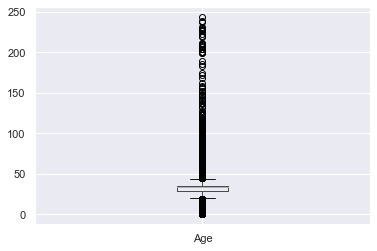

In [52]:
user.boxplot('Age')

### ------------> OBSERVATION
***
As we can see, there are some 0 values for age columns. It's not true for an infant who are 0 year old to read book!! Moreover, are also some values that users are over 100 years old. So I would like to see those impossible values.

> - The user who are 0 year old are impossible so I would like to drop
> - From my personal point of view, the recommender system should better concentrates on the people who are from 5 to 90 years old, since this is the normal range for age.


In [53]:
df_filtered = user[(user["Age"] < 5)|(user["Age"] >= 90)]
print(len(df_filtered)/ len(user) * 100)
df_filtered

0.468924094065214


,User_ID,Age,Country
219,220,0,COLOMBIA
469,470,0,AMERICA
561,562,0,ALBANIA
612,613,1,TURKEY
670,671,1,SAUDI ARABIA
...,...,...,...
277107,277108,104,SWITZERLAND
277503,277504,103,AMERICA
277558,277559,98,AMERICA
277908,277909,2,AMERICA


### ------------> OBSERVATION
***
These values just accounts for just a small amount of number. Moreover, the age of people who are out of the normal range I would like to drop these column.

In [54]:
user.drop(user[(user["Age"] < 5)|(user["Age"] >= 90)].index, inplace = True)

> **Sample Rating Dataset**

In [55]:
# see the static of all numerical column
rating.describe().T

,count,mean,std,min,25%,50%,75%,max
User_ID,433671.0,135458.743451,80678.385078,8.0,66619.0,133184.0,205735.0,278854.0
Book_Rating,433671.0,7.601066,1.843798,1.0,7.0,8.0,9.0,10.0


<AxesSubplot:>

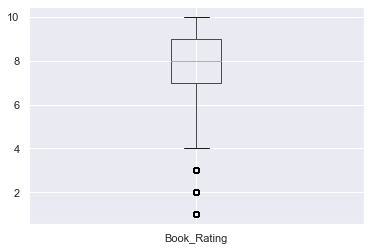

In [56]:
rating.boxplot('Book_Rating')

<a id="2.10"></a>
## 📌 2.10 Age Range
***
> - In the recommendation system, one of the most considerable factor for generating a valuable recommendation is the age. Some of the book that is not for the child who are under 18 should not be recommended to the children. Since then, I want to create a new column which is `Age_Range`.
> - Secondly, the `Age` Column is the ordinal so this column is appropriate to do that.

In [57]:
# create a list of my conditions
conditions = [
    (user['Age'] < 18),
    (user['Age'] >= 18) & (user['Age'] <= 36),
    (user['Age'] > 36) & (user['Age'] <= 40),
    (user['Age'] > 40) & (user['Age'] <= 60),
    (user['Age'] > 60) & (user['Age'] < 90),
    ]

# create a list of the values we want to assign for each condition
values = ['Under 18', '18-36', '36-40', '40-60', '60-90']

# create a new column and use np.select to assign values to it using our lists as arguments
user['Age_Range'] = np.select(conditions, values)

# display updated DataFrame
user.head()

,User_ID,Age,Country,Age_Range
0,1,34,AMERICA,18-36
1,2,18,AMERICA,18-36
2,3,34,RUSSIA,18-36
3,4,17,PORTUGAL,Under 18
4,5,34,UNITED KINGDOM,18-36


<a id="2.11"></a>
# 🗞 2.11 Merge column
***
I want to have a deeper look in the EDA step so I want to merge some the pair dataframe together.
> - First, I'll join the `book` dataframe with the `rating` dataframe on the ISBN field.

<a id="2.11.1"></a>
## ️🎳 2.11.1 Merge book and rating
****

In [58]:
print(f'Book dataframe size: {len(book)}')
print(f'Rating dataframe size: {len(rating)}')
book_with_rating = rating.join(book.set_index('ISBN'), on='ISBN')
print(f'New dataframe size: {len(book_with_rating)}')

Book dataframe size: 266735
Rating dataframe size: 433671
New dataframe size: 439108


## Restrict books to a "single ISBN per book"
***
I want to have a look at the book titles which have a mutiple associate ISBN numbers.


In [59]:
book_with_rating['Unique_ISBN'] = book_with_rating['ISBN']
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('LITTLE WOMEN'), 'Unique_ISBN'] = '0671517643'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('WUTHERING HEIGHTS'), 'Unique_ISBN'] = '0553212583'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('THE SECRET GARDEN'), 'Unique_ISBN'] = '0812505018'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('DRACULA'), 'Unique_ISBN'] = '9875021245'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('THE NIGHT BEFORE CHRISTMAS'), 'Unique_ISBN'] = '1569872848'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('ADVENTURES OF HUCKLEBERRY FINN'), 'Unique_ISBN'] = '0835902242'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('JANE EYRE'), 'Unique_ISBN'] = '1566193028'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('PRIDE AND PREJUDICE'), 'Unique_ISBN'] = '1566190932'
book_with_rating.loc[book_with_rating['Book_Title'].str.contains('GREAT EXPECTATIONS'), 'Unique_ISBN'] = '1551111748'


In [60]:
book_with_rating['Unique_ISBN'] = book_with_rating['Unique_ISBN'].str.replace('[A-Z]', '')

<a id="2.11.2"></a>

## ️🎭 2.11.2 Merge user and rating
****

In [61]:
print(f'User dataframe size: {len(user)}')
print(f'Rating dataframe size: {len(rating)}')
user_with_rating = rating.join(user.set_index('User_ID'), on='User_ID')
print(f'New dataframe size: {len(user_with_rating)}')

User dataframe size: 269775
Rating dataframe size: 433671
New dataframe size: 433671


<a id="2.11.3"></a>
## 🎩 2.11.3 Merge `user_with_rating` and `book_with_rating`
****

In [62]:
print(f'Books+Ratings table size: {len(book_with_rating)}')
print(f'Users table size: {len(user)}')
book_user_rating = book_with_rating.join(user.set_index('User_ID'), on='User_ID')
print(f'New "books_users_ratings" table size: {len(book_user_rating)}')

print(f'Before dropping: {len(book_user_rating)}')

book_user_rating.dropna(inplace=True)

print(f'After dropping: {len(book_user_rating)}')


Books+Ratings table size: 439108
Users table size: 269775
New "books_users_ratings" table size: 439108
Before dropping: 439108
After dropping: 362357


<a id="2.12"></a>
# 📂 2.12 Save the Intermediate data
***
After the cleaning step, all data is saved to a csv file for visualisation step later.

In [63]:
user.to_csv("Data/user_cleaned.csv", encoding='utf-8')
book.to_csv("Data/book_cleaned.csv", encoding='utf-8')
rating.to_csv("Data/rating_cleaned.csv", encoding='utf-8')
book_user_rating.to_csv("Data/book_user_rating_cleaned.csv", encoding='utf-8')

<a id="3"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 📊 3. Data exploration (EDA)</strong></h1>

<a id="3.1"></a>
# 3.1 Distribution of Rating
******

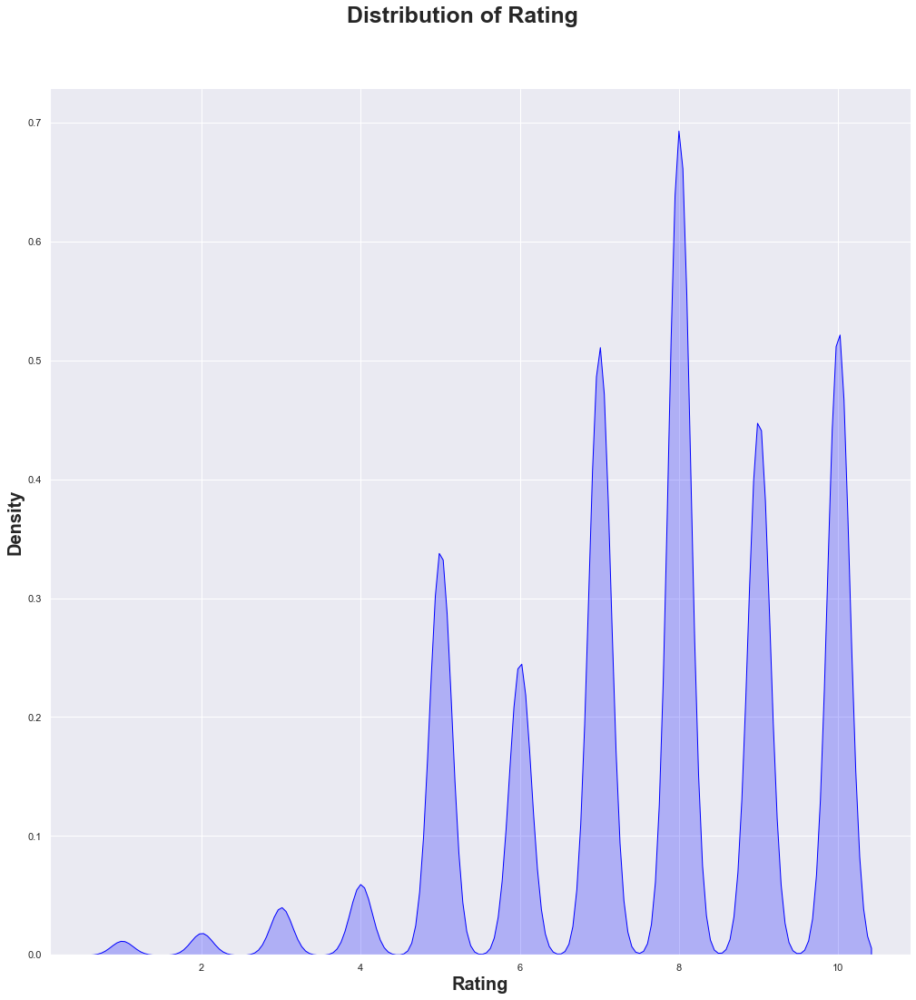

In [64]:
f.plot_density_rating(rating)

# Number of each rating in bar plot

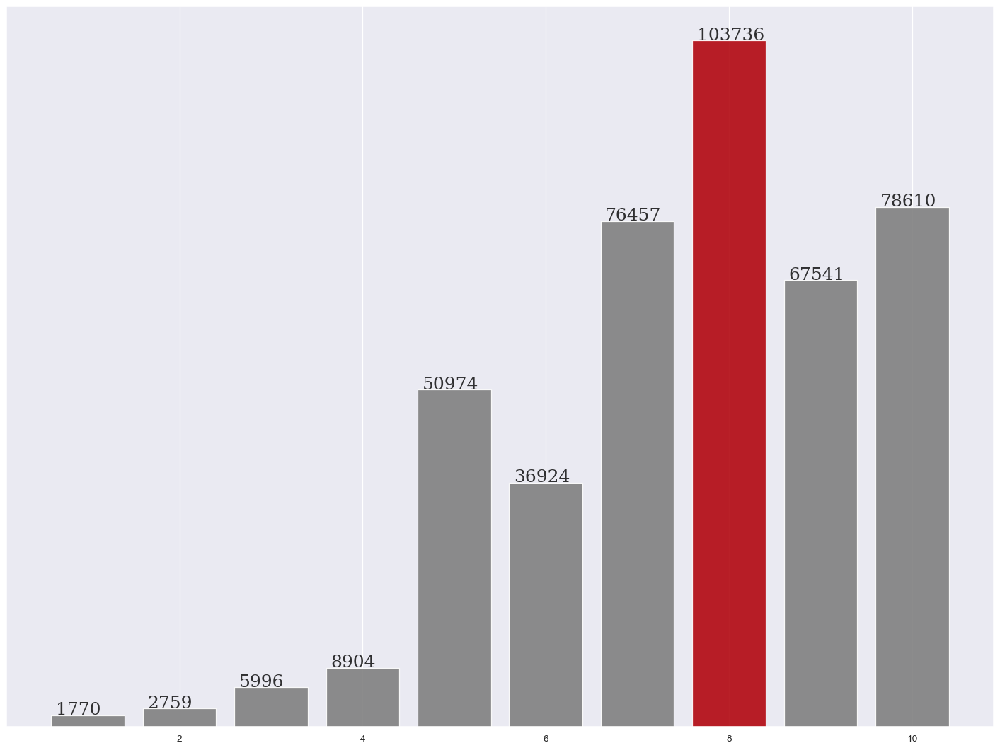

In [65]:
f.plot_number_of_rating_point(rating)

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>

<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>

<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li><span style="color:#122ecc;">Rating 8</span> is the most rated value</li>
    <li>Users often tend to give rating for the book that they really like rather than the book that they do not like, so that the rating <span style="color:#122ecc;">from 1 to 4</span> is relatively low</li>
</ul>
</div>




<a id="3.2"></a>
# 3.2 How old are the users?
******

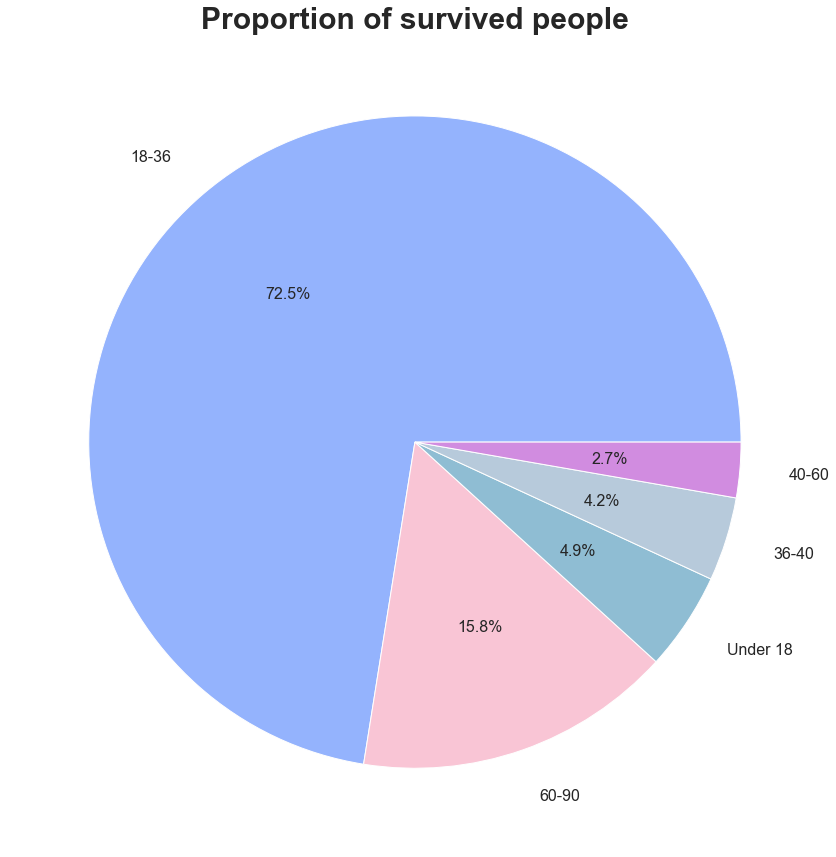

In [66]:
plt.rcParams['figure.figsize'] = [20, 15]
# Pie chart
labels = ['18-36', '60-90', 'Under 18', '36-40', '40-60']
#colors
colors = ['#94B3FD', '#F9C5D5', '#8FBDD3' ,'#B7CADB', '#D18CE0']
ax = plt.pie(user['Age_Range'].value_counts(), labels=labels, labeldistance=1.15, colors=colors, autopct='%1.1f%%', textprops={'fontsize': 16});
plt.title('Proportion of survived people', fontsize=30, fontweight = 'bold')
plt.show()

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Suprisingly, most of users are at <span style="color:#122ecc;">18-36 years old</span> 
        with over 72 percent </li>
    <li>In the second place, there are over  <span style="color:#122ecc;">15 percent</span> of the readers are at
         <span style="color:#122ecc;">60-90 years old</span>.</li>
    <li>The readers who are <span style="color:#122ecc;">under 18 is under 5 percent</span>. This group is one of the most considerable group since the content of book must be appropriate for them, but they are just a minor factor in our recommender system</li>
    <li>Both of the group <span style="color:#122ecc;">36-40 and 40-60</span> year-old reader still under 7 percent
    </li>
    <li>Hence, in this book recommender system we should concentrate on the group <span style="color:#122ecc;">18-36 and 60-90</span> year-old readers
    </li>
</ul>
</div>

<a id="3.3"></a>
# 3.3 The 10 country having the highest amount of users:
******

## Just the box plot

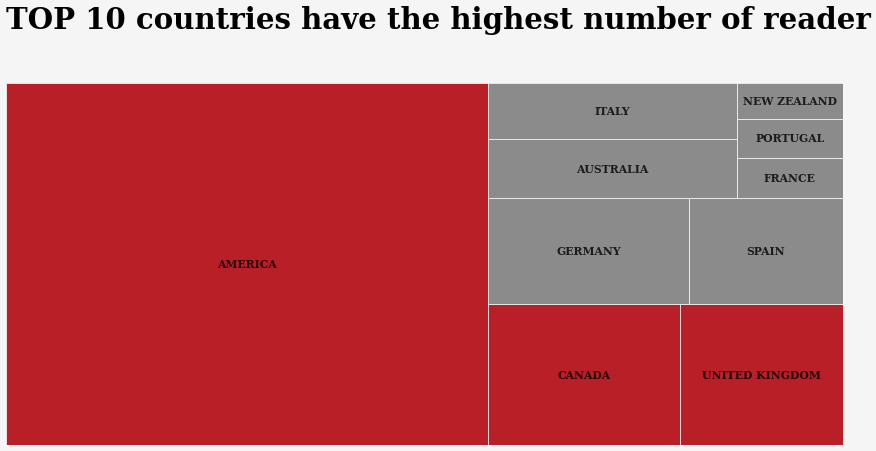

In [67]:
f.plot_box_country(user)

## World map

In [68]:
f.plot_world_map(user)

NameError: name 'coco' is not defined

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Top 10 countries having the highest readers which are <span style="color:#122ecc;">USA, CANADA, UNITED KINGDOM, GERMANY, SPAIN, AUSTRALIA, ITALY, FRANCE, PORTUGAL, NEW ZEALAND</span> </li>
    <li> <span style="color:#122ecc;">USA</span> has the highest users and the number of user is higher than 7 times compare to other countries </li>
</ul>
</div>

<a id="3.4"></a>
# 3.4 When did these books were published:
******

In [ ]:
yr = book.Publication_year.value_counts().sort_index()
# I just want to fill the book that have occured 5 times
yr = yr.where(yr>5)
plt.figure(figsize=(20, 10))
plt.rcParams.update({'font.size': 15}) # Set larger plot font size
plt.bar(yr.index, yr.values)
plt.xlabel('Year of Publication')
plt.ylabel('counts')
plt.show()

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>Most of the book have been released in  <span style="color:#122ecc;">2000s</span> </li>
    <li>Currently, our service is not ideal for people who like to read old book which was published in the <span style="color:#122ecc;">1960s</span> </li>
</ul>
</div>

<a id="3.5"></a>
# 3.5 Average rating and number of ratings of the most popular books:
*****

In [ ]:
sns.set_style('white')

df_books_title = book_user_rating.groupby('Book_Title').agg({'ISBN': 'count', 'Book_Rating': 'mean'}).reset_index()
df_books_title.columns = ['Title', 'count', 'avg_rating']

titles_top_popular = df_books_title.sort_values('count', ascending=False).head(20)
f.draw_top_chart(titles_top_popular, 'Title', ['avg_rating', 'count'], 'Average rating and number of ratings of the most popular books')


<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>The rating point for popular book is in range around from  <span style="color:#122ecc;">4 to 9</span> </li>
    <li>The <span style="color:#122ecc;">Wild Animus</span> has the lowest rating point</li>
    <li>Three <span style="color:#122ecc;">Harry Potter</span> series has the highest rating point</li>
</ul>
</div>

<a id="3.6"></a>
# 3.6 Average rating and number of ratings of the most popular authors:
*****

In [ ]:
df_books_author = book_user_rating.groupby('Book_Author').agg({'ISBN': 'count', 'Book_Rating': 'mean'}).reset_index()
df_books_author.columns = ['Author', 'count', 'avg_rating']


authors_top_popular = df_books_author.sort_values('count', ascending=False).head(20)
f.draw_top_chart(authors_top_popular, 'Author', ['avg_rating', 'count'], 'Average rating and number of ratings of the most popular authors')

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=15uX4fnuDMuki2xAnjK8wv-ifJhAkBtJ2" align="left" hspace="10px" vspace="0px"></p>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:'Times New Roman';font-size:30px;font-style: italic;color:  #6468e8">OBSERVATION:</li>
</ul>
<div class="alert alert-info" role="alert">
<ul style="list-style-type:circle;font-family:Yu Mincho Demibold;font-size:20px;color:black">
    <li>The rating point for popular author is in range around from  <span style="color:#122ecc;">7 to 9</span> </li>
    <li>The <span style="color:#122ecc;">Danielle Steel</span> has the lowest rating point</li>
    <li>Three <span style="color:#122ecc;">J.K. Rowling</span> has the highest rating point</li>
</ul>
</div>

<a id="3.4"></a>

<p><img alt="Insight logo" src="https://drive.google.com/uc?export=view&id=14dpaeXX-ajsM8quwe3dCCdQdrdvf29iI" align="left" hspace="20px" vspace="20px" width="45" height="60" ></p>
<br>
<ul style="list-style-type:none;">
  <li style="font-weight: bold;font-family:Yu Mincho Demibold;font-size:40px;font-style: italic;color:  #6468e8">3.4 Summary</li>
</ul>
<ul style="list-style-type:none;font-family:Yu Mincho Demibold;font-size:20px;color:  black">
    <br>
    
*******
    
<li>1. <span style="color:#122ecc;">Rating 8</span> is the most rated value.</li>
<br>
<li>2. Users often tend to give rating for the book that they really like rather than the book that they do not like, so that the rating <span style="color:#122ecc;">from 1 to 4</span> is relatively low.</li>
<br>
<li>3. Suprisingly, most of users are at <span style="color:#122ecc;">18-36 years old</span>with over 72 percent</li>
<br>
<li>4. In the second place, there are over  <span style="color:#122ecc;">15 percent</span> of the readers are at
         <span style="color:#122ecc;">60-90 years old</span>.</li>
<br>
<li>5. The readers who are <span style="color:#122ecc;">under 18 is under 5 percent</span>. This group is one of the most considerable group since the content of book must be appropriate for them, but they are just a minor factor in our recommender system.</li>
<br>
<li>6. Both of the group <span style="color:#122ecc;">36-40 and 40-60</span> year-old reader still under 7 percent</li>
<br>    
<li>7. Hence, in this book recommender system we should concentrate on the group <span style="color:#122ecc;">18-36 and 60-90</span> year-old readers.</li>
<br>    
<li>8. Top 10 countries having the highest readers which are <span style="color:#122ecc;">USA, CANADA, UNITED KINGDOM, GERMANY, SPAIN, AUSTRALIA, ITALY, FRANCE, PORTUGAL, NEW ZEALAND</span>.</li>
<br>    
<li>9. <span style="color:#122ecc;">USA</span> has the highest users and the number of user is higher than 7 times compare to other countries.</li>
<br>
<li>10. Most of the book have been released in  <span style="color:#122ecc;">2000s</span>.</li>
<br>    
<li>11. Currently, our service is not ideal for people who like to read old book which was published in the <span style="color:#122ecc;">1960s</span>.</li>
<br>    
<li>12. The rating point for popular book is in range around from  <span style="color:#122ecc;">4 to 9</span> </li>
<br> 
<li>13. The <span style="color:#122ecc;">Wild Animus</span> has the lowest rating point.</li>
<br>     
<li>14. Three <span style="color:#122ecc;">Harry Potter</span> series has the highest rating point.</li>
<br>     
<li>15. The rating point for popular author is in range around from  <span style="color:#122ecc;">7 to 9</span> .</li>
<br>     
<li>16. The <span style="color:#122ecc;">Danielle Steel</span> has the lowest rating point.</li>
<br>     
<li>17. Three <span style="color:#122ecc;">J.K. Rowling</span> has the highest rating point.</li>
<br>      
</ul>

<a id="4"></a>
<h1 style="color:#ffc0cb;font-size:40px;font-family:Georgia;text-align:center;"><strong> 🔬 4. Statistical test & Principal Componet Analysis (PCA)</strong></h1>

<a id="4.1"></a>
# 4.1 Statistical test:
******
Find the max time people have rated

In [ ]:
users_interactions_count_df = book_user_rating.groupby(['User_ID', 'ISBN']).size().groupby('User_ID').size()
print('# users: %d' % len(users_interactions_count_df))
users_with_enough_interactions_df = users_interactions_count_df[users_interactions_count_df >= 5].reset_index()[['User_ID']]
print('# users with at least 5 interactions: %d' % len(users_with_enough_interactions_df))